# Purpose of the Code

The goal of this notebook is to perform feature selection and evaluate the performance of various machine learning models, identifying the optimal combination of features and models to improve predictive performance and reduce model complexity.

## Environment Setup

In [1]:
# pip install libemg  # Required only if you have never installed the libemg package
# pip install --upgrade paramiko cryptography  # Needed during first-time installation of libemg to resolve dependencies

In [2]:
import os
import pandas as pd
import numpy as np
import sys
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.model_selection import  train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from libemg.feature_selector import FeatureSelector
sys.path.append('../lib')
from fs_utils import (plot_label_distribution, balance_via_undersampling, plot_feature_vs_label, plot_feature_correlation,
                        drop_highly_correlated_features, report_remaining_high_correlations, prepare_cv_data, plot_feature_accuracy,
                        plot_sequential_selection_heatmap, plot_feature_selection_performance, plot_pca_variance)
from me_utils import evaluate_emg_classifier, evaluate_and_store_results, print_results

In [3]:
# Parameters
date = "_test"     # Recording date in MM_DD format
subj = "all12"     # Subject ID, e.g., "01", "02", etc.
preferred_features = ['MAV_', 'SSC_', 'WL_', 'ZC_'] # List of preferred EMG features for selection
labels = ['no weight', 'light', 'medium', 'heavy'] # List of possible labels
label_map = {'no weight': 0, 'light': 1, 'medium': 2, 'heavy': 3} # Map string labels to integers for modeling
metric = "accuracy" # Metric used during feature selection, possible choice 
                    # between "accuracy", "activeerror", "meansemiprincipalaxis", "featureefficiency", "repeatability", "seperability"
n_folds = 5 # Number of folds to use for cross-validation for feature selection
th = 0.85 # Threshold for features with correlation
fs = FeatureSelector() # Initialize FeatureSelector object for feature selection tasks
scaler = StandardScaler() # Initialize StandardScaler object
results = {}  # Dictionary to store results scores keyed by model name

# Initialize variables based on device
bins_trigno = [0, 0.10, 0.20, 0.42, np.inf]
labels_MAV_trigno = ['0-0.10', '0.10-0.20', '0.20-0.42', '0.42+']
ref_feature_trigno = "MAV_emg_trigno_biceps"
bins_myo = [0, 0.15, 0.4, 0.75, np.inf]
labels_MAV_myo = ['0-0.15', '0.15-0.40', '0.40-0.75', '0.75+']
ref_feature_myo = "MAV_emg_channel_5"

suffixes_emg_myo = ['emg_channel_1', 'emg_channel_2', 'emg_channel_3', 'emg_channel_4',
                    'emg_channel_5', 'emg_channel_6', 'emg_channel_7', 'emg_channel_8']
suffixes_emg_trigno = ['emg_trigno_biceps', 'emg_trigno_triceps']
suffixes_emg = suffixes_emg_myo + suffixes_emg_trigno

suffixes_imu_myo = ['myo_ACC_X', 'myo_ACC_Y', 'myo_ACC_Z', 'myo_GYR_X', 'myo_GYR_Y', 'myo_GYR_Z', 'myo_ACC_all', 'myo_GYR_all']
suffixes_imu_trigno = ['biceps_ACC_X', 'biceps_ACC_Y', 'biceps_ACC_Z', 'biceps_GYR_X', 'biceps_GYR_Y', 'biceps_GYR_Z', 
                        'triceps_ACC_X', 'triceps_ACC_Y', 'triceps_ACC_Z', 'triceps_GYR_X', 'triceps_GYR_Y', 'triceps_GYR_Z', 
                        'biceps_ACC_all', 'biceps_GYR_all', 'triceps_ACC_all', 'triceps_GYR_all']

suffixes_imu = suffixes_imu_myo + suffixes_imu_trigno
suffixes_myo = suffixes_emg_myo + suffixes_imu_myo 
suffixes_trigno = suffixes_emg_trigno + suffixes_imu_trigno
                
# Paths for input and output
input_folder = f'../data/extracted_features/{date}'  # Input folder with raw data
file_name = f'dataset_{subj}.csv'  
output_folder = f'../data/models/{date}/{subj}'  # Output folder

# Loading Data Files

In [4]:
file_path = os.path.join(input_folder, file_name)
df = pd.read_csv(file_path)
df.head()

,MAV_biceps_ACC_X,MNF_biceps_ACC_X,MNP_biceps_ACC_X,SKEW_biceps_ACC_X,VAR_biceps_ACC_X,WAMP_biceps_ACC_X,WL_biceps_ACC_X,ZC_biceps_ACC_X,MAV_biceps_ACC_Y,MNF_biceps_ACC_Y,...,MAV_triceps_GYR_Z,MNF_triceps_GYR_Z,MNP_triceps_GYR_Z,SKEW_triceps_GYR_Z,VAR_triceps_GYR_Z,WAMP_triceps_GYR_Z,WL_triceps_GYR_Z,ZC_triceps_GYR_Z,VM_triceps_GYR_all,label
0,0.125430,8.981675,0.001156,-0.738239,0.004513,20.0,0.198683,1.0,0.029336,34.030285,...,0.134083,4.144807,0.001179,-1.358498,0.000534,13.0,0.101637,0.0,0.177667,no weight
1,0.041659,35.194275,0.000171,1.023583,0.002612,24.0,0.203180,2.0,0.047696,15.235325,...,0.091611,10.649684,0.000588,0.397480,0.001383,26.0,0.156258,0.0,0.150622,no weight
2,0.012192,53.717988,0.000006,0.191885,0.000182,22.0,0.110384,3.0,0.049141,8.604647,...,0.087473,5.299281,0.000525,0.043150,0.000916,25.0,0.157903,0.0,0.123639,no weight
3,0.070645,22.955679,0.000453,0.498161,0.006070,26.0,0.253800,2.0,0.049784,9.916288,...,0.077093,21.962863,0.000325,-0.331525,0.005276,25.0,0.221079,1.0,0.106898,no weight
4,0.101687,11.554143,0.000712,-0.434133,0.006342,27.0,0.412818,1.0,0.070236,4.175078,...,0.038296,47.650882,0.000067,0.395207,0.001736,26.0,0.253962,2.0,0.151108,no weight


In [5]:
df.info(max_cols=10) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75387 entries, 0 to 75386
Columns: 301 entries, MAV_biceps_ACC_X to label
dtypes: float64(264), int64(36), object(1)
memory usage: 173.1+ MB


In [6]:
train_df, test_df = train_test_split(df, test_size=0.30, random_state=42) # Split into train (70%) and test (30%)
print("Train set:", train_df.shape)
print("Test set:", test_df.shape)

Train set: (52770, 301)
Test set: (22617, 301)


# Exploratory Data Analysis (EDA)

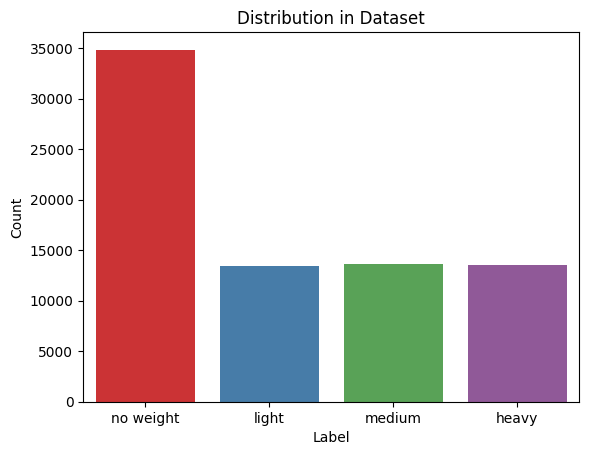

In [7]:
plot_label_distribution(df, labels, title='Distribution in Dataset') # Plot train set distribution

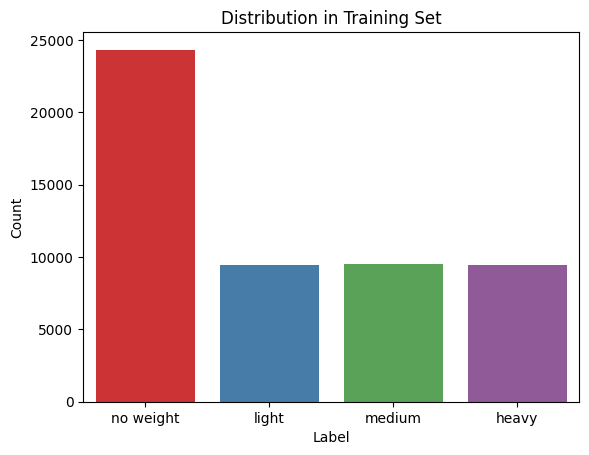

In [8]:
plot_label_distribution(train_df, labels, title='Distribution in Training Set') # Plot train set distribution

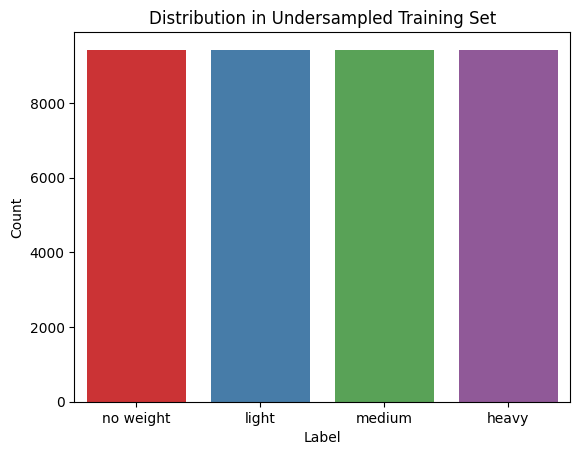

In [9]:
# Check class distribution counts
counts = train_df['label'].value_counts()
min_count = counts.min()
max_count = counts.max()

if max_count != min_count:
    train_df = balance_via_undersampling(train_df, label_col='label')
    plot_label_distribution(train_df, labels, title='Distribution in Undersampled Training Set')
else:
    print("Classes are already balanced. No undersampling performed.")

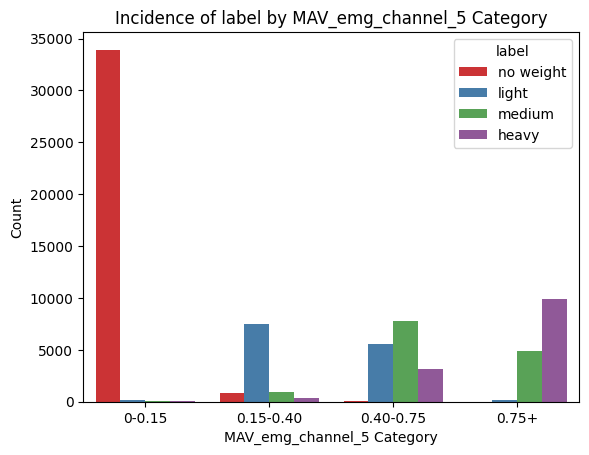

In [10]:
# Example: Correlation label-feature (MAV)
plot_feature_vs_label(df, ref_feature_myo, bins_myo, labels_MAV_myo)

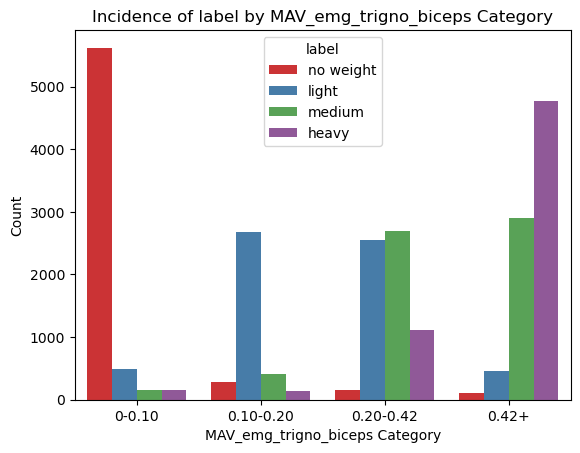

In [11]:
# Example: Correlation label-feature (MAV)
plot_feature_vs_label(train_df, ref_feature_trigno, bins_trigno, labels_MAV_trigno)

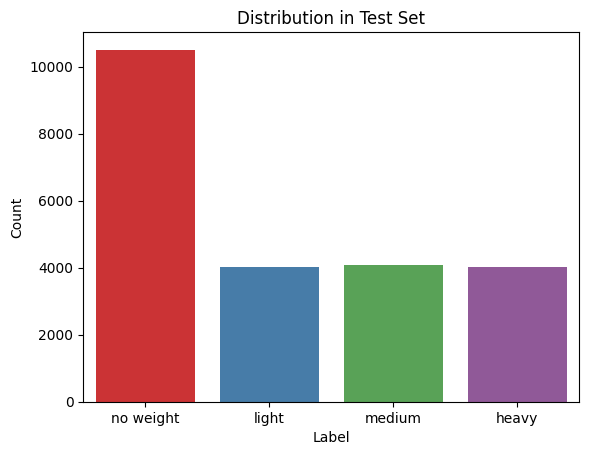

In [11]:
plot_label_distribution(test_df, labels, title='Distribution in Test Set') # Plot test set distribution

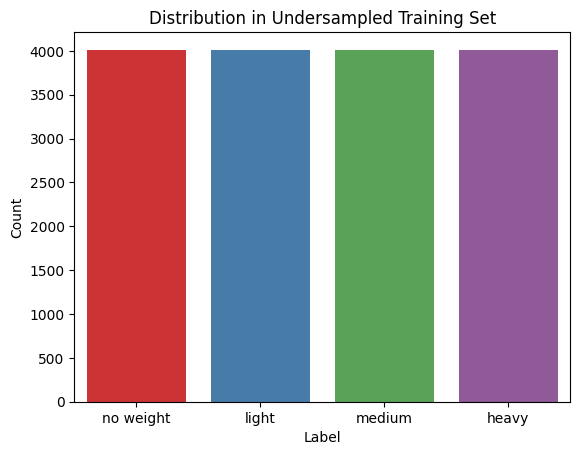

In [12]:
# Check class distribution counts
counts = test_df['label'].value_counts()
min_count = counts.min()
max_count = counts.max()

if max_count != min_count:
    test_df = balance_via_undersampling(test_df, label_col='label')
    plot_label_distribution(test_df, labels, title='Distribution in Undersampled Training Set')
else:
    print("Classes are already balanced. No undersampling performed.")

# Feature Engineering

In [13]:
# Feature Set Preparation
X_train = train_df.drop(columns=['label'])
X_test = test_df.drop(columns=['label'])

y_train = train_df['label']
y_test = test_df['label']

y_train = y_train.map(label_map)  # Convert label strings to numeric values using label_map
y_test = y_test.map(label_map)  # Convert label strings to numeric values using label_map

X = scaler.fit_transform(X_train) # Scale features to zero mean and unit variance to normalize data
X_train = pd.DataFrame(X, columns=X_train.columns, index=X_train.index) # Scaled dataframe with column names

X = scaler.transform(X_test) # Apply same scaling used on training data to test set
X_test = pd.DataFrame(X, columns=X_test.columns, index=X_test.index) # Scaled dataframe with column names

matching_cols_trigno = [col for col in X_train.columns if any(col.endswith(suf) for suf in suffixes_trigno)]
matching_cols_myo = [col for col in X_train.columns if any(col.endswith(suf) for suf in suffixes_myo)]

X_train_trigno = X_train[matching_cols_trigno]
X_test_trigno = X_test[matching_cols_trigno]
X_train_myo = X_train[matching_cols_myo]
X_test_myo = X_test[matching_cols_myo]

## EMG Feature Correlation Selection

In [14]:
matching_cols = [col for col in X_train.columns if any(col.endswith(suf) for suf in suffixes_emg)]
print(f"Number of columns with specified EMG suffixes: {len(matching_cols)}")

Number of columns with specified EMG suffixes: 150


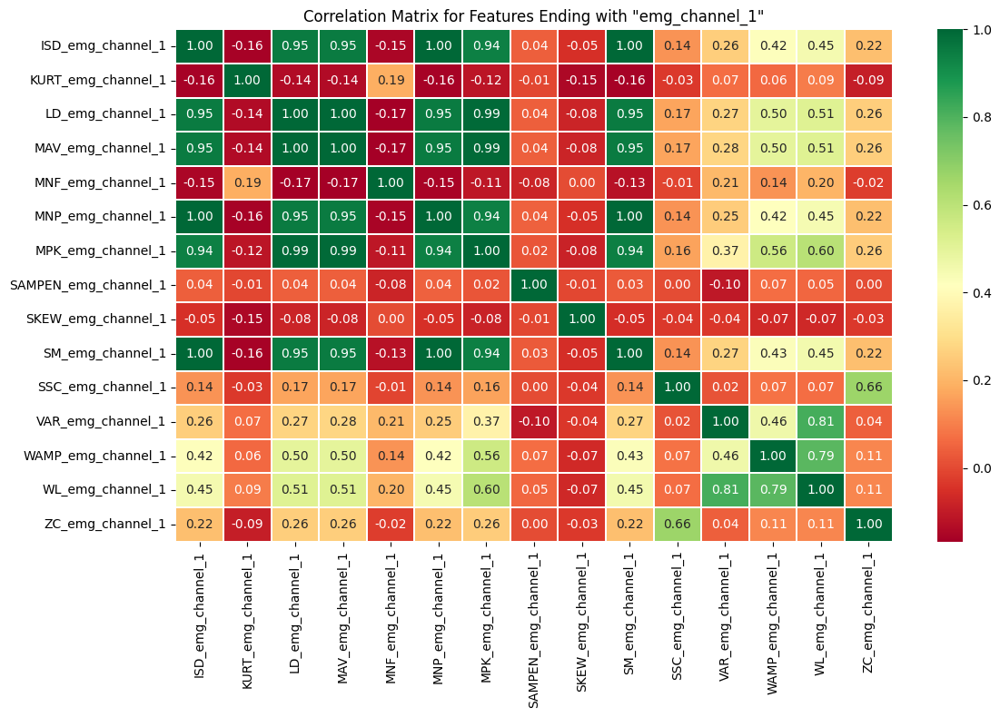

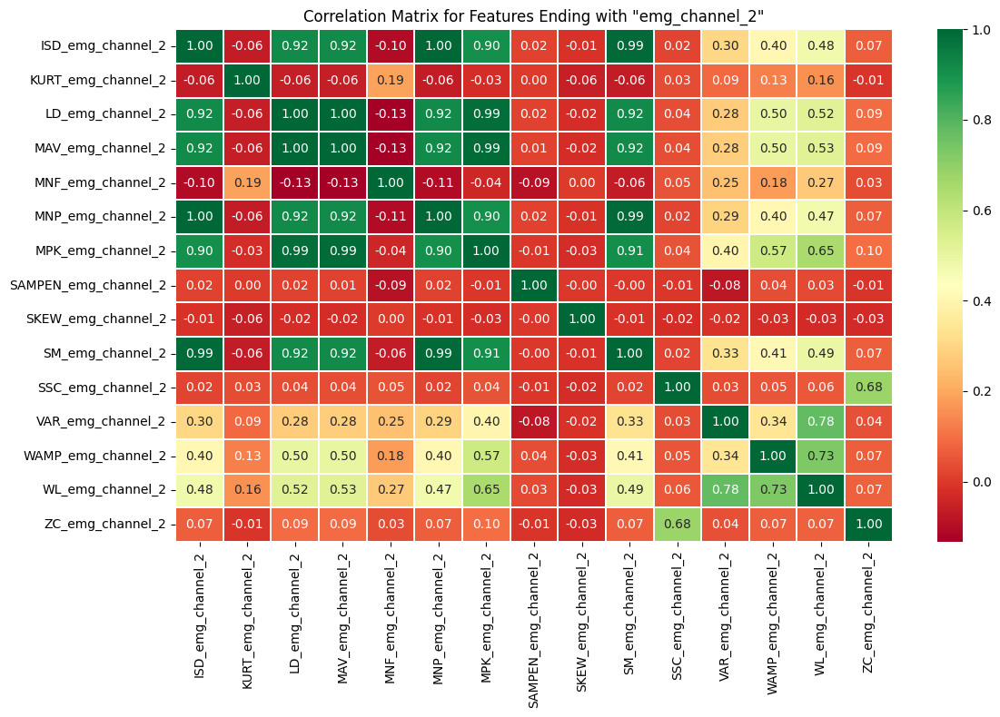

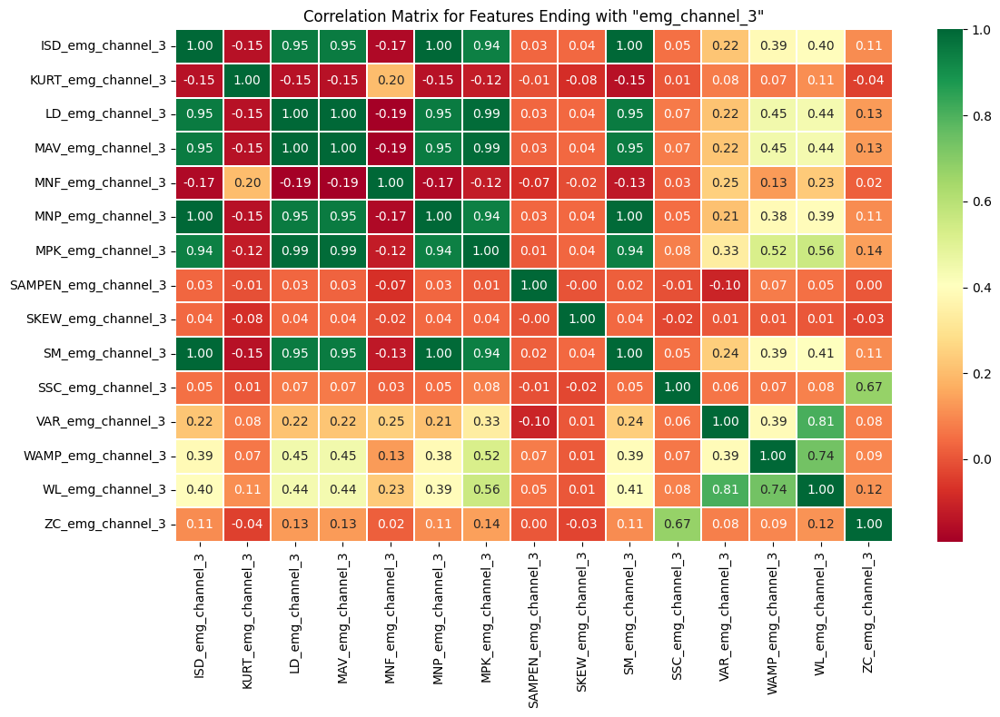

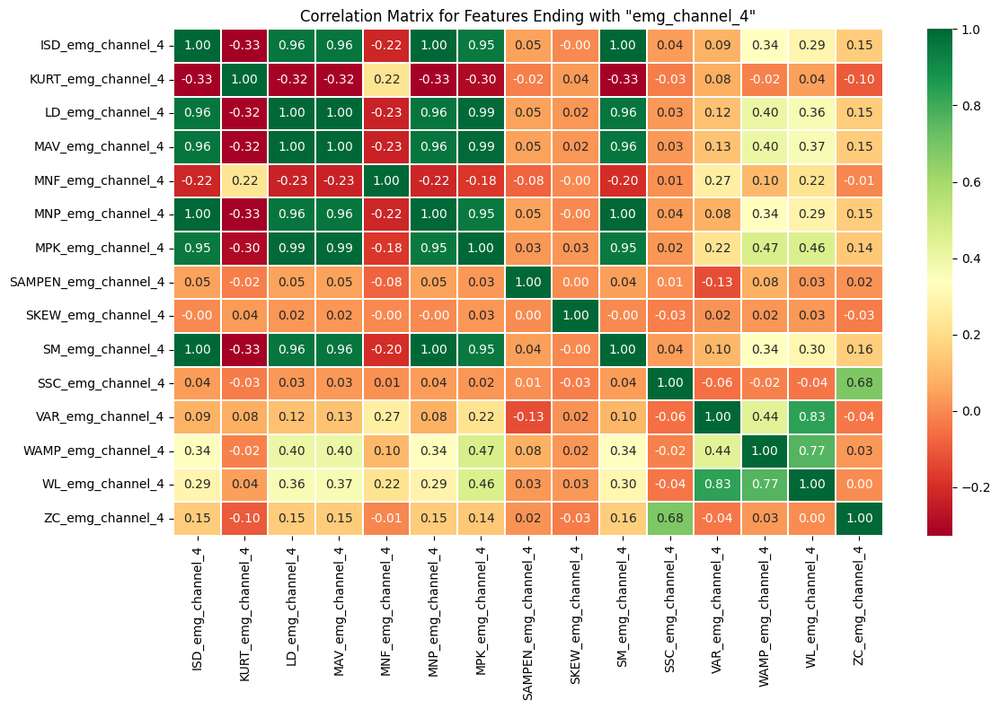

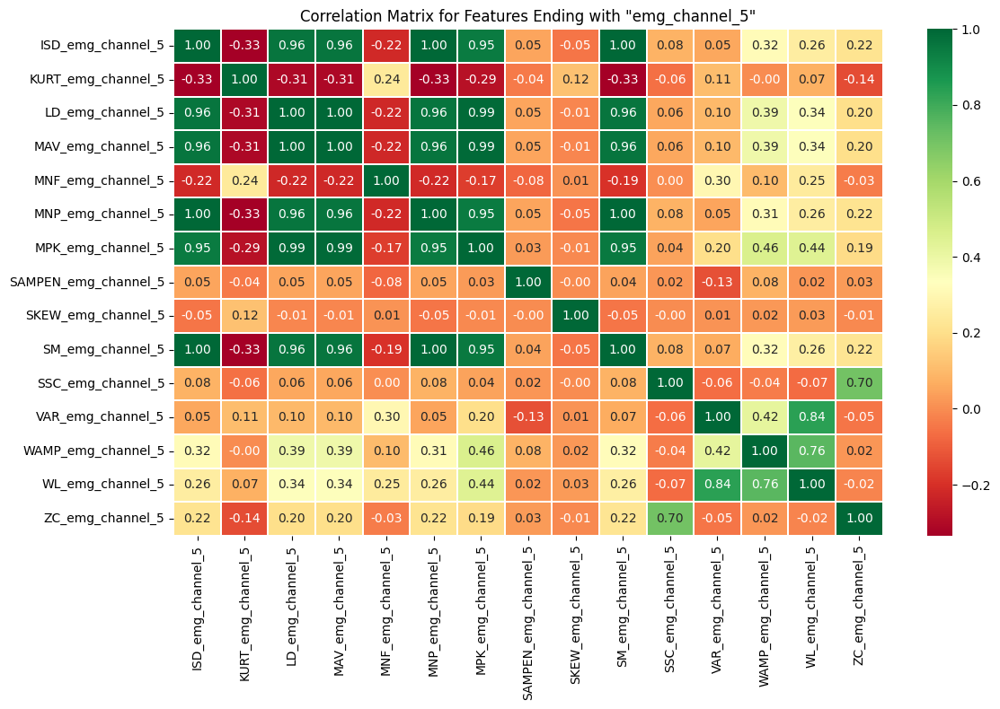

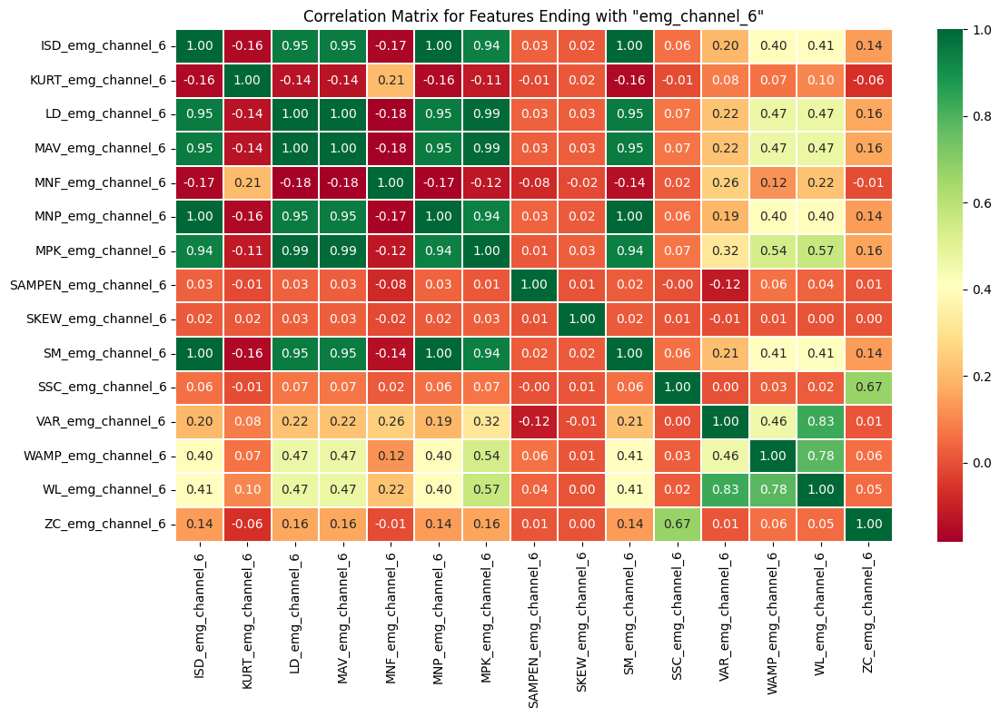

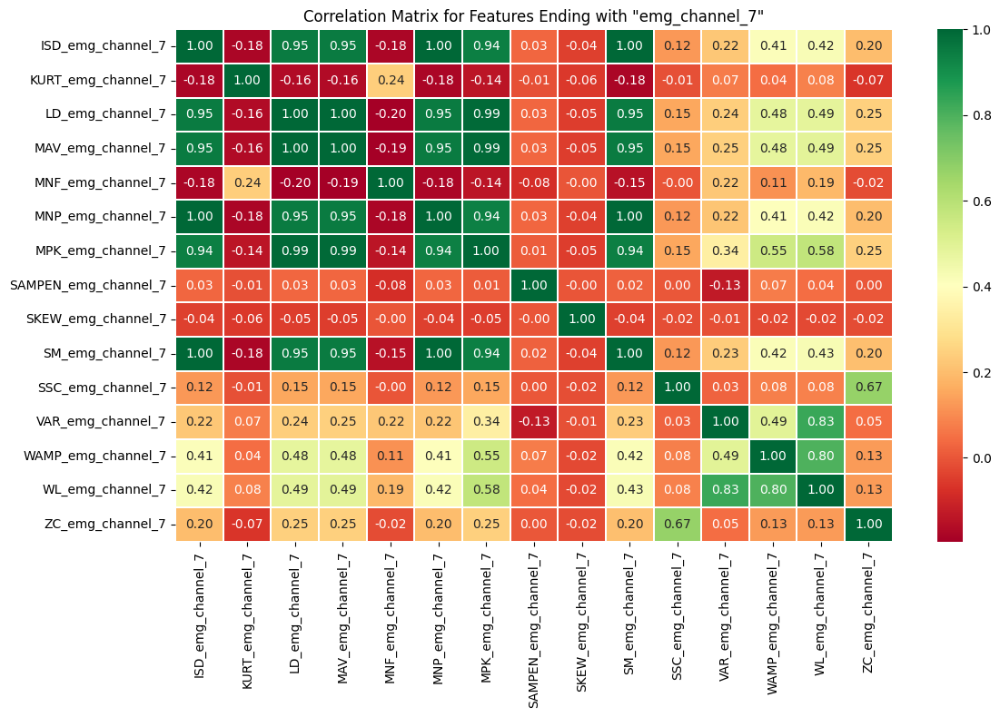

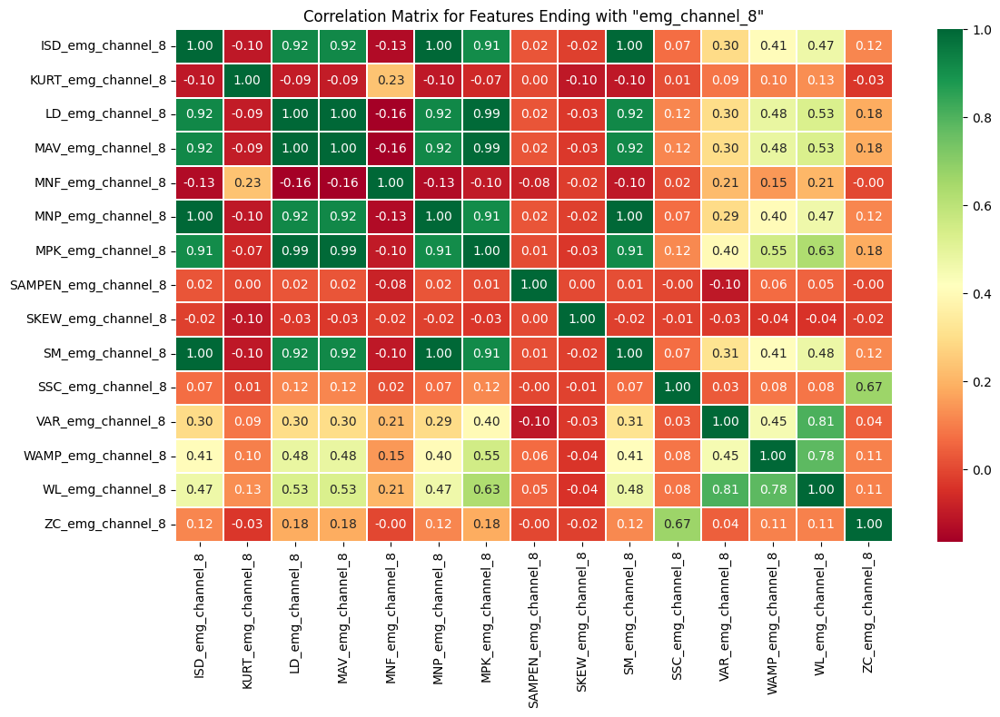

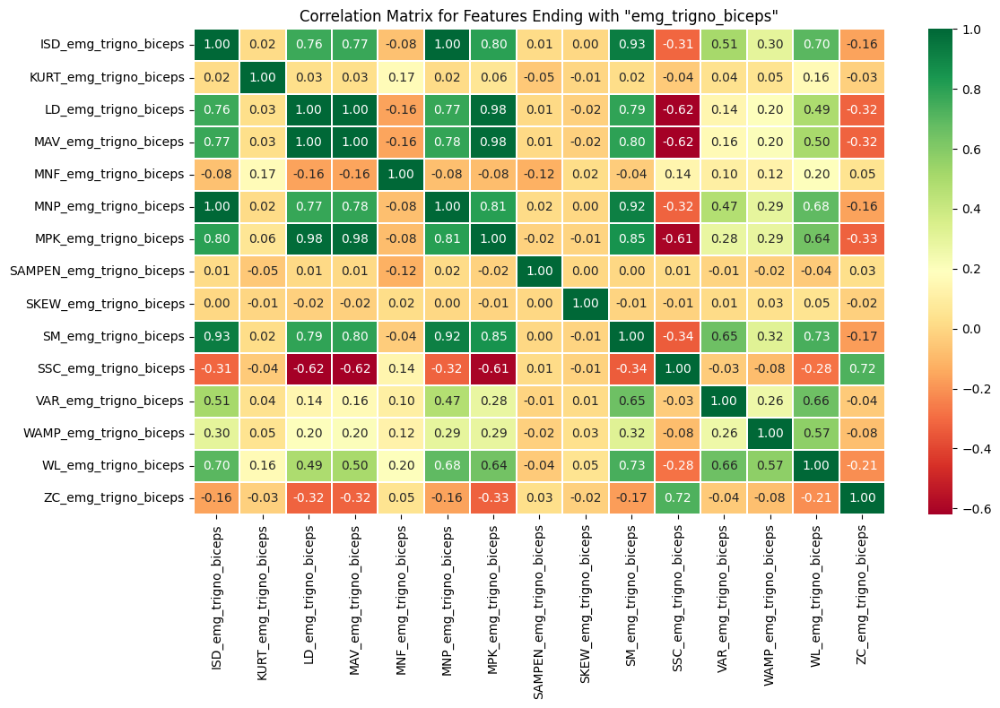

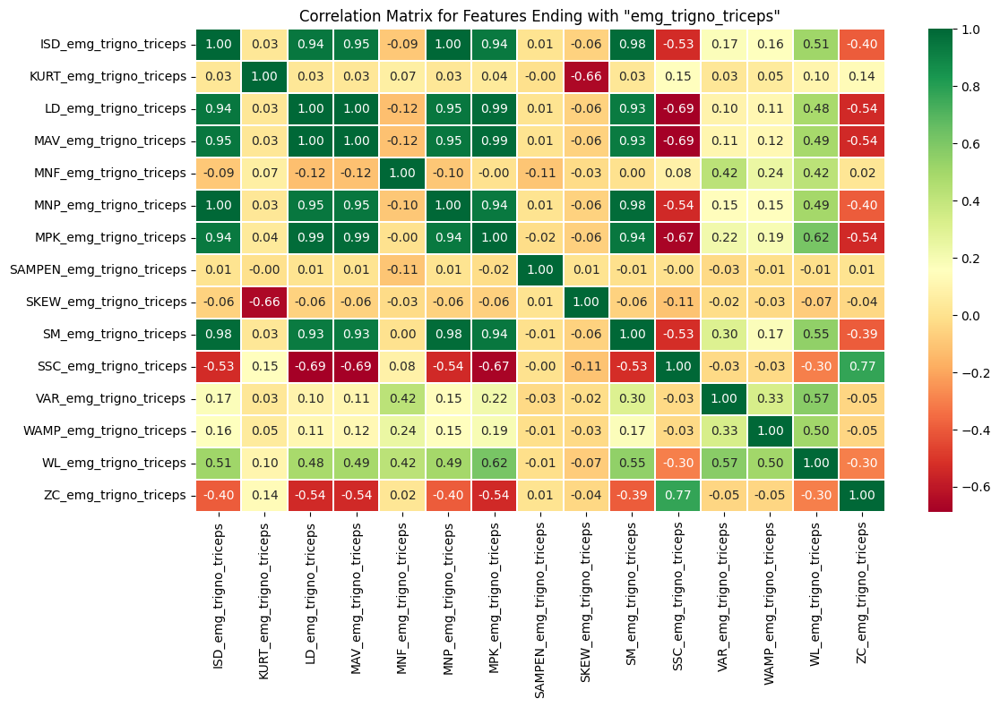

In [15]:
plot_feature_correlation(X_train, suffixes_emg) # Plot correlation matrices for groups of features (each muscle/channel)

In [16]:
# Drop redundant features within each muscle group, keeping only preferred ones
X_red = drop_highly_correlated_features(X_train, suffixes_emg, preferred_features, th)
print(f"Total remaining features: {len(X_red.columns)}")

Total remaining features: 253


In [17]:
report_remaining_high_correlations(X_red, suffixes_emg, th)

High correlation report:
ISSUE: (Intra-channel "emg_trigno_biceps") MNP_emg_trigno_biceps and ISD_emg_trigno_biceps correlated: 1.00
ISSUE: (Intra-channel "emg_trigno_biceps") SM_emg_trigno_biceps and ISD_emg_trigno_biceps correlated: 0.93
ISSUE: (Intra-channel "emg_trigno_biceps") SM_emg_trigno_biceps and MNP_emg_trigno_biceps correlated: 0.92


In [18]:
#plot_feature_correlation(X_red, all_features=True) # Plot overall correlation matrix for all remaining features

## IMU Feature Correlation Selection

In [18]:
matching_cols = [col for col in X_train.columns if any(col.endswith(suf) for suf in suffixes_imu)]
print(f"Number of columns with specified IMU suffixes: {len(matching_cols)}")

Number of columns with specified IMU suffixes: 150


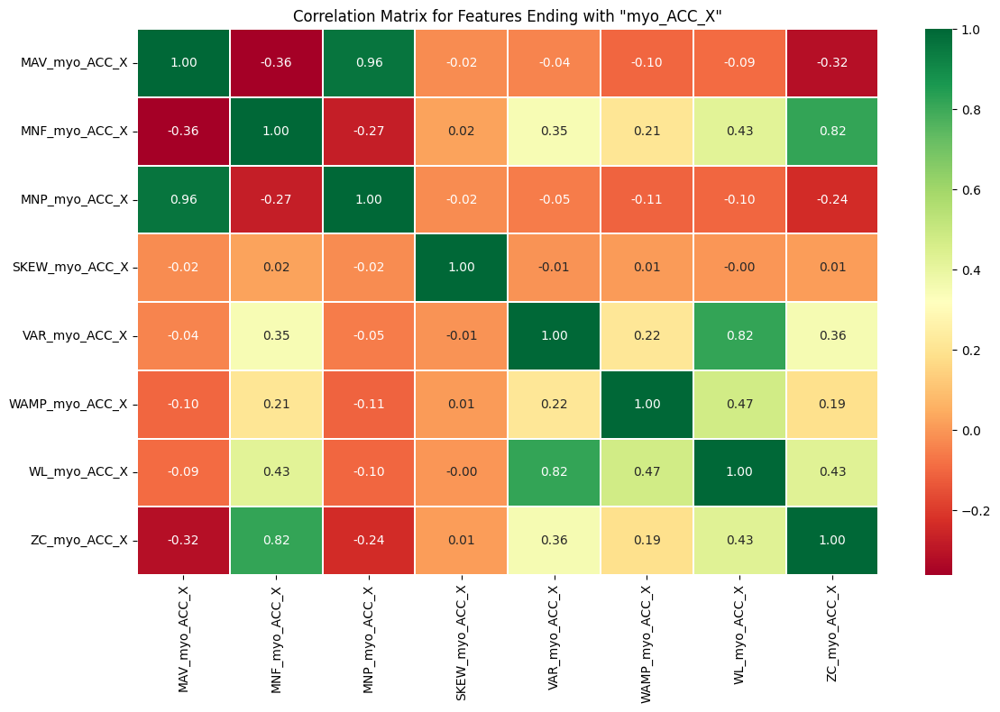

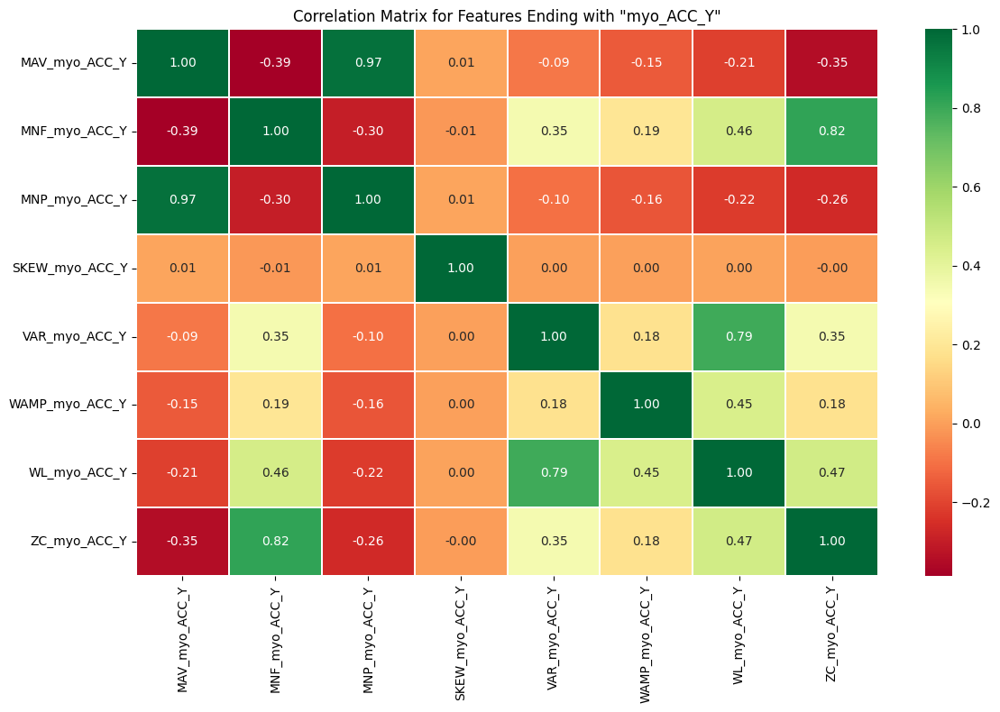

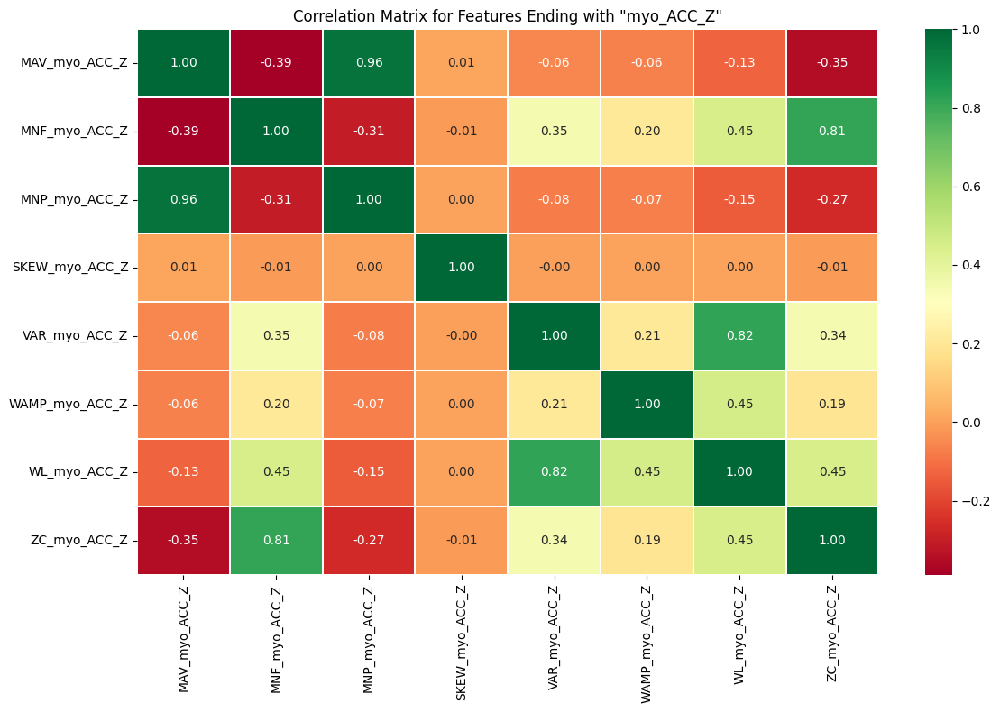

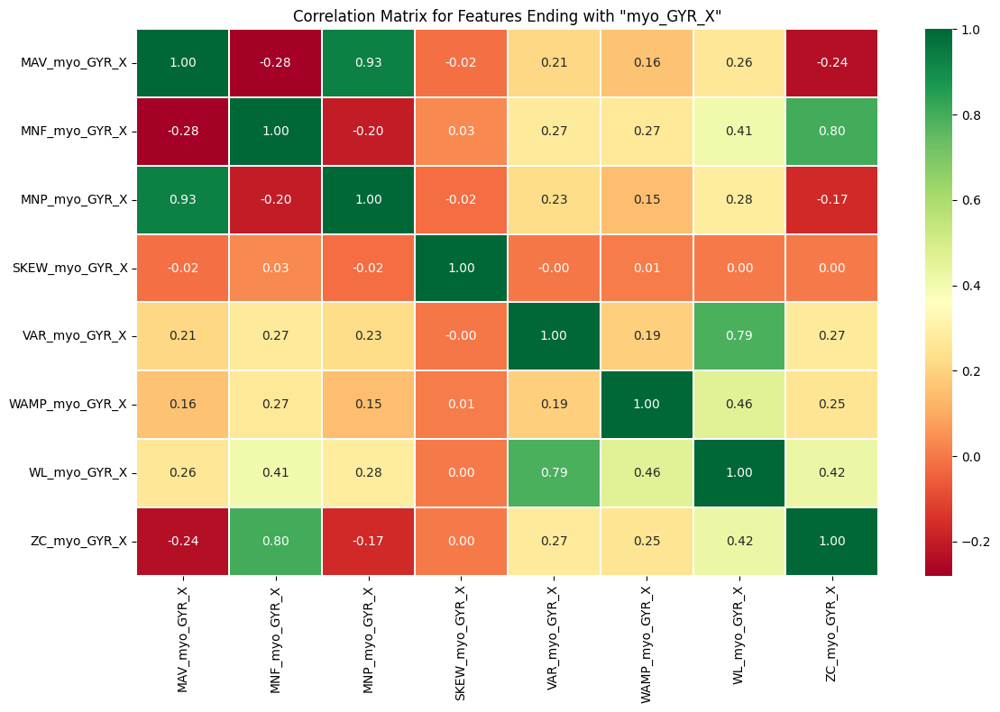

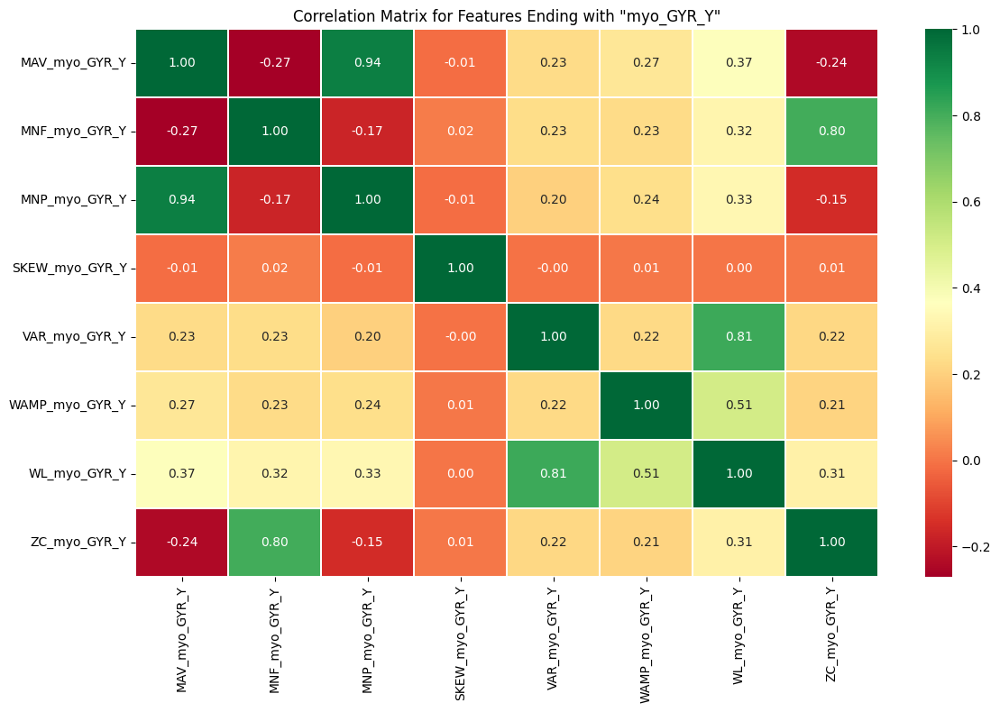

...

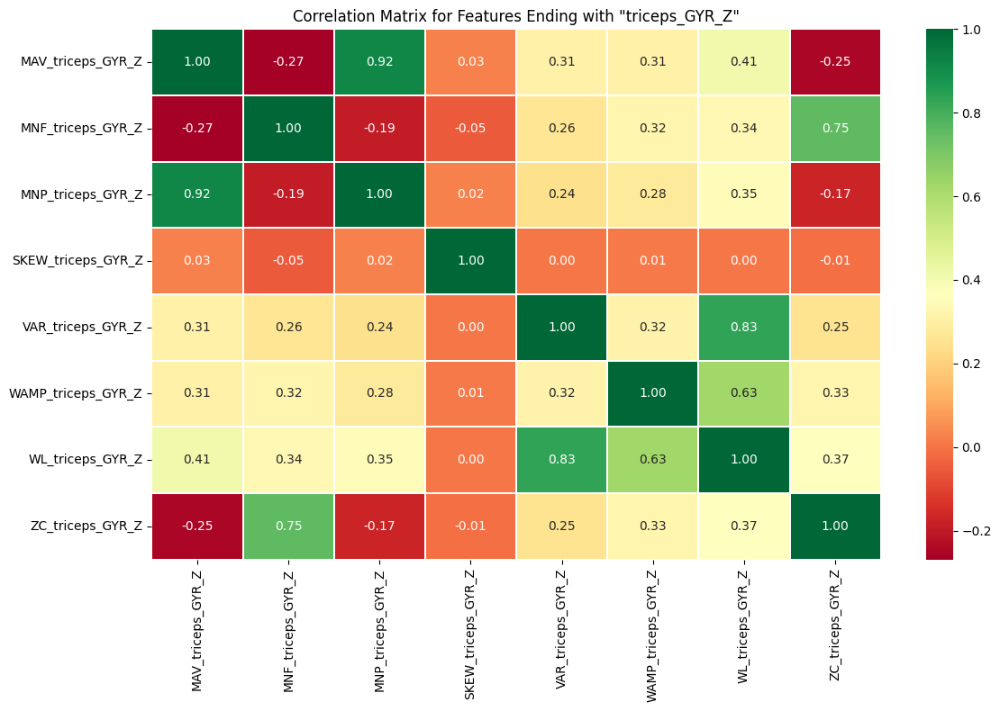

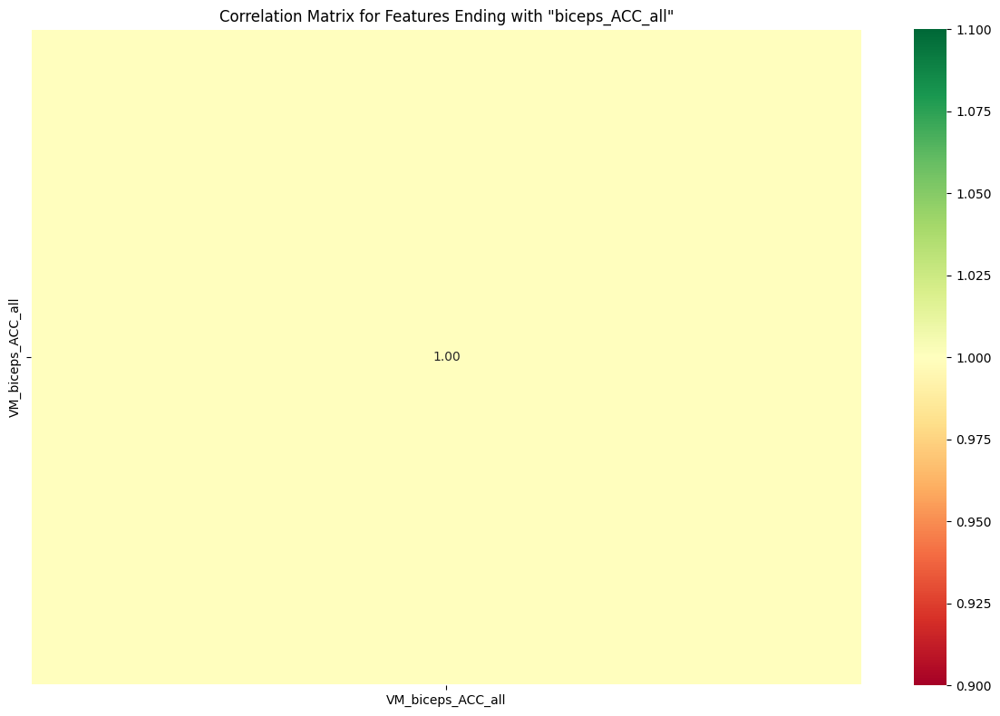

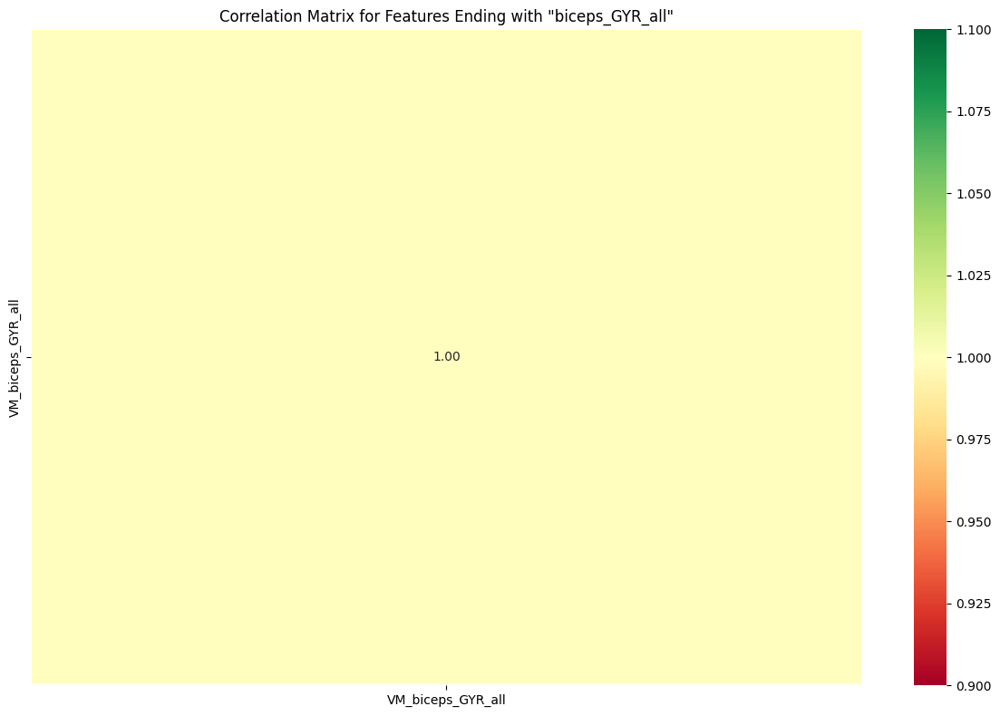

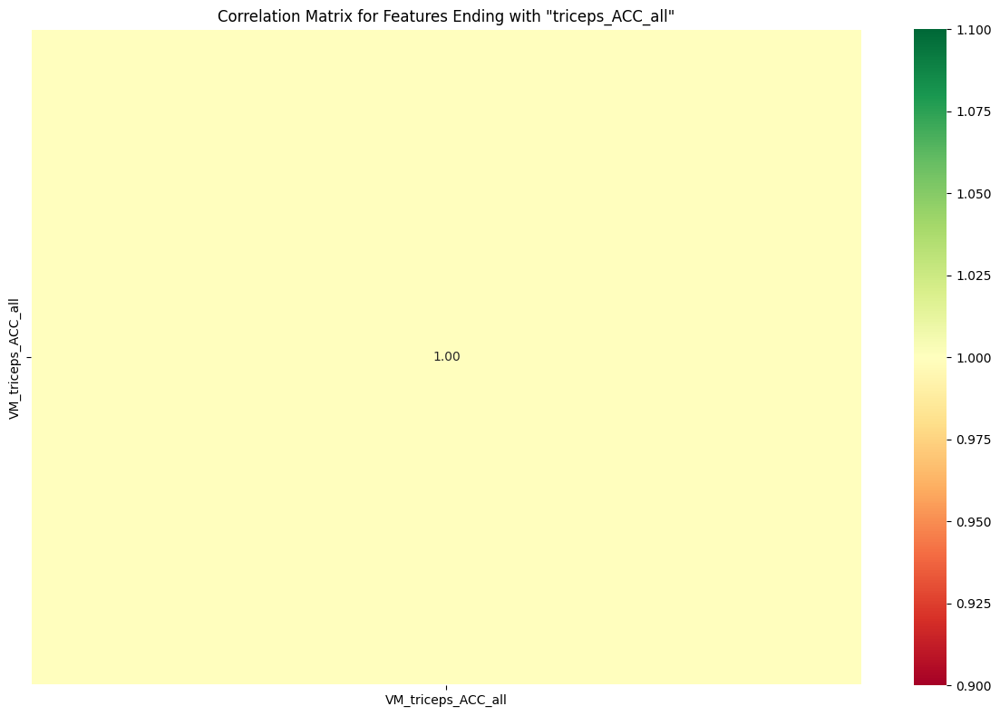

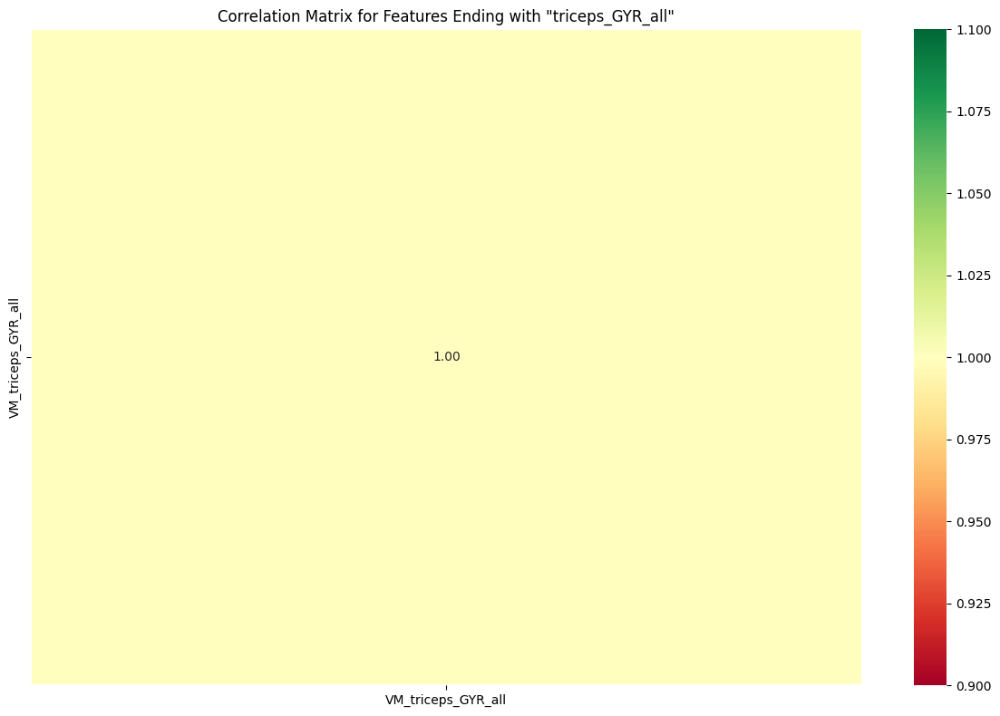

In [19]:
plot_feature_correlation(X_red, suffixes_imu) # Plot correlation matrices for groups of features (each muscle/channel)

In [20]:
# Drop redundant features within each muscle group, keeping only preferred ones
X_red = drop_highly_correlated_features(X_red, suffixes_imu, preferred_features, th)
print(f"Total remaining features: {len(X_red.columns)}")

Total remaining features: 233


In [21]:
report_remaining_high_correlations(X_red, suffixes_imu, th)

High correlation report:


## MYO Feature Wrapping Selection

EMG

In [22]:
X_emg_myo = X_red.loc[:, X_red.columns.str.endswith(tuple(suffixes_emg_myo))]
print(len(X_emg_myo.columns))

80


In [25]:
crossvalidation_var, data_dict = prepare_cv_data(X_emg_myo, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results_emg_myo, accuracy_fs_emg_myo = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

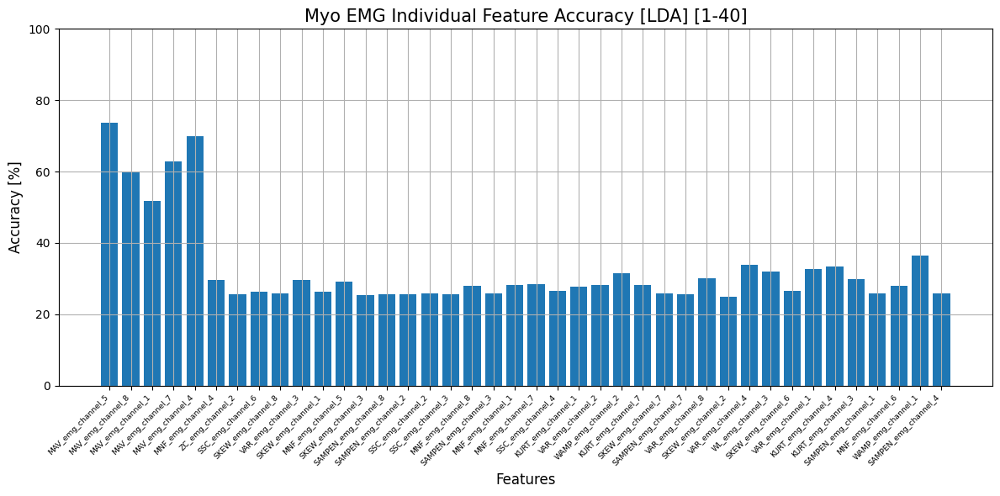

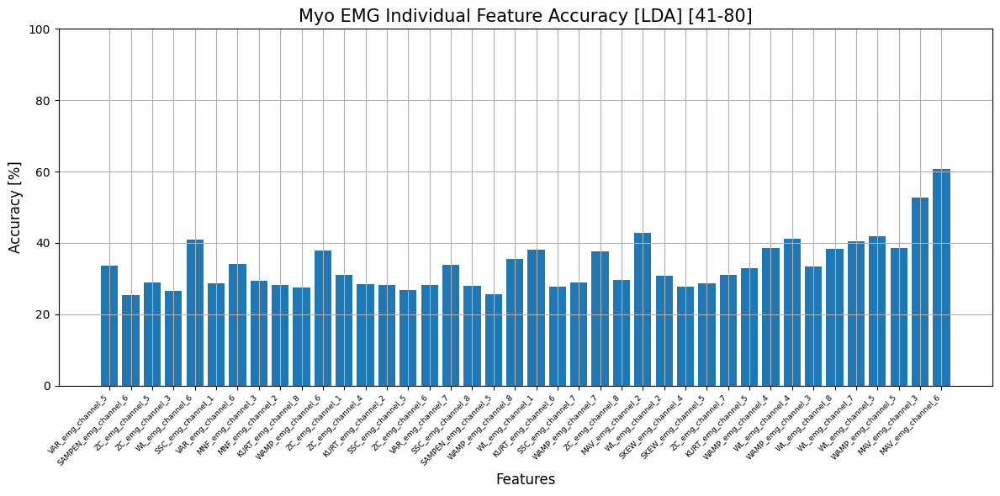

In [34]:

def plot_feature_accuracy(features, accuracies, batch_size=40):
    accuracies = np.array(accuracies)
    n_features = len(features)
    
    for i in range(0, n_features, batch_size):
        f_batch = features[i:i+batch_size]
        a_batch = accuracies[i:i+batch_size]
        
        n = len(f_batch)
        width = 10
        height = 20

        def scale_font(base, min_val=10, max_val=32):
            return int(np.clip(width * base, min_val, max_val))

        xlabel_size = scale_font(1.2)
        ylabel_size = scale_font(1.2)
        title_size  = scale_font(1.5)
        tick_size   = scale_font(1)

        plt.figure(figsize=(12, 6))
        plt.bar(f_batch, a_batch)

        plt.xlabel('Features', fontsize=xlabel_size)
        plt.ylabel('Accuracy [%]', fontsize=ylabel_size)
        plt.title(f'Myo EMG Individual Feature Accuracy [LDA] [{i+1}-{i+len(f_batch)}]', fontsize=title_size)

        plt.xticks(rotation=45, ha='right', fontsize=2*tick_size/3)
        plt.yticks(fontsize=tick_size)

        plt.ylim(0, 100)
        plt.grid(True)
        plt.tight_layout()
        #if i == 0: 
        #    plt.savefig("mio_plot_alta_risoluzione.png", dpi=300, bbox_inches='tight')
        plt.show()

plot_feature_accuracy(accuracy_fs_emg_myo, accuracy_results_emg_myo[0])

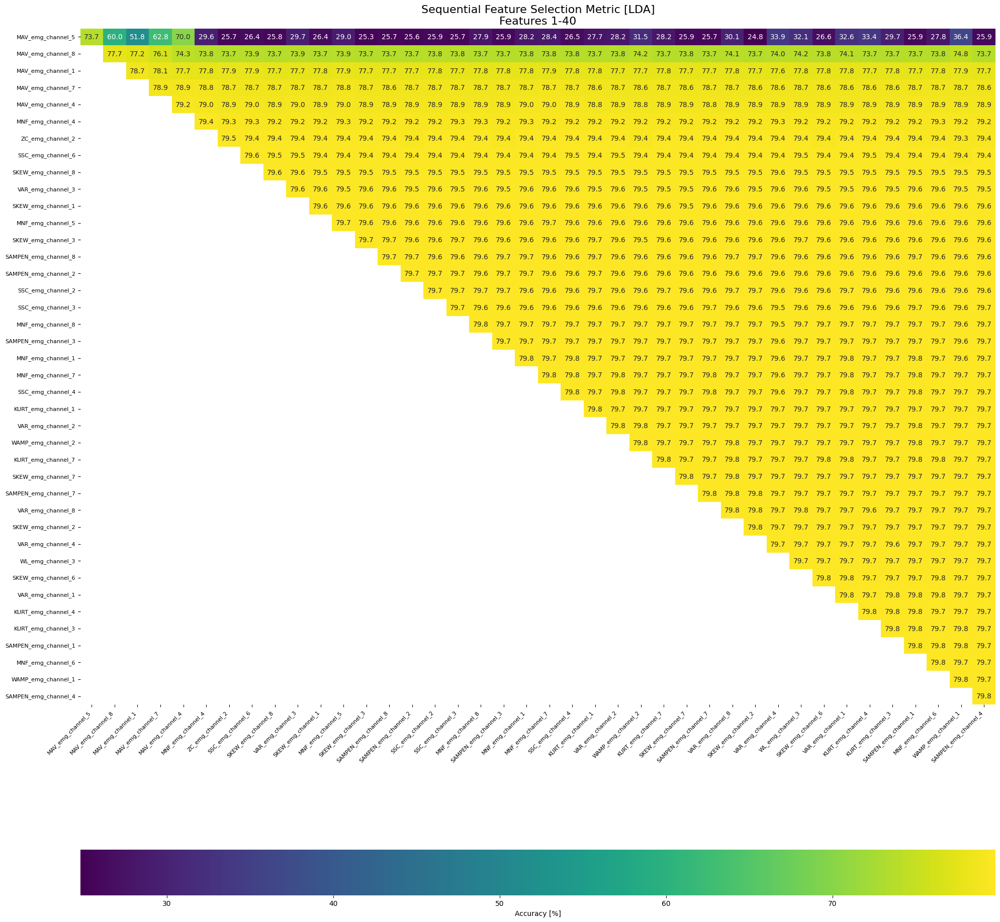

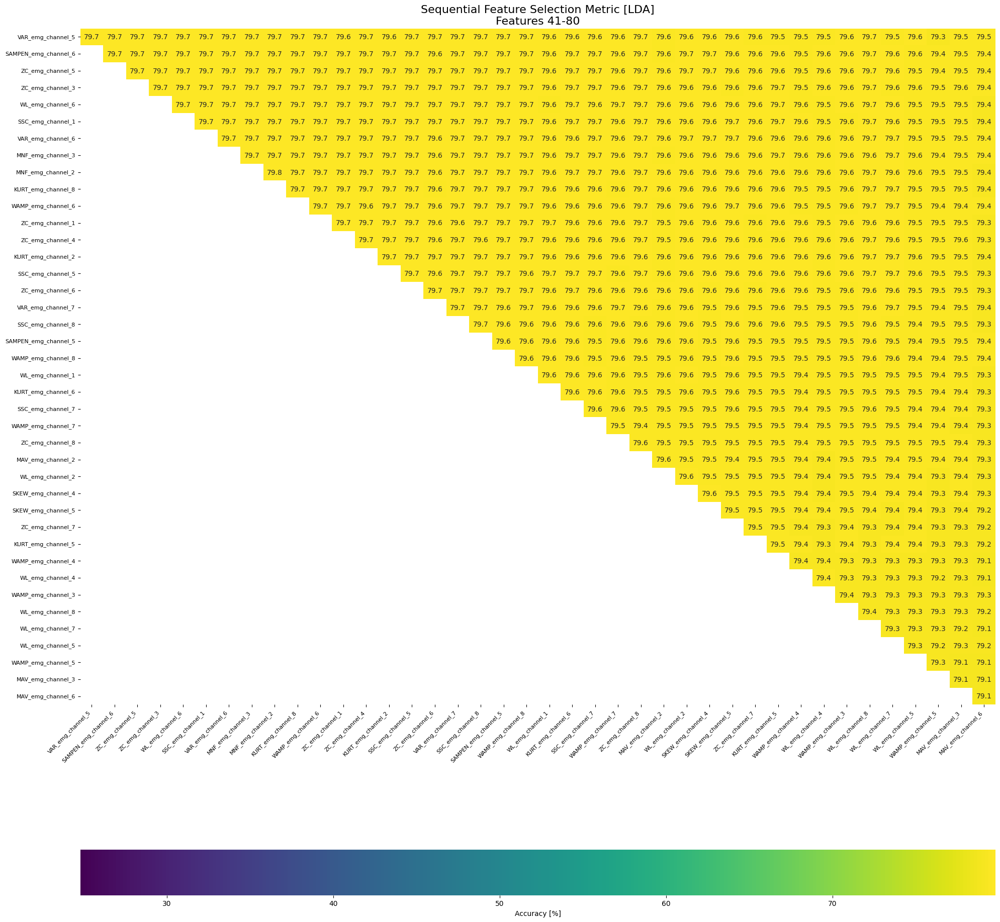

In [27]:
plot_sequential_selection_heatmap(accuracy_results_emg_myo, accuracy_fs_emg_myo)

In [32]:
def plot_feature_selection_performance(results, model_name='Model'):
    # Extract the number of features and corresponding accuracy values
    k_vals = np.array([k for k, acc in results])
    acc_vals = np.array([acc for k, acc in results])

    width = 10
    height = 20

    def scale_font(base, min_val=10, max_val=32):
        return int(np.clip(width * base, min_val, max_val))

    # Create the plot
    plt.figure(figsize=(12, 6))
    # Plot full line without markers
    line, = plt.plot(k_vals, acc_vals, linestyle='-', label='Accuracy')
    color = line.get_color()    

    step = 5
    indices = np.where(k_vals % step == 0)[0]
    xlabel_size = scale_font(1.2)
    ylabel_size = scale_font(1.2)
    title_size  = scale_font(1.5)

    extra_indices = [0, len(k_vals) - 1]
    all_indices = np.unique(np.concatenate([indices, extra_indices]))
    
    # Seleziona i punti corrispondenti
    marker_k = k_vals[all_indices]
    marker_acc = acc_vals[all_indices]
    
    # Plotta i marker con stesso colore
    plt.plot(marker_k, marker_acc, linestyle='None', marker='o', color=color, label='_nolegend_')
    
    plt.title(f"Myo EMG Accuracy vs Number of Features [{model_name}]", fontsize=title_size)
    plt.xlabel("Number of Features", fontsize=xlabel_size)
    plt.ylabel("Accuracy [%]", fontsize=ylabel_size)
    plt.grid(True)
    plt.xticks(np.arange(0,  max(k_vals) + 1, 5))
    plt.legend()
    plt.tight_layout()
    #plt.savefig("mio_plot_risoluzione.png", dpi=300, bbox_inches='tight')
    plt.show()

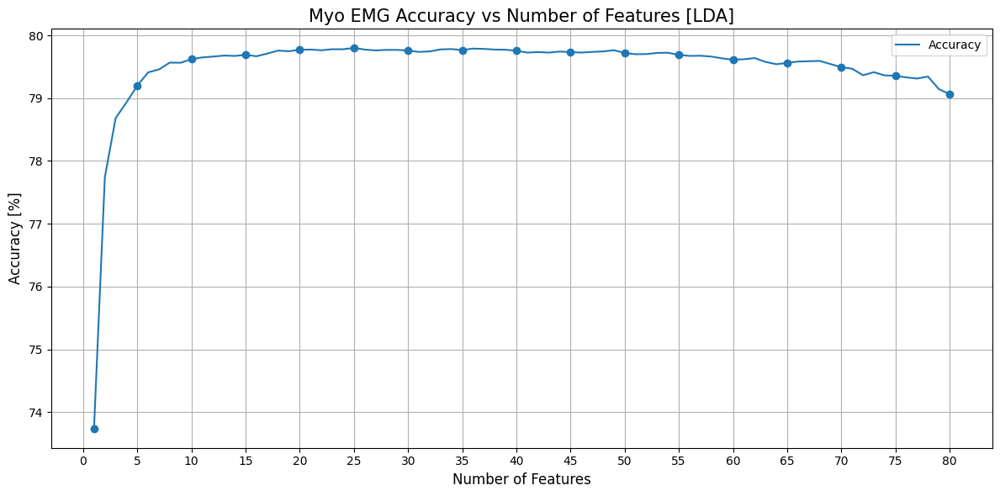

In [33]:
res = list(zip(range(1, len(np.diag(accuracy_results_emg_myo)) + 1), np.diag(accuracy_results_emg_myo)))
plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

IMU

In [23]:
X_imu_myo = X_red.loc[:, X_red.columns.str.endswith(tuple(suffixes_imu_myo))]
print(len(X_imu_myo.columns))

44


In [35]:
crossvalidation_var, data_dict = prepare_cv_data(X_imu_myo, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results_imu_myo, accuracy_fs_imu_myo = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

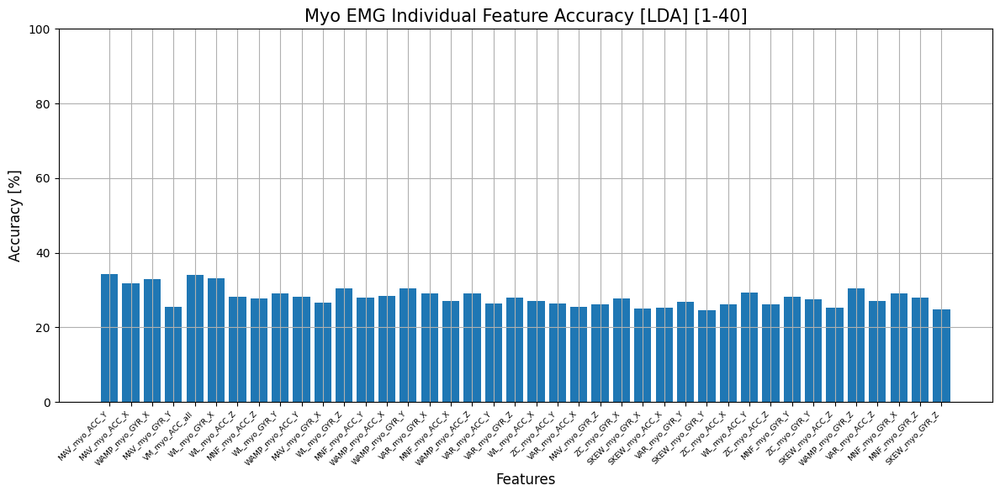

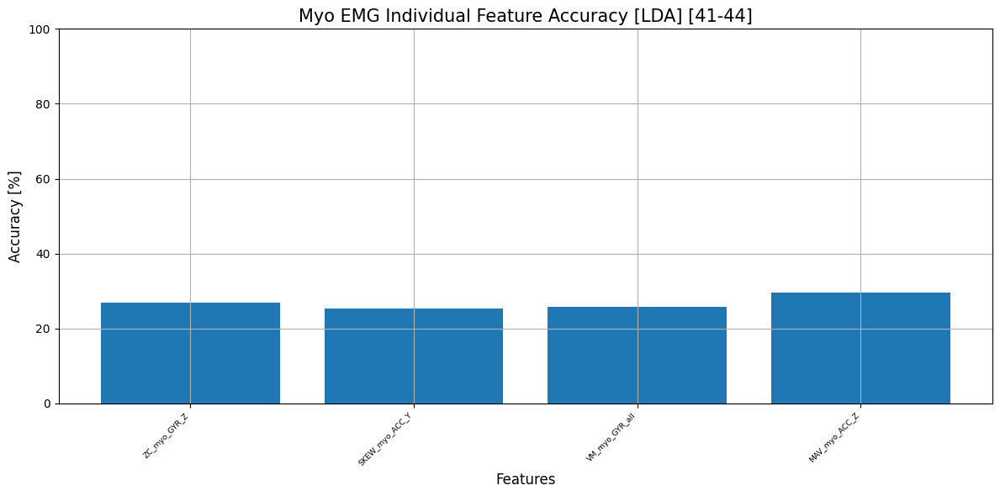

In [36]:
plot_feature_accuracy(accuracy_fs_imu_myo, accuracy_results_imu_myo[0])

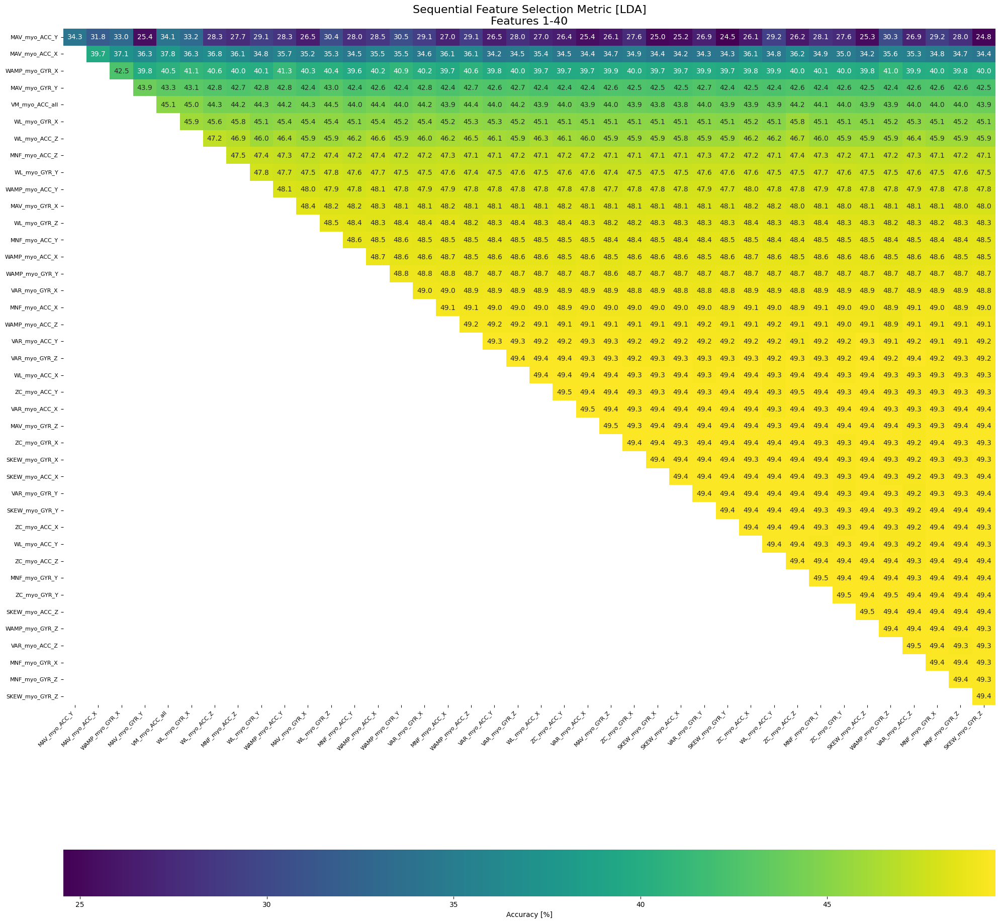

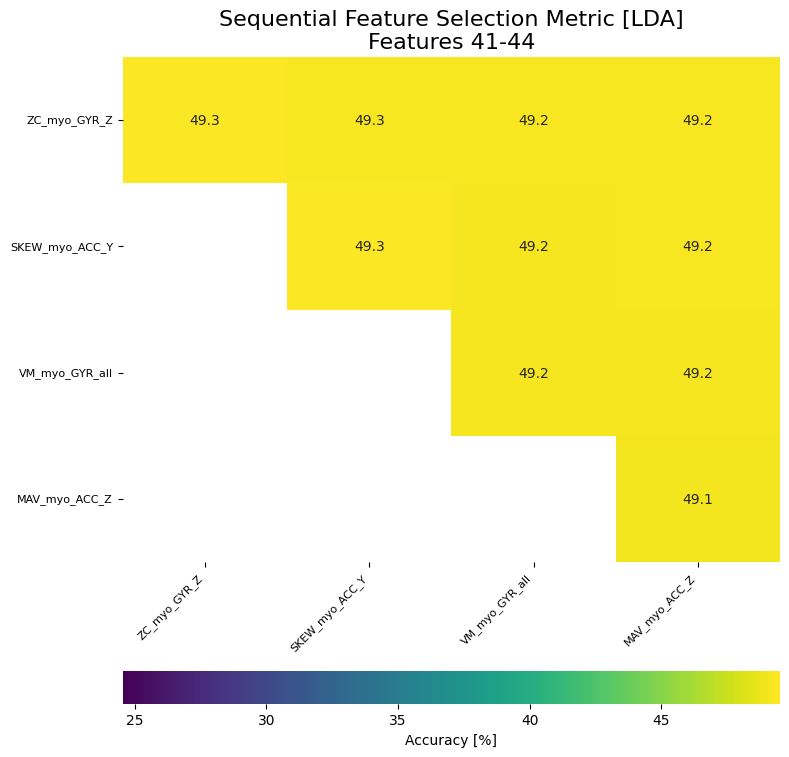

In [37]:
plot_sequential_selection_heatmap(accuracy_results_imu_myo, accuracy_fs_imu_myo)

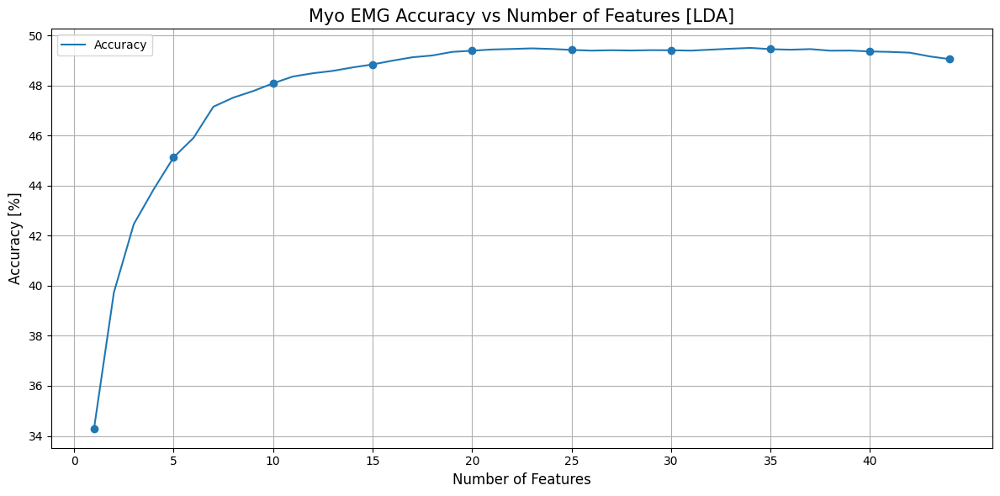

In [38]:
res = list(zip(range(1, len(np.diag(accuracy_results_imu_myo)) + 1), np.diag(accuracy_results_imu_myo)))
plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

EMG + IMU

In [39]:
X_myo = X_red.loc[:, X_red.columns.str.endswith(tuple(suffixes_myo))]
print(len(X_myo.columns))

124


In [40]:
crossvalidation_var, data_dict = prepare_cv_data(X_myo, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results_myo, accuracy_fs_myo = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

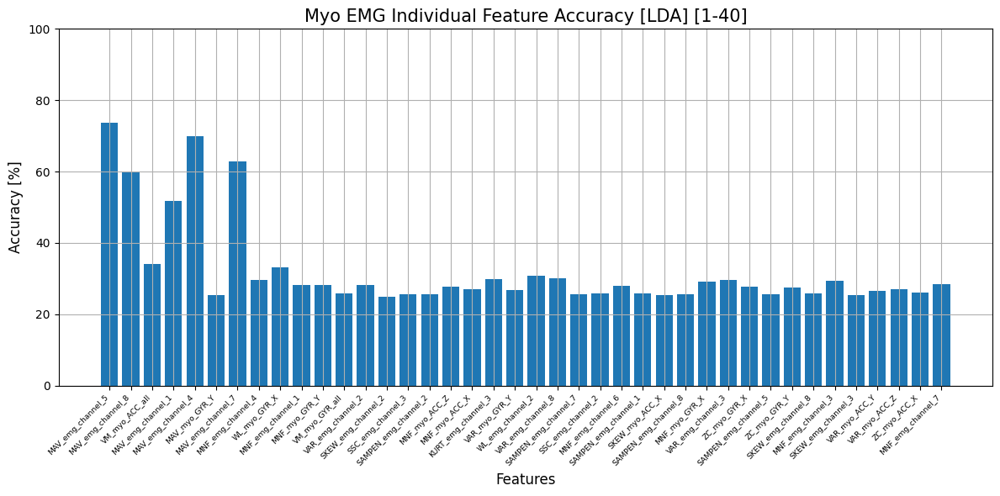

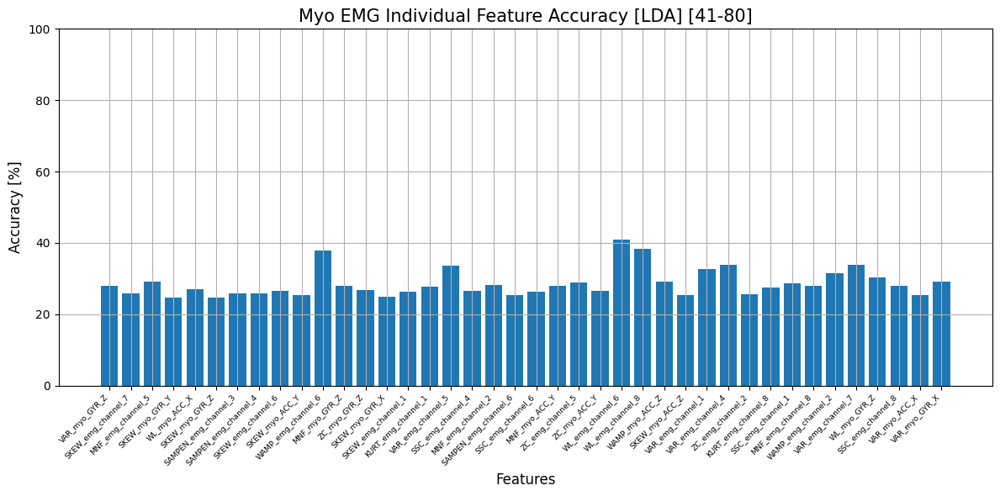

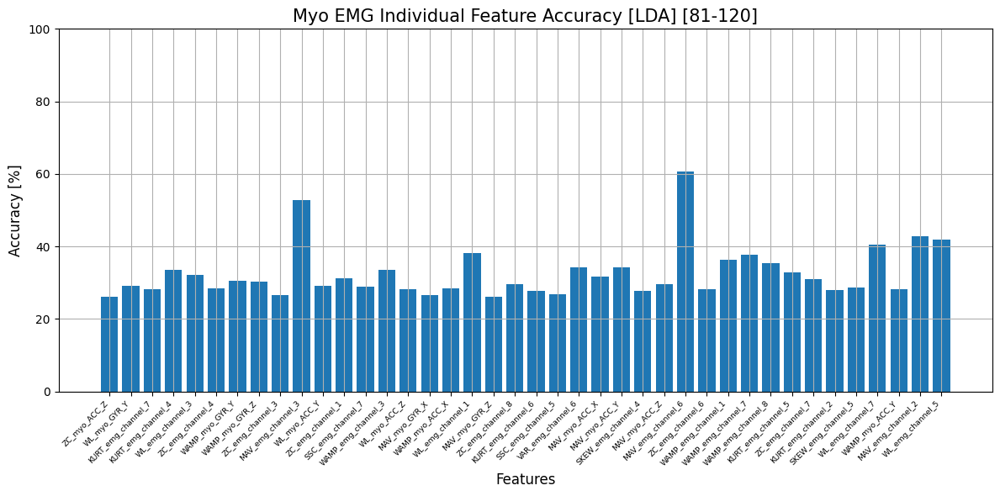

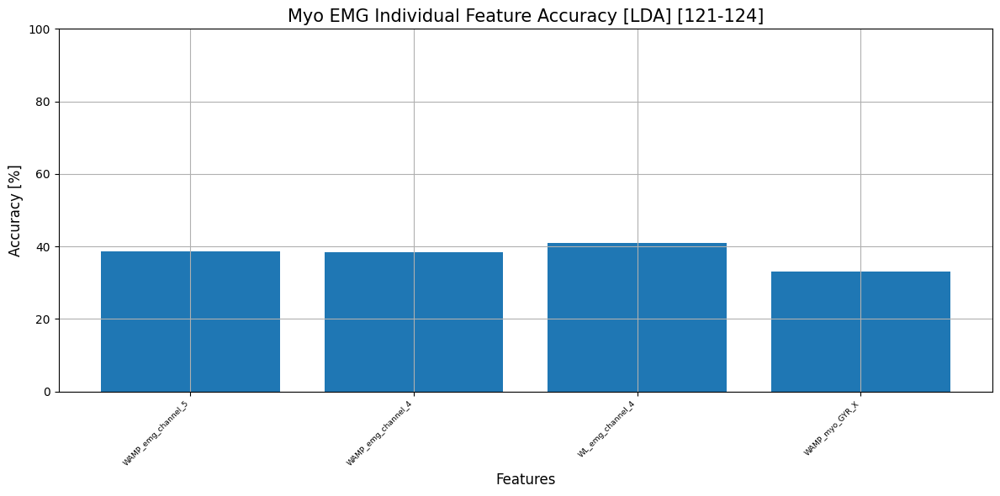

In [41]:
"""
def plot_feature_accuracy(features, accuracies, batch_size=40):
    accuracies = np.array(accuracies)
    n_features = len(features)
    
    for i in range(0, n_features, batch_size):
        f_batch = features[i:i+batch_size]
        a_batch = accuracies[i:i+batch_size]
        
        n = len(f_batch)
        width = 10
        height = 20

        def scale_font(base, min_val=10, max_val=32):
            return int(np.clip(width * base, min_val, max_val))

        xlabel_size = scale_font(1.2)
        ylabel_size = scale_font(1.2)
        title_size  = scale_font(1.5)
        tick_size   = scale_font(1)

        plt.figure(figsize=(12, 6))
        plt.bar(f_batch, a_batch)

        plt.xlabel('Features', fontsize=xlabel_size)
        plt.ylabel('Accuracy [%]', fontsize=ylabel_size)
        plt.title(f'Myo EMG+IMU Individual Feature Accuracy [LDA] [{i+1}-{i+len(f_batch)}]', fontsize=title_size)

        plt.xticks(rotation=45, ha='right', fontsize=2*tick_size/3)
        plt.yticks(fontsize=tick_size)

        plt.ylim(0, 100)
        plt.grid(True)
        plt.tight_layout()
        #if i == 0: 
        #    plt.savefig("mio_plot_alta_risoluzione.png", dpi=300, bbox_inches='tight')
        plt.show()
"""

plot_feature_accuracy(accuracy_fs_myo, accuracy_results_myo[0])

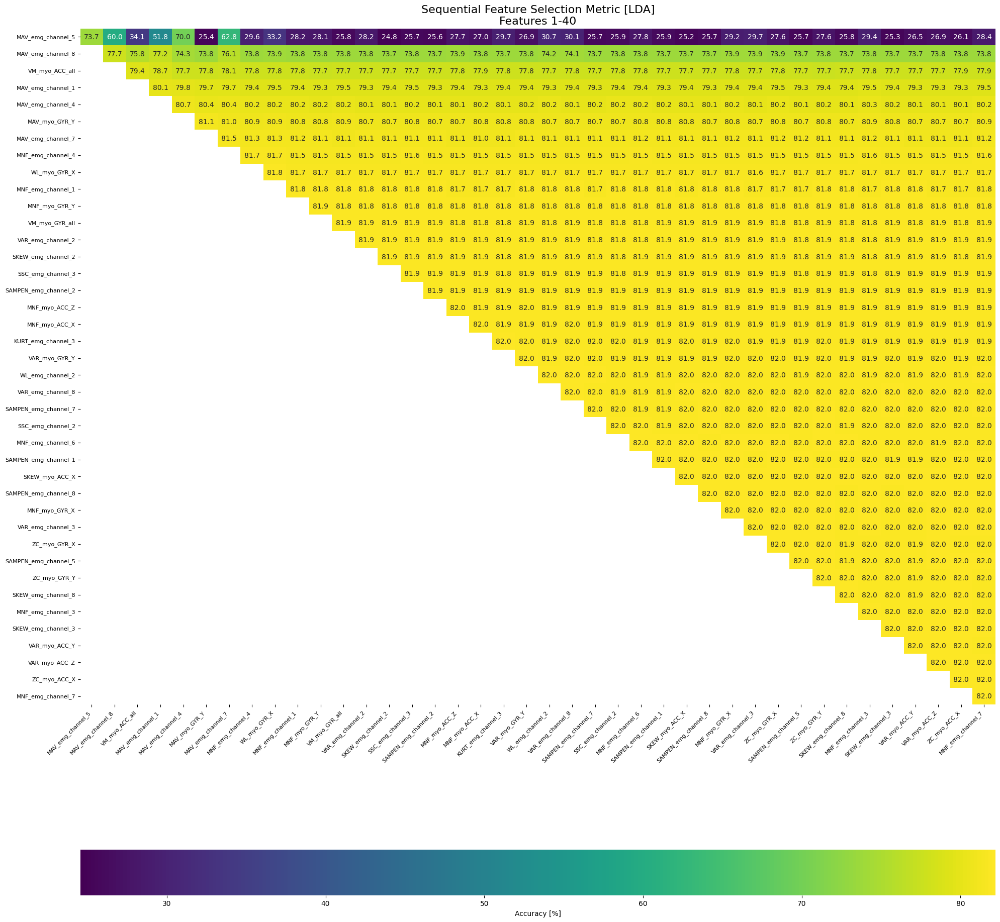

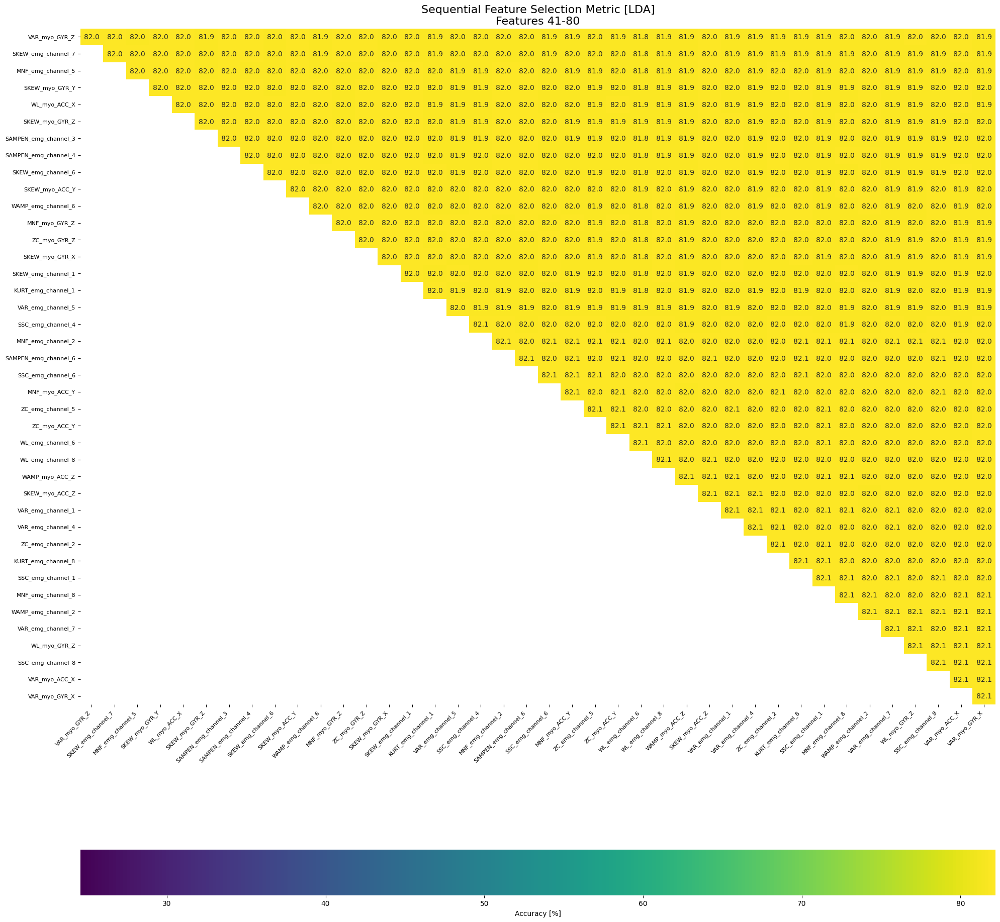

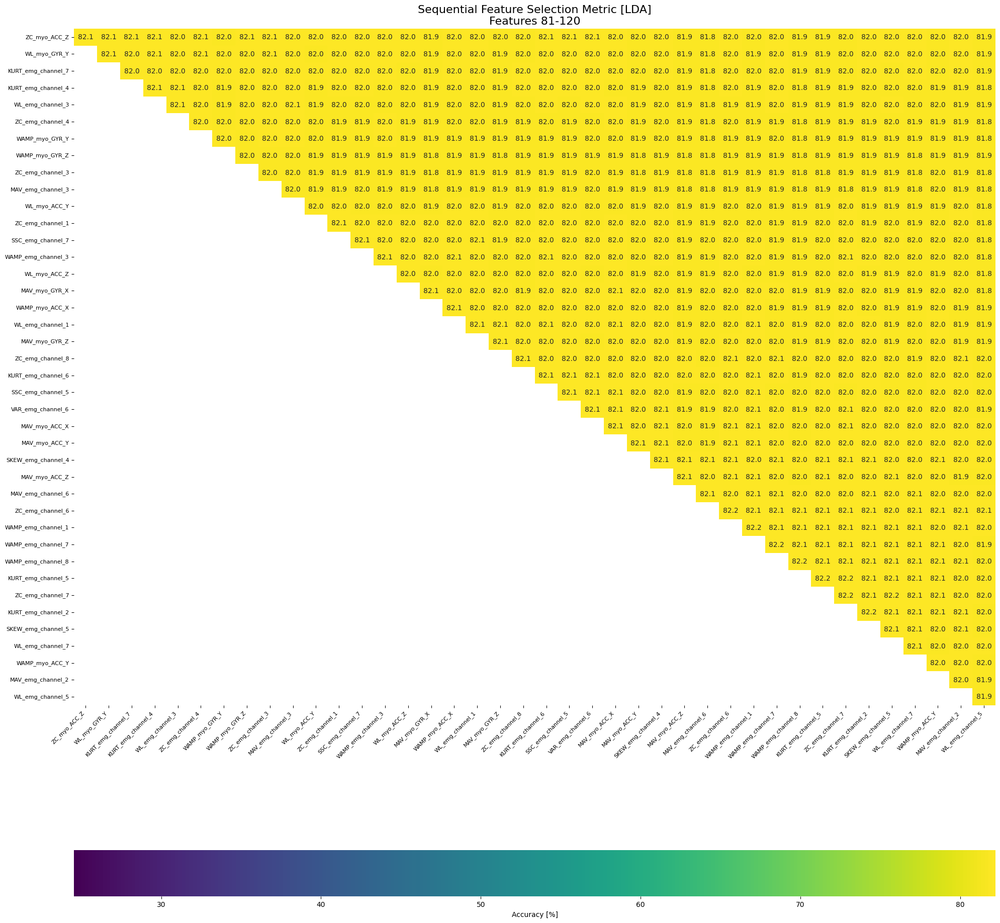

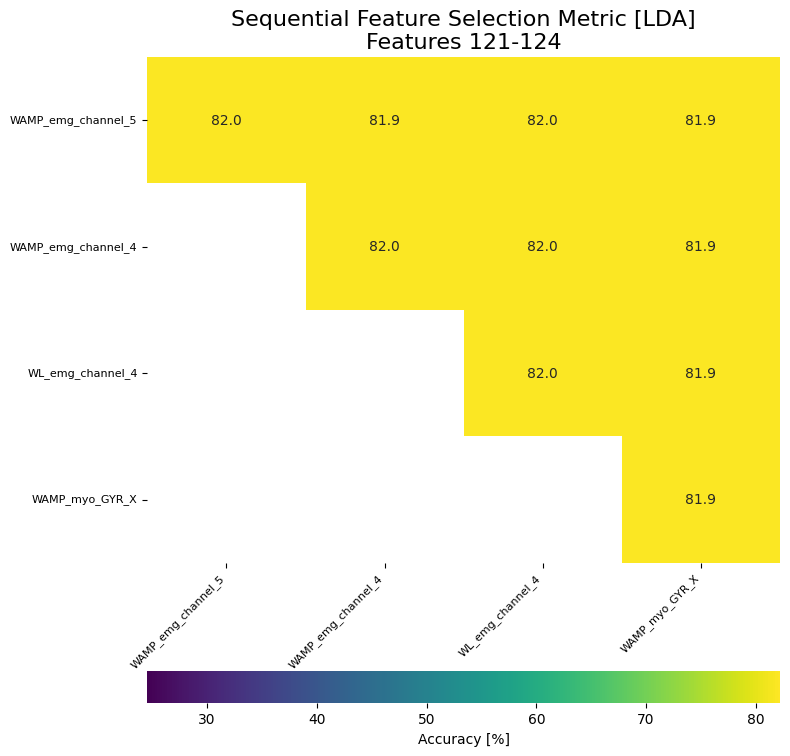

In [42]:
plot_sequential_selection_heatmap(accuracy_results_myo, accuracy_fs_myo)

In [43]:
res = list(zip(range(1, len(np.diag(accuracy_results_myo)) + 1), np.diag(accuracy_results_myo)))

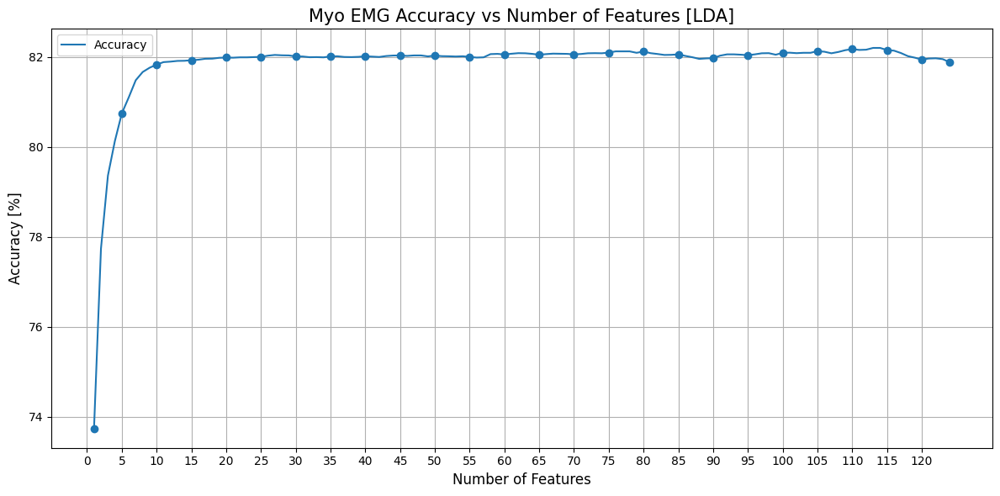

In [44]:
"""
def plot_feature_selection_performance(results, model_name='Model'):
    # Extract the number of features and corresponding accuracy values
    k_vals = np.array([k for k, acc in results])
    acc_vals = np.array([acc for k, acc in results])

    width = 10
    height = 20

    def scale_font(base, min_val=10, max_val=32):
        return int(np.clip(width * base, min_val, max_val))

    # Create the plot
    plt.figure(figsize=(12, 6))
    # Plot full line without markers
    line, = plt.plot(k_vals, acc_vals, linestyle='-', label='Accuracy')
    color = line.get_color()    

    step = 5
    indices = np.where(k_vals % step == 0)[0]
    xlabel_size = scale_font(1.2)
    ylabel_size = scale_font(1.2)
    title_size  = scale_font(1.5)

    extra_indices = [0, len(k_vals) - 1]
    all_indices = np.unique(np.concatenate([indices, extra_indices]))
    
    # Seleziona i punti corrispondenti
    marker_k = k_vals[all_indices]
    marker_acc = acc_vals[all_indices]
    
    # Plotta i marker con stesso colore
    plt.plot(marker_k, marker_acc, linestyle='None', marker='o', color=color, label='_nolegend_')
    
    plt.title(f"Myo EMG+IMU Accuracy vs Number of Features [{model_name}]", fontsize=title_size)
    plt.xlabel("Number of Features", fontsize=xlabel_size)
    plt.ylabel("Accuracy [%]", fontsize=ylabel_size)
    plt.grid(True)
    plt.xticks(np.arange(0,  max(k_vals) + 1, 5))
    plt.legend()
    plt.tight_layout()
    #plt.savefig("mio_plot_risoluzione.png", dpi=300, bbox_inches='tight')
    plt.show()
"""

plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

## TRIGNO Feature Wrapping Selection

EMG

In [37]:
X_emg_trigno = X_red.loc[:, X_red.columns.str.endswith(tuple(suffixes_emg_trigno))]
print(len(X_emg_trigno.columns))

20


In [38]:
crossvalidation_var, data_dict = prepare_cv_data(X_emg_trigno, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results_emg_trigno, accuracy_fs_emg_trigno = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

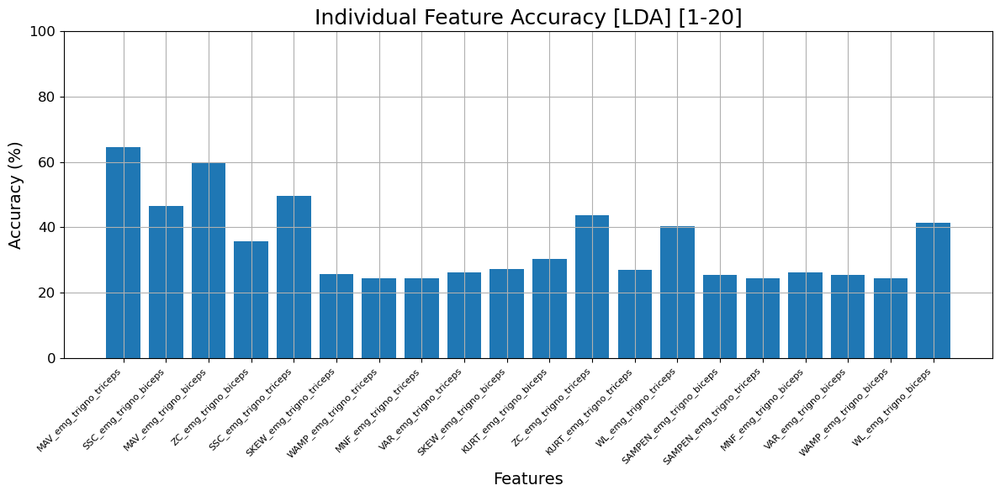

In [39]:
plot_feature_accuracy(accuracy_fs_emg_trigno, accuracy_results_emg_trigno[0])

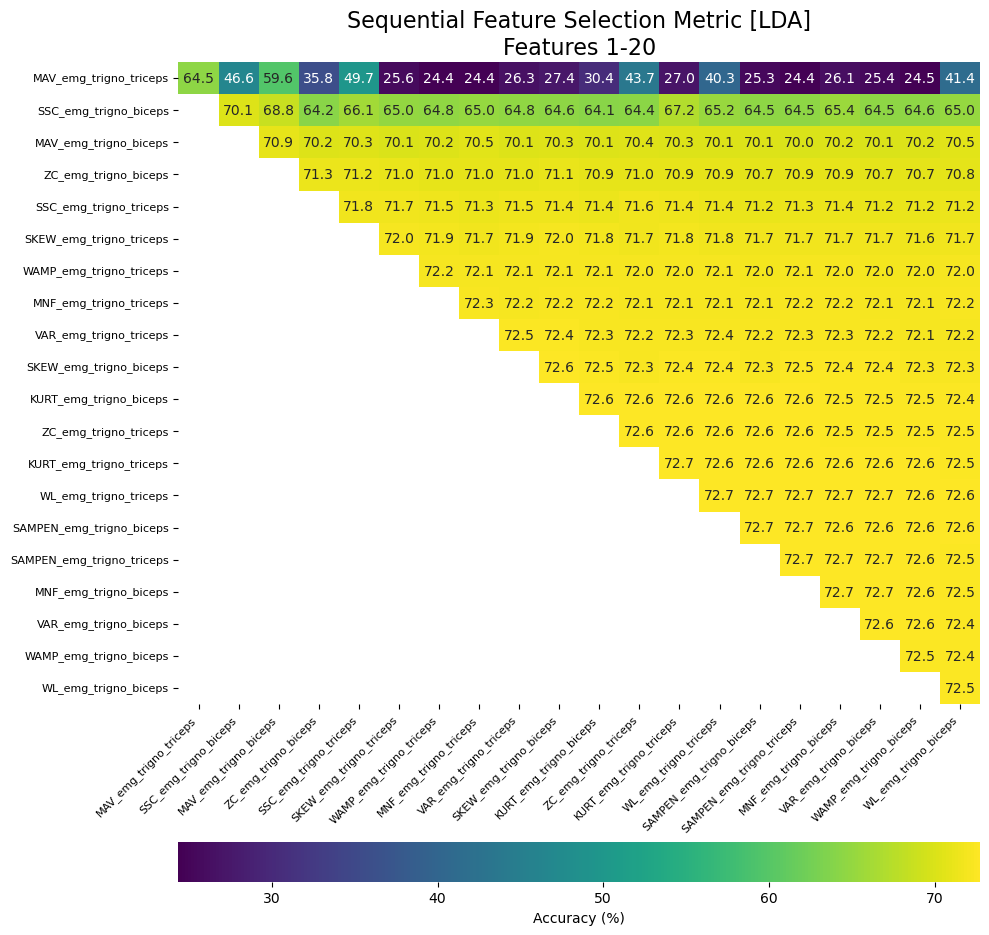

In [40]:
plot_sequential_selection_heatmap(accuracy_results_emg_trigno, accuracy_fs_emg_trigno)

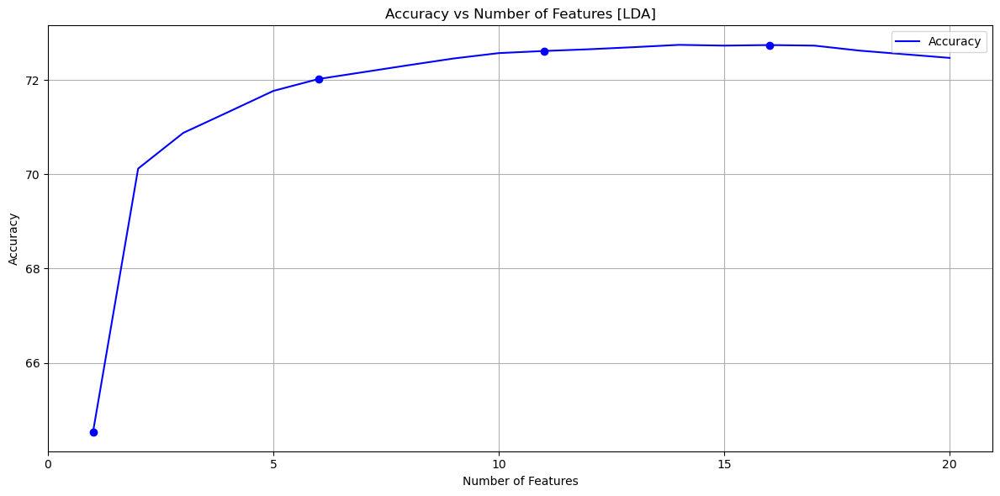

In [41]:
res = list(zip(range(1, len(np.diag(accuracy_results_emg_trigno)) + 1), np.diag(accuracy_results_emg_trigno)))
plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

IMU

In [42]:
X_imu_trigno = X_red.loc[:, X_red.columns.str.endswith(tuple(suffixes_imu_trigno))]
print(len(X_imu_trigno.columns))

77


In [43]:
crossvalidation_var, data_dict = prepare_cv_data(X_imu_trigno, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results_imu_trigno, accuracy_fs_imu_trigno = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

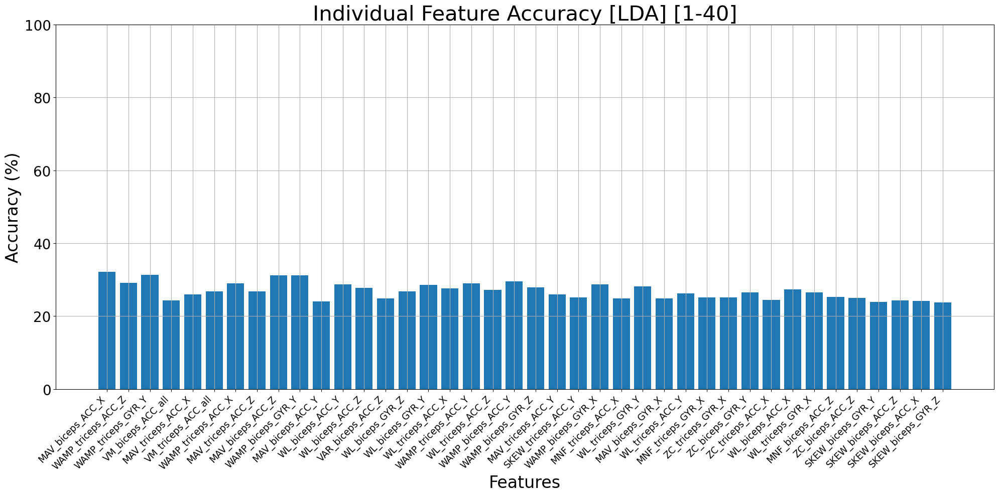

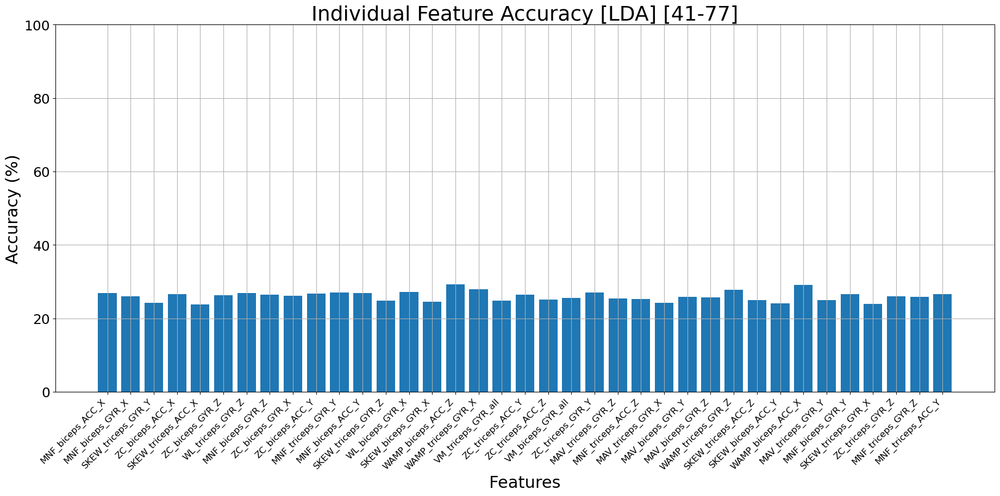

In [44]:
plot_feature_accuracy(accuracy_fs_imu_trigno, accuracy_results_imu_trigno[0])

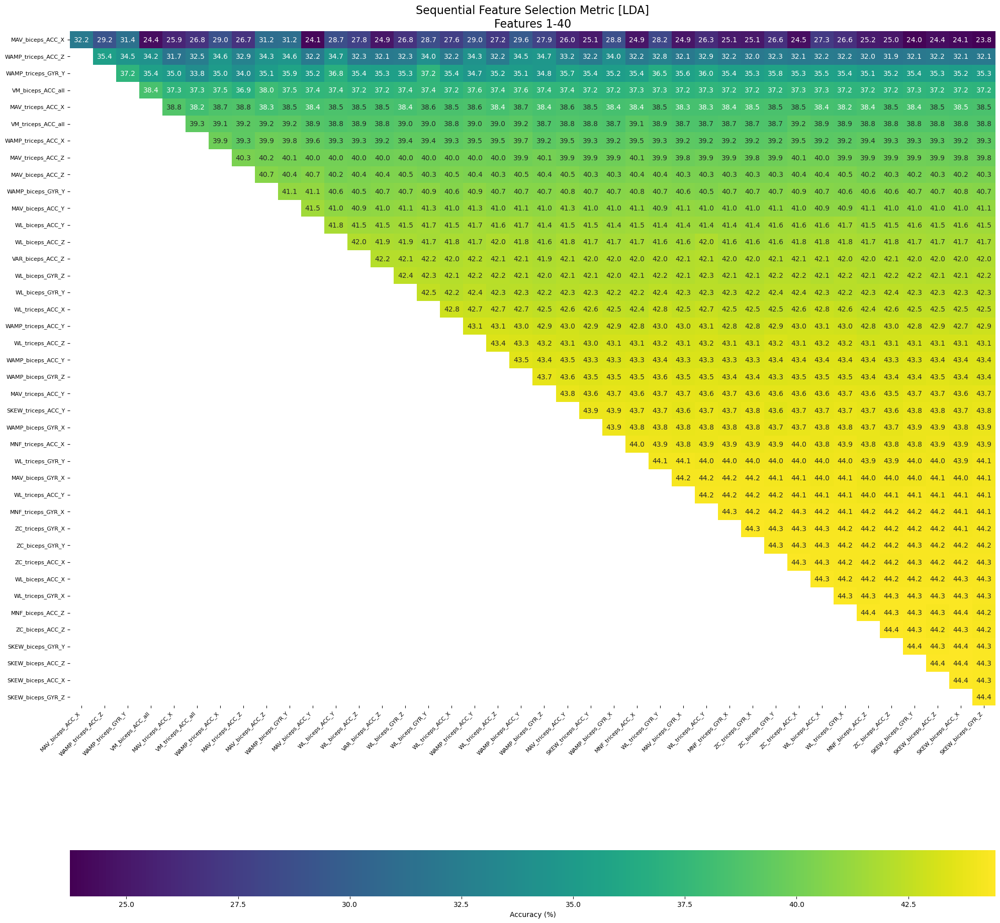

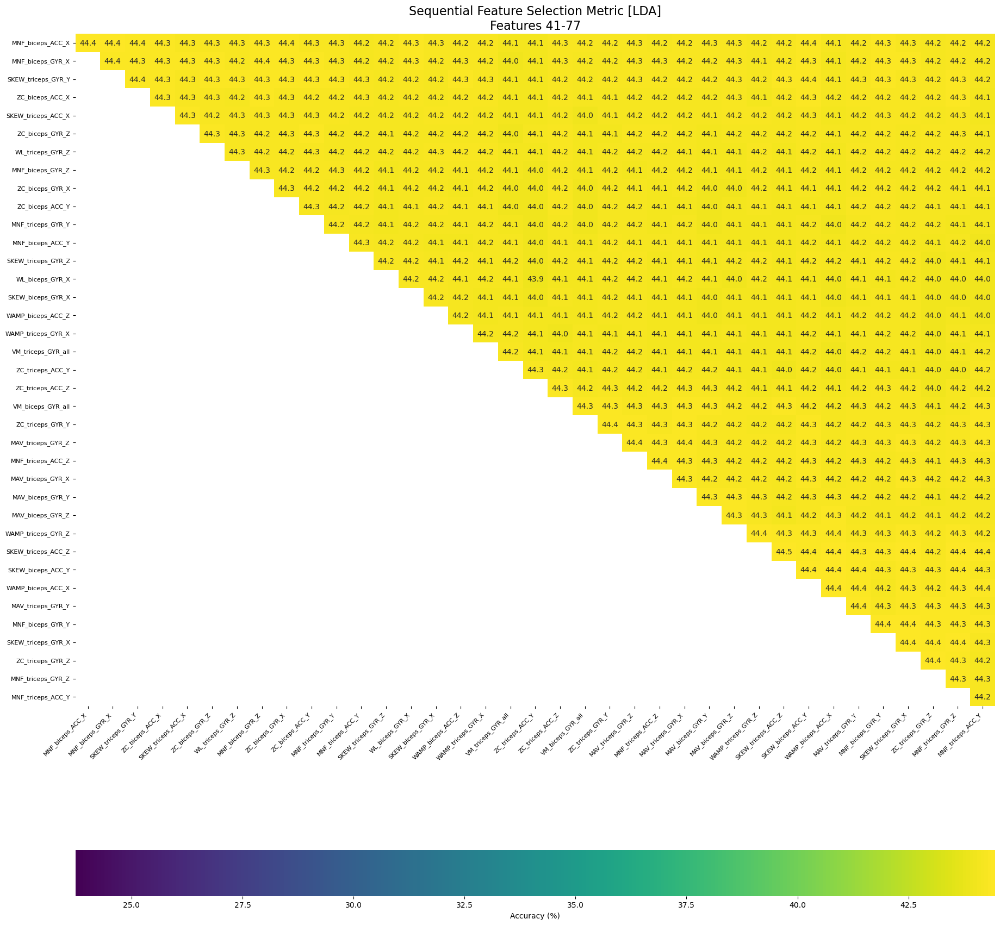

In [45]:
plot_sequential_selection_heatmap(accuracy_results_imu_trigno, accuracy_fs_imu_trigno)

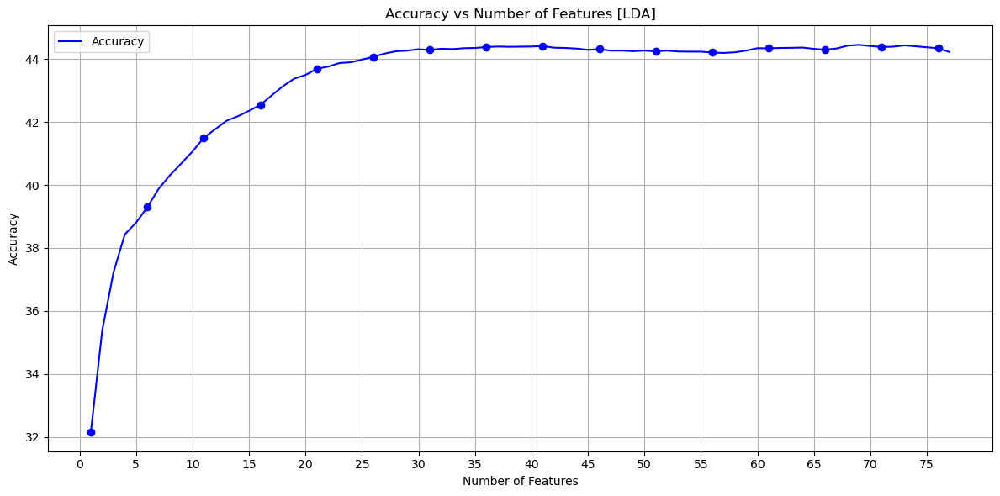

In [46]:
res = list(zip(range(1, len(np.diag(accuracy_results_imu_trigno)) + 1), np.diag(accuracy_results_imu_trigno)))
plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

EMG + IMU

In [47]:
X_trigno = X_red.loc[:, X_red.columns.str.endswith(tuple(suffixes_trigno))]
print(len(X_trigno.columns))

97


In [48]:
crossvalidation_var, data_dict = prepare_cv_data(X_trigno, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results_trigno, accuracy_fs_trigno = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

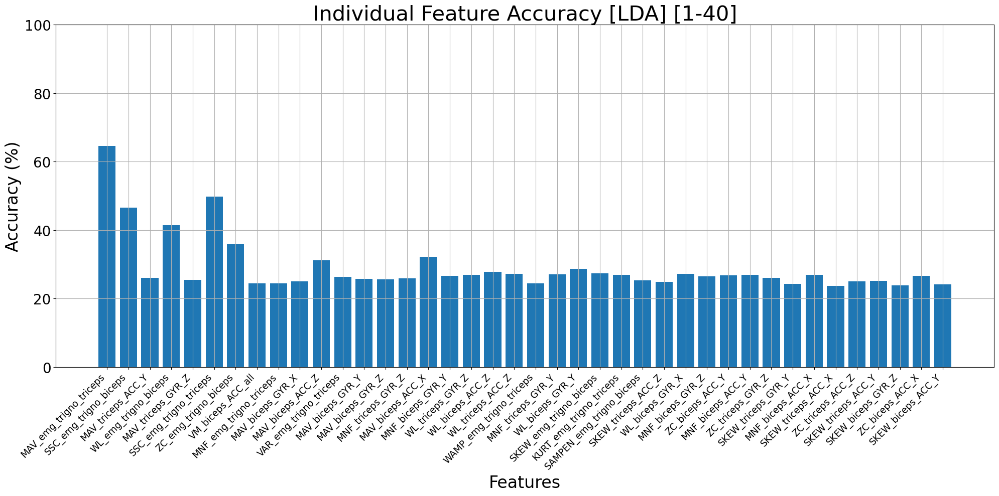

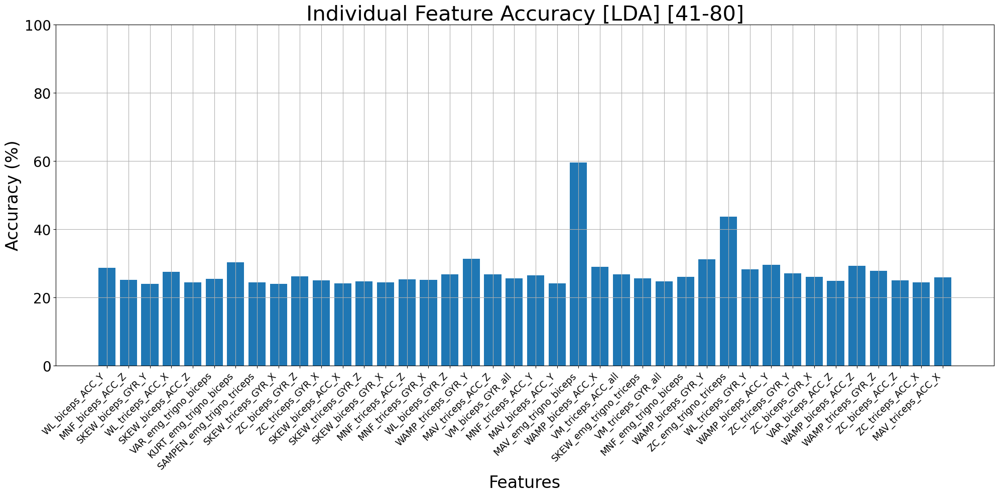

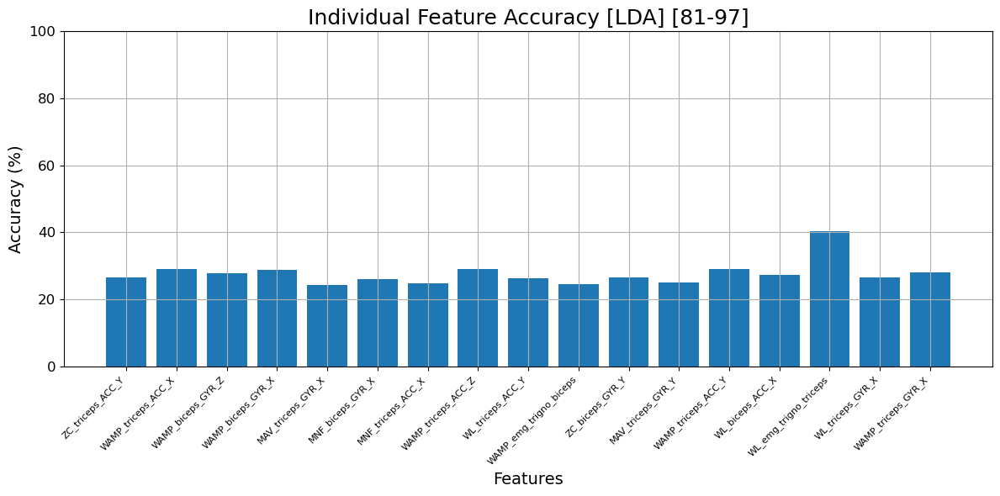

In [49]:
plot_feature_accuracy(accuracy_fs_trigno, accuracy_results_trigno[0])

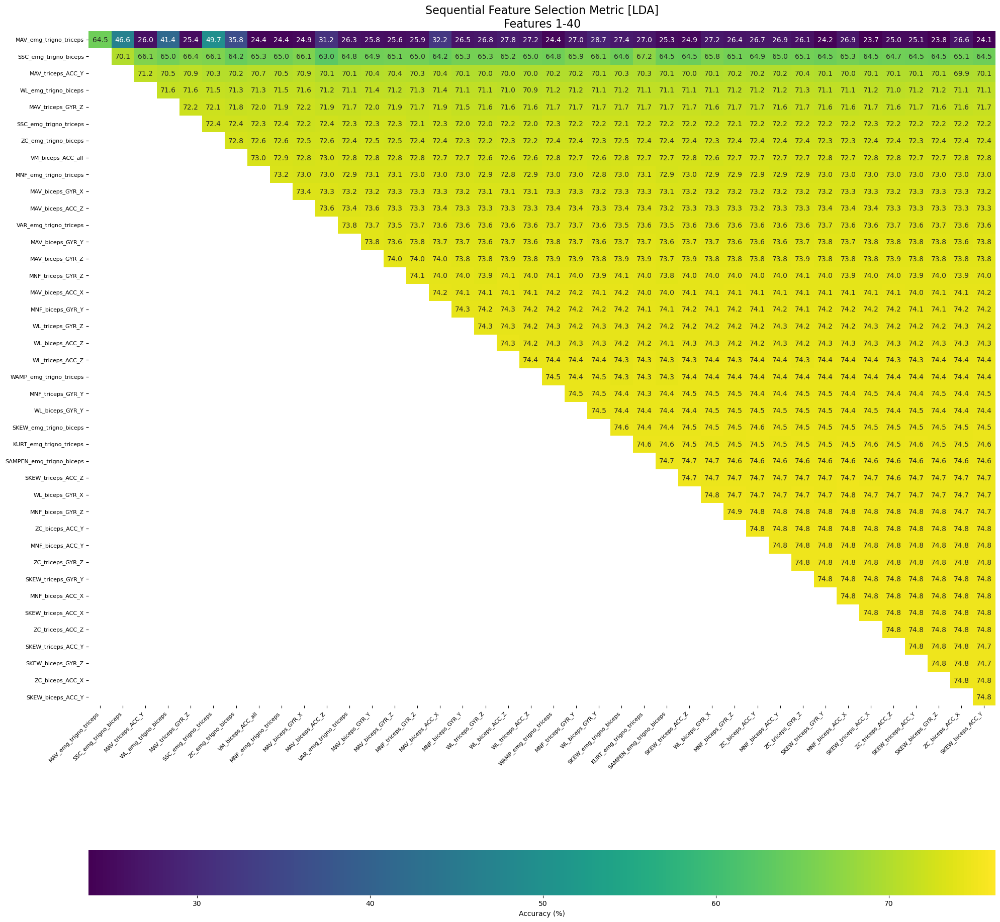

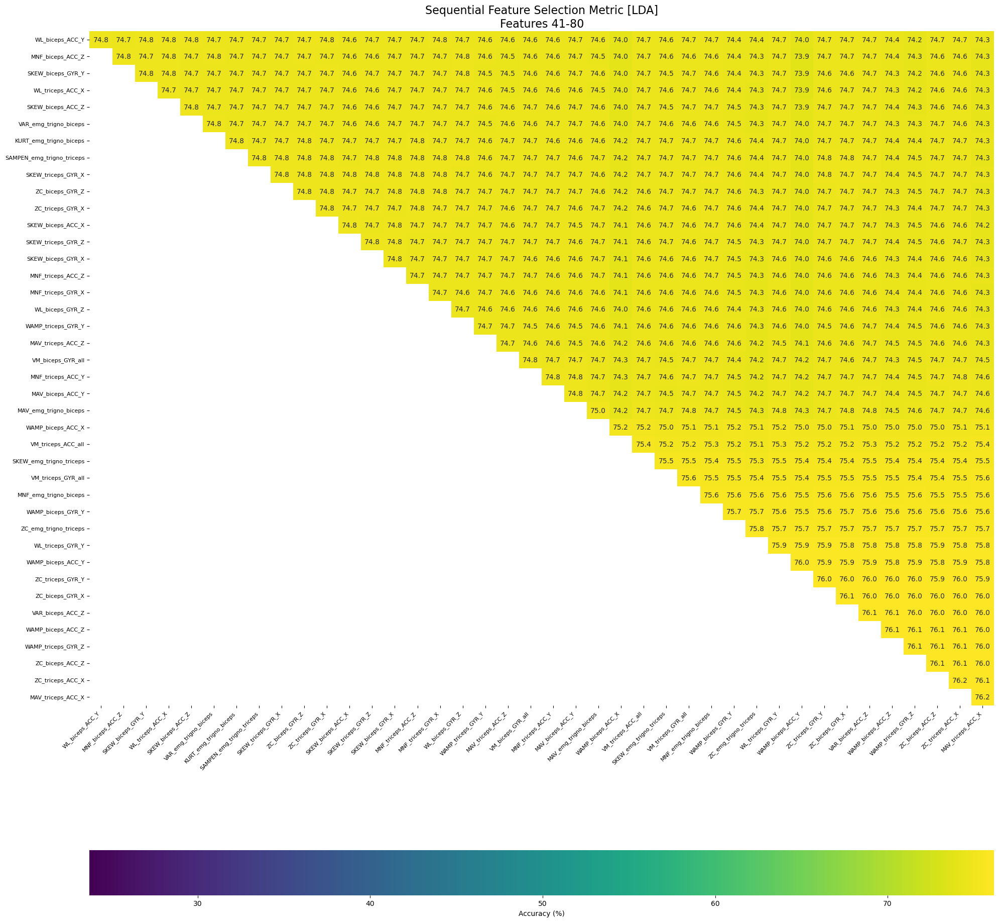

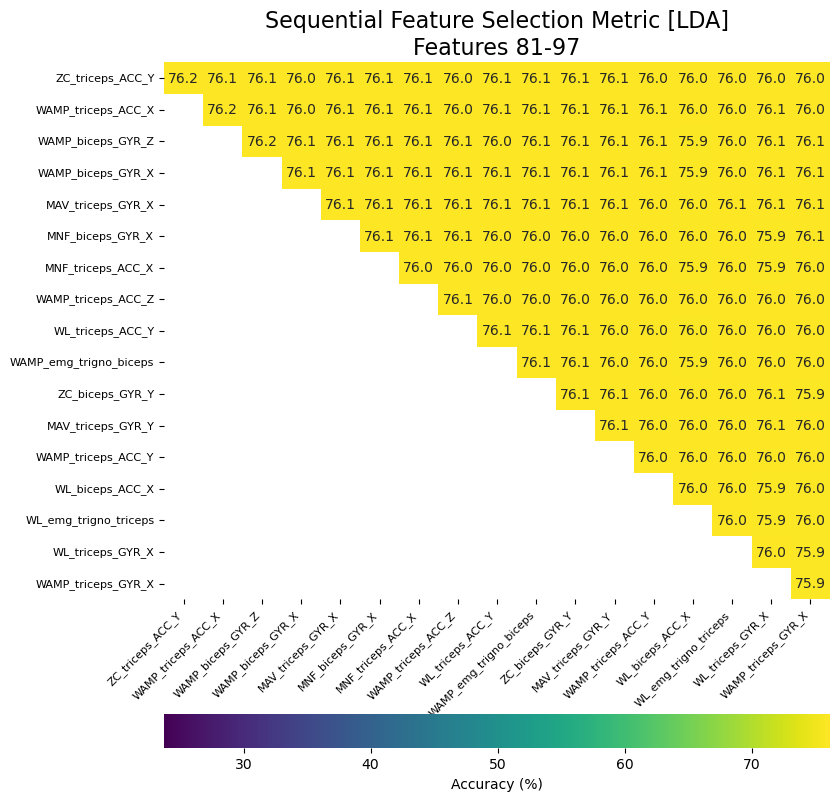

In [50]:
plot_sequential_selection_heatmap(accuracy_results_trigno, accuracy_fs_trigno)

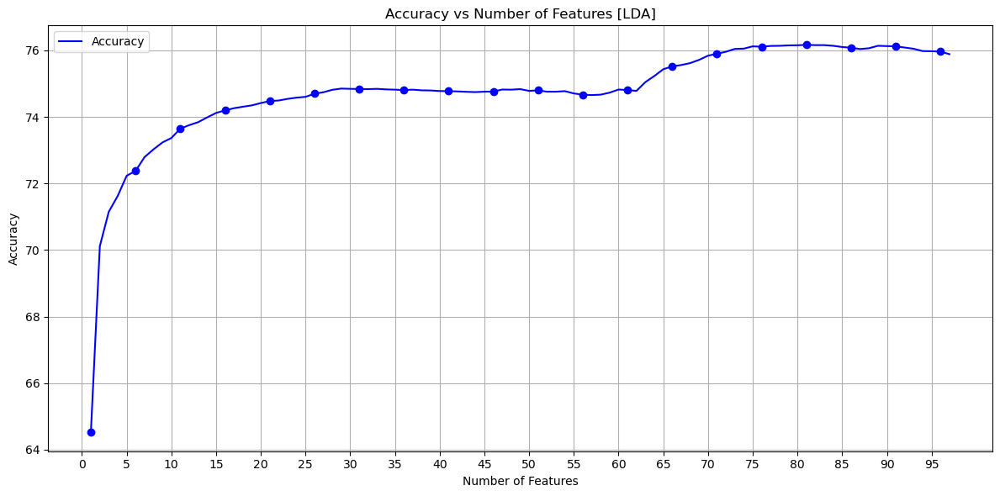

In [51]:
res = list(zip(range(1, len(np.diag(accuracy_results_trigno)) + 1), np.diag(accuracy_results_trigno)))
plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

## MYO + TRIGNO Feature Wrapping Selection

EMG

In [52]:
X_emg = X_red.loc[:, X_red.columns.str.endswith(tuple(suffixes_emg))]
print(len(X_emg.columns))

92


In [53]:
crossvalidation_var, data_dict = prepare_cv_data(X_emg, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results_emg, accuracy_fs_emg = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

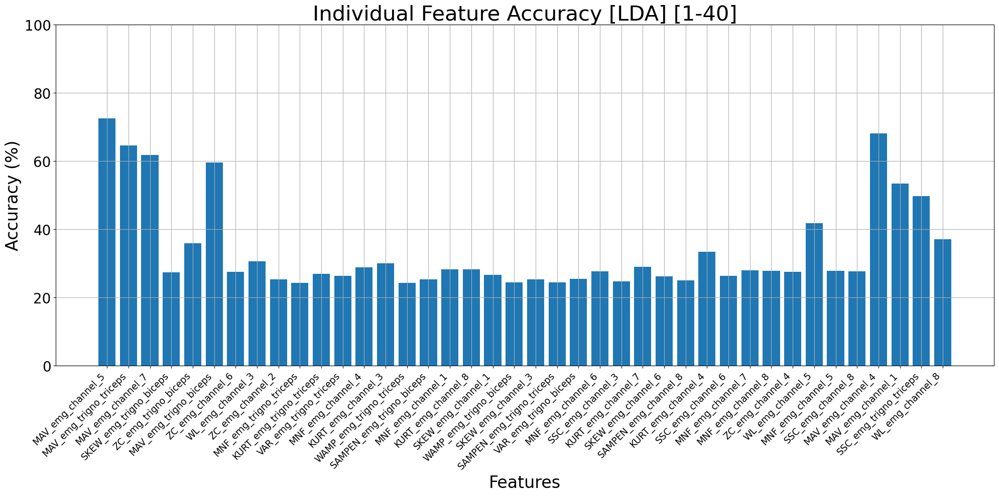

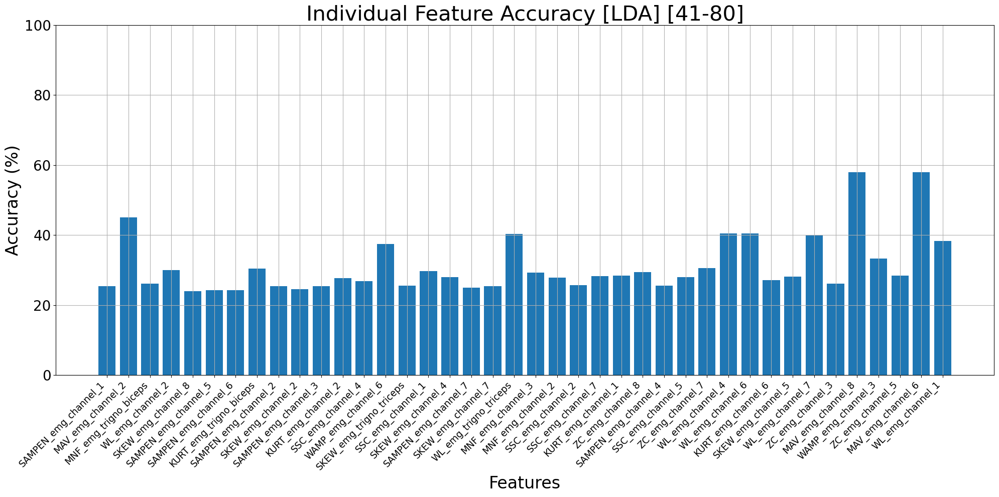

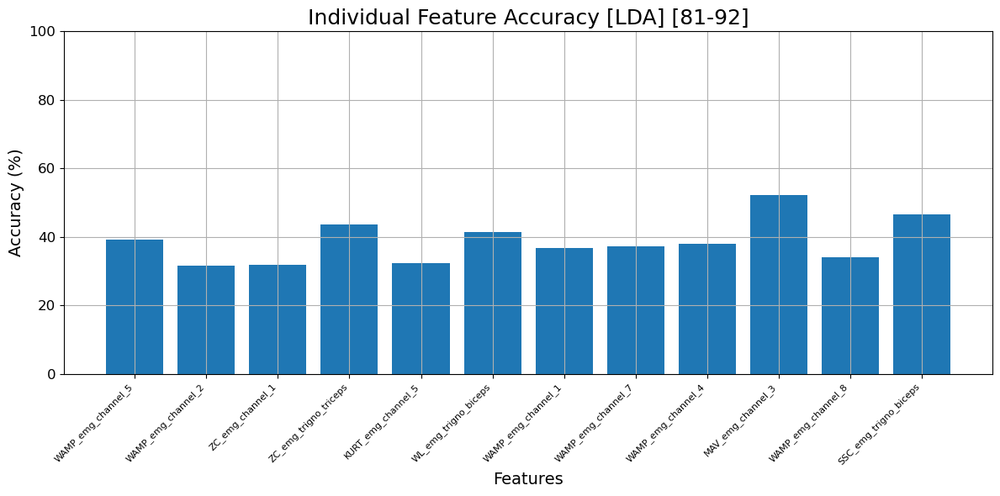

In [54]:
plot_feature_accuracy(accuracy_fs_emg, accuracy_results_emg[0])

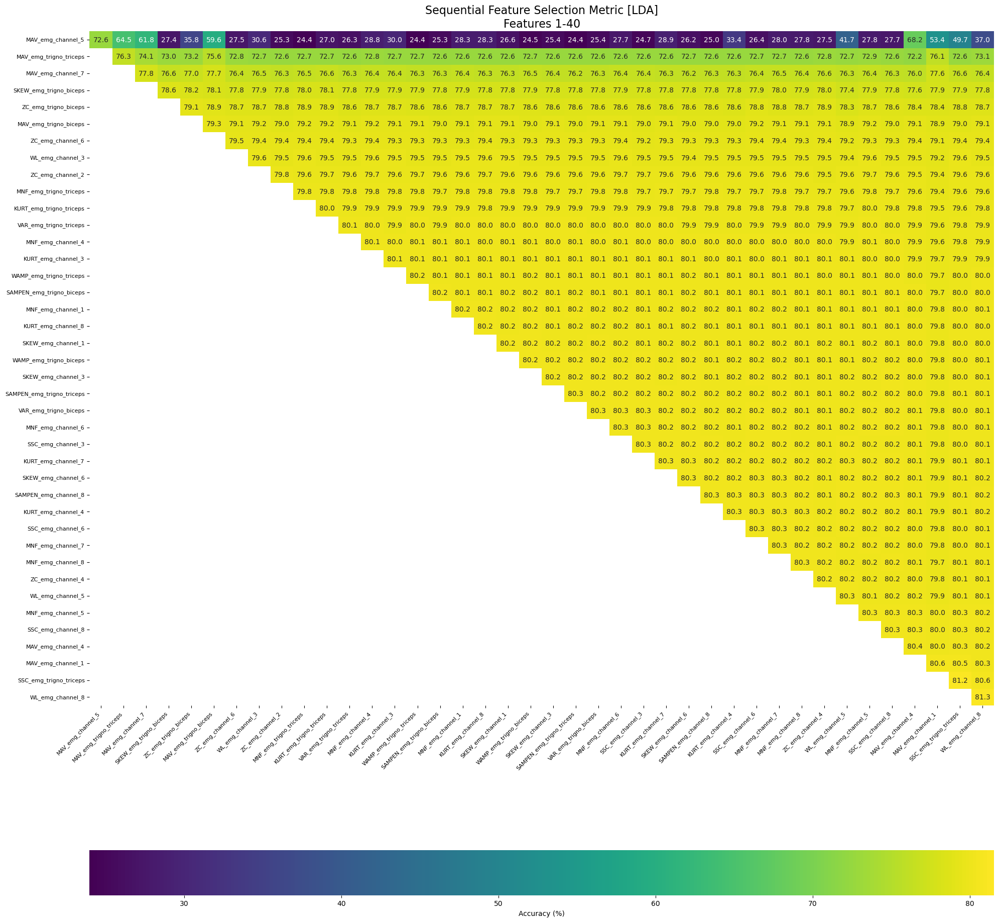

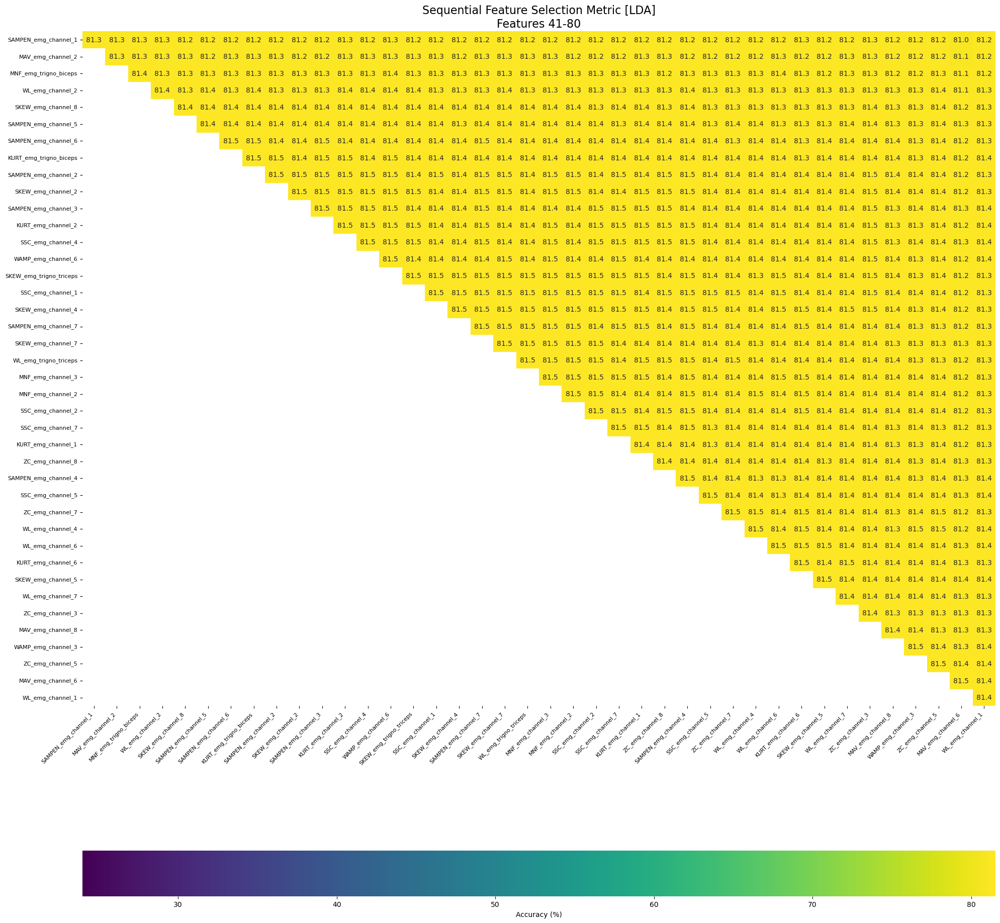

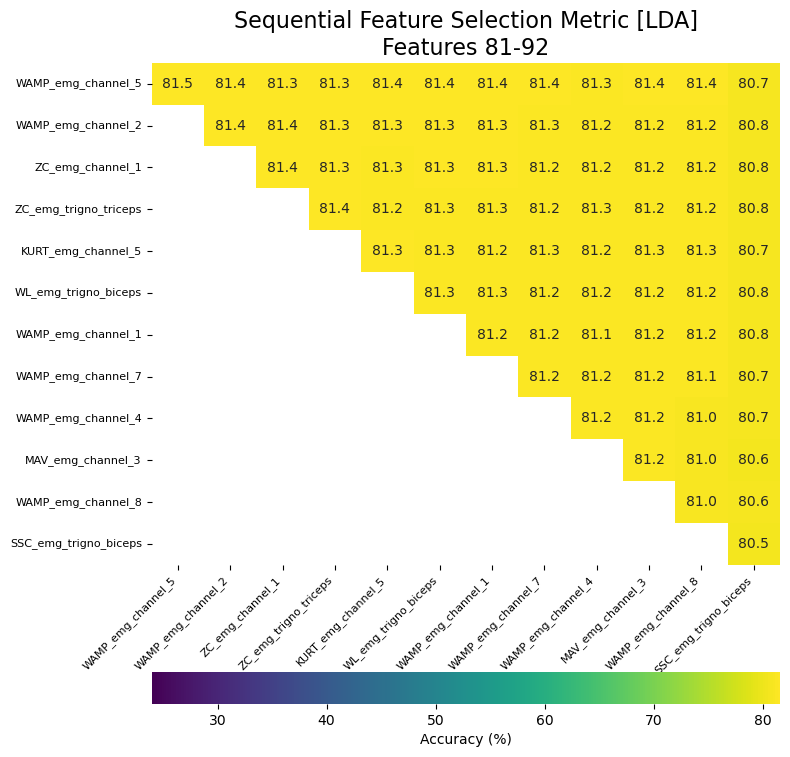

In [55]:
plot_sequential_selection_heatmap(accuracy_results_emg, accuracy_fs_emg)

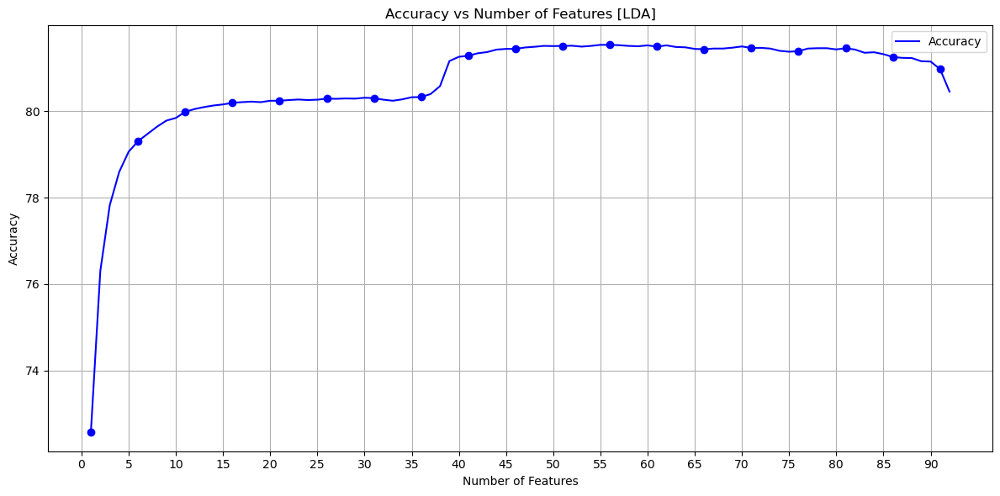

In [56]:
res = list(zip(range(1, len(np.diag(accuracy_results_emg)) + 1), np.diag(accuracy_results_emg)))
plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

IMU

In [57]:
X_imu = X_red.loc[:, X_red.columns.str.endswith(tuple(suffixes_imu))]
print(len(X_imu.columns))

111


In [58]:
crossvalidation_var, data_dict = prepare_cv_data(X_imu, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results_imu, accuracy_fs_imu = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

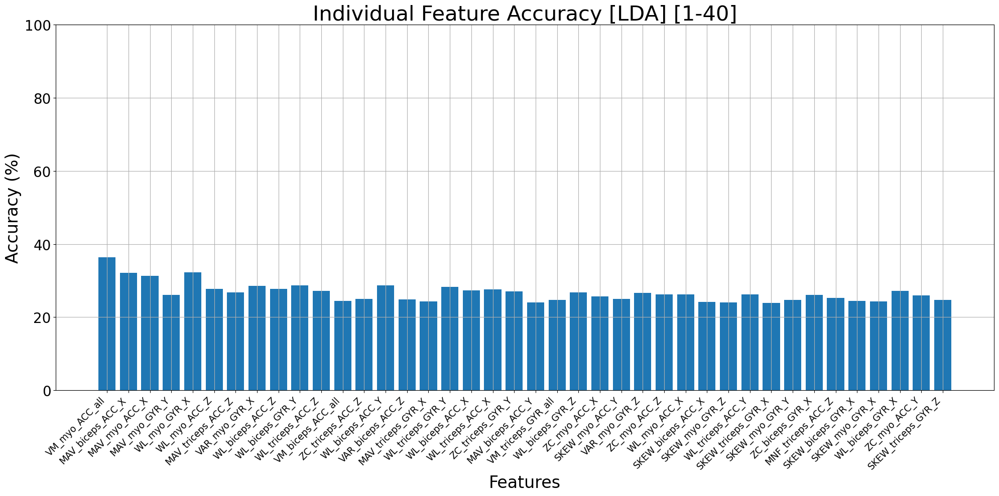

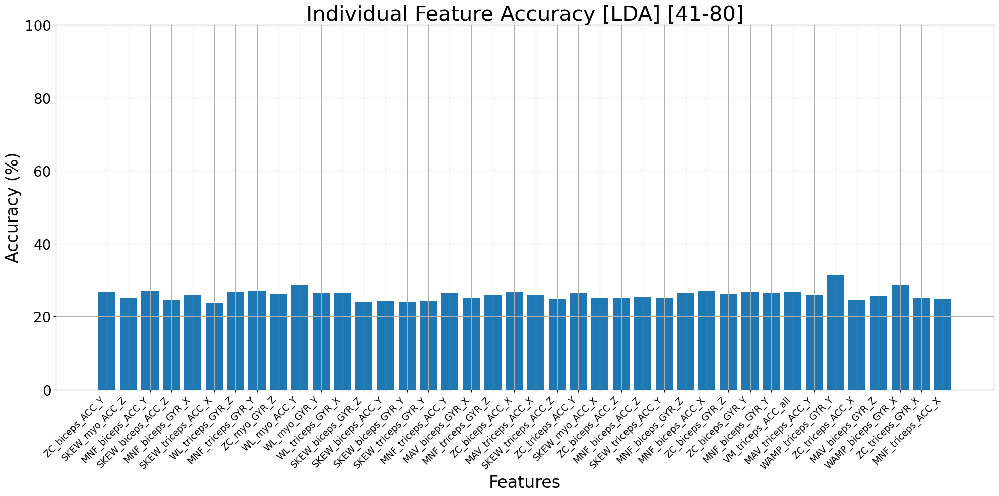

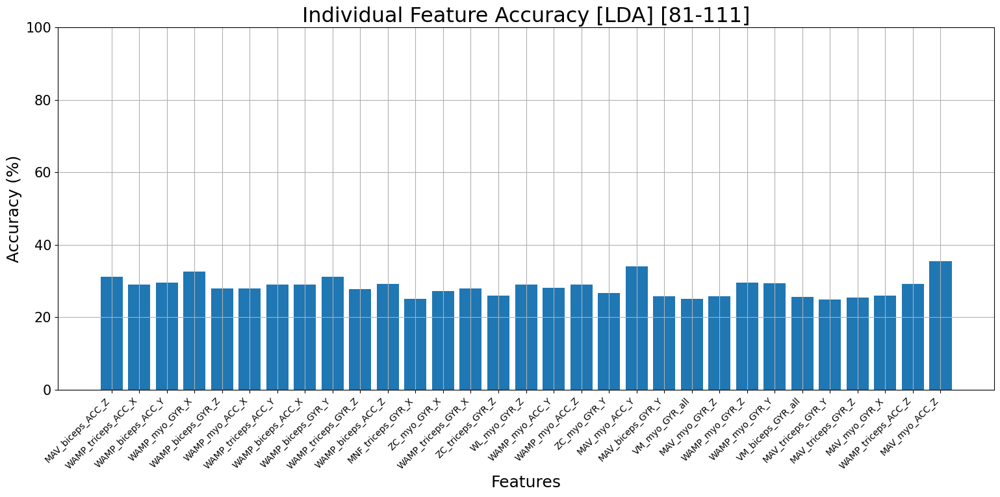

In [59]:
plot_feature_accuracy(accuracy_fs_imu, accuracy_results_imu[0])

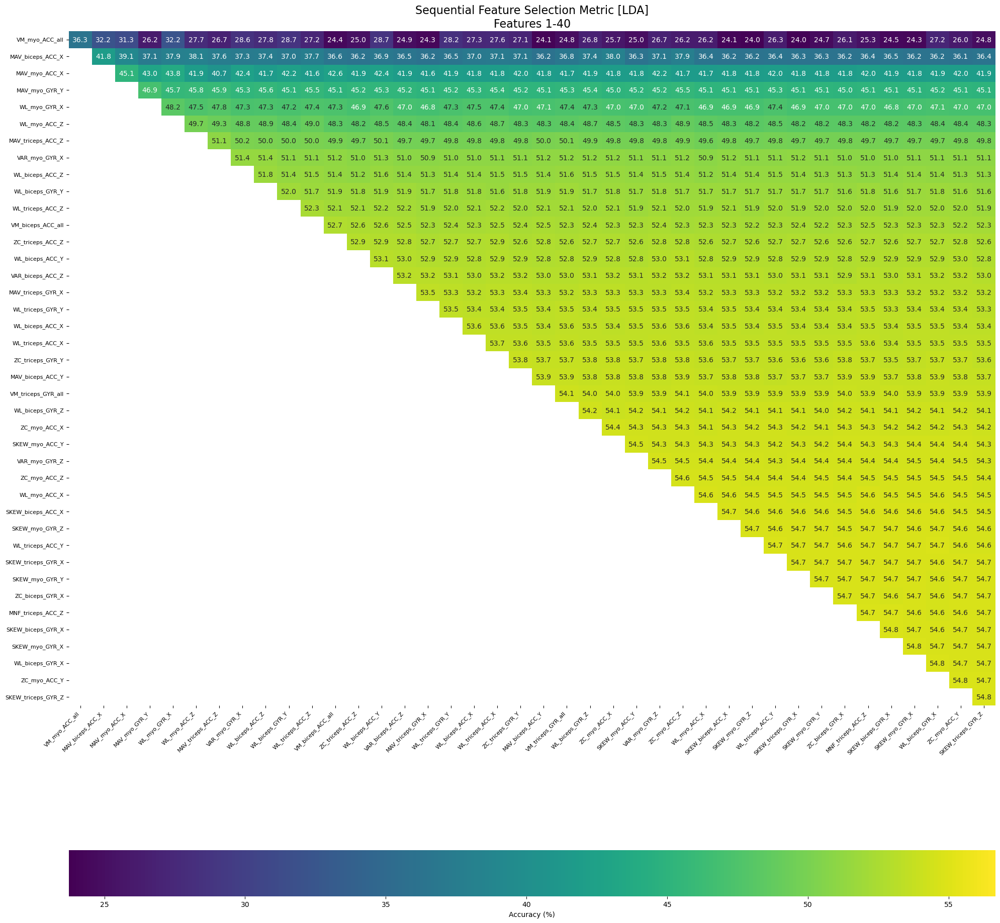

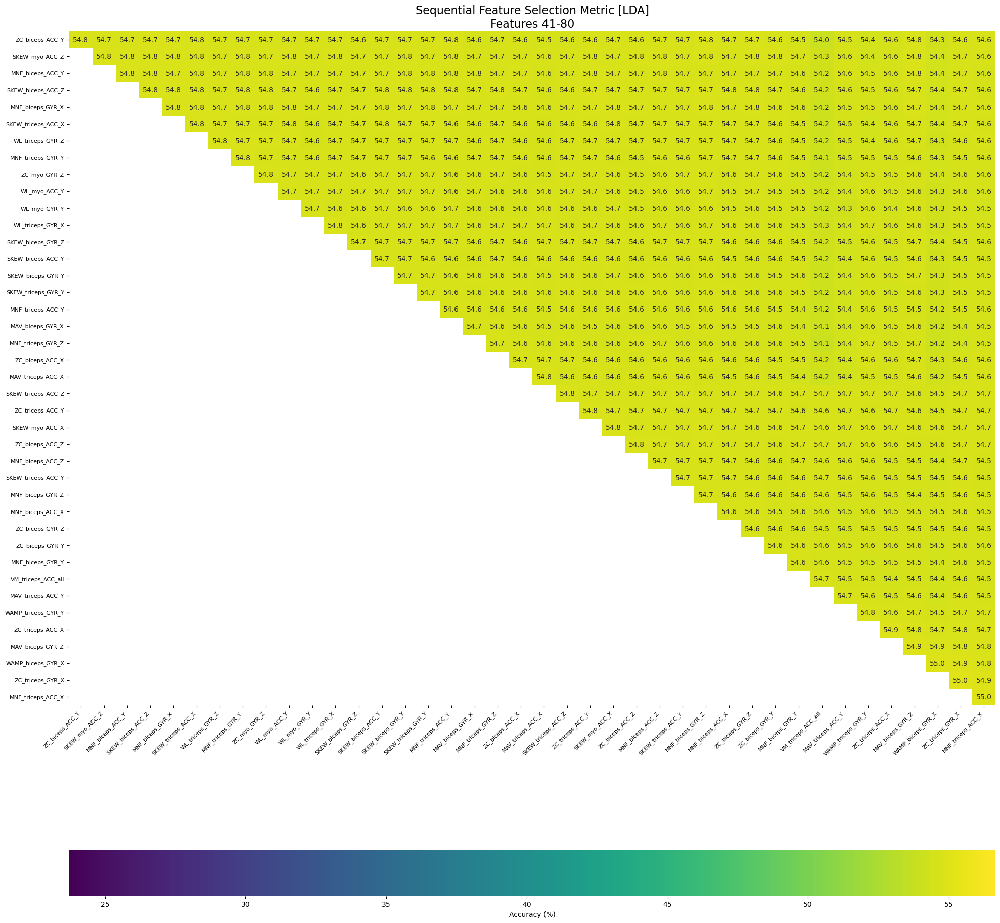

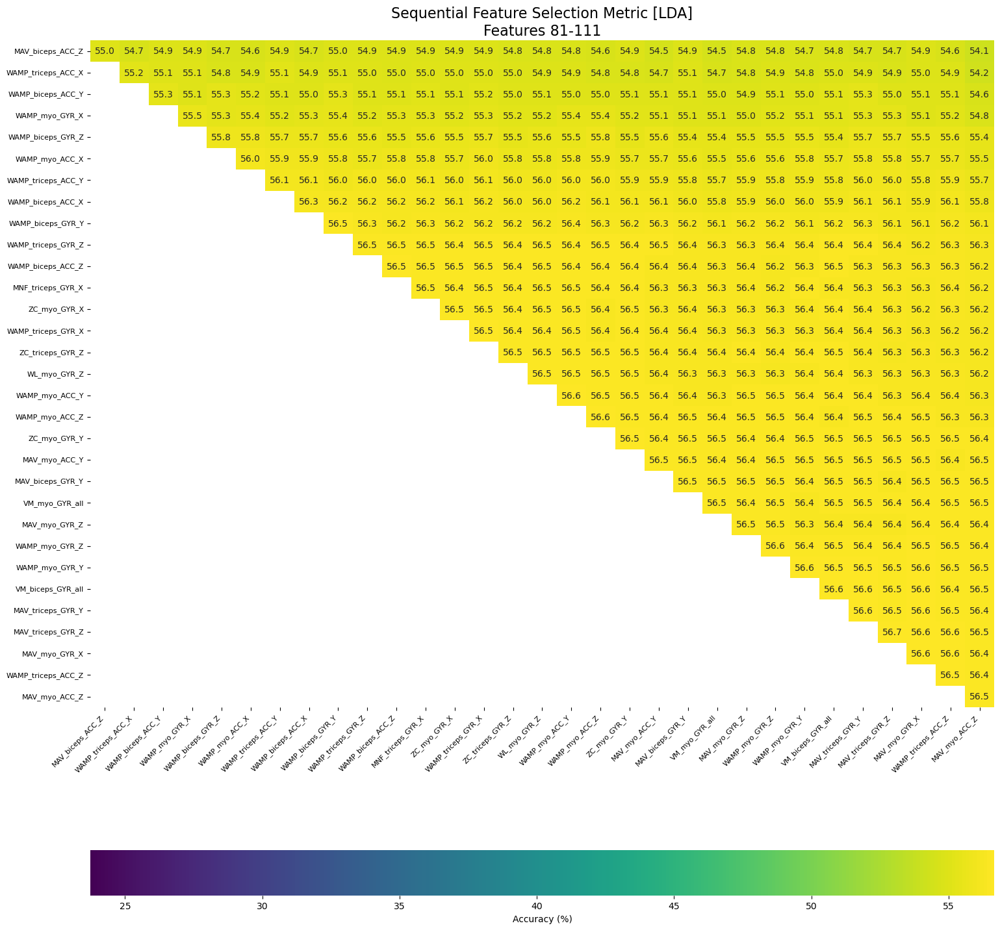

In [60]:
plot_sequential_selection_heatmap(accuracy_results_imu, accuracy_fs_imu)

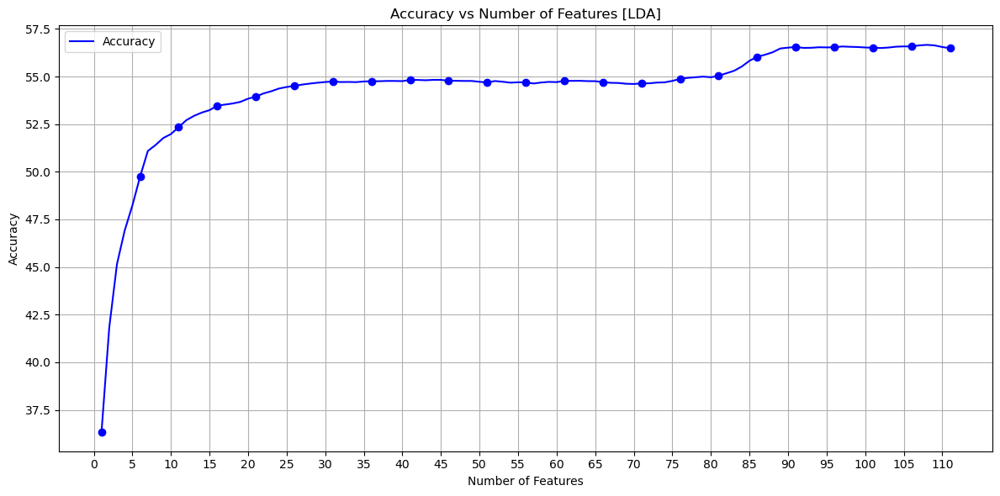

In [61]:
res = list(zip(range(1, len(np.diag(accuracy_results_imu)) + 1), np.diag(accuracy_results_imu)))
plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

EMG + IMU

In [63]:
crossvalidation_var, data_dict = prepare_cv_data(X_red, n_folds) # Prepare cross-validation fold labels and dict for feature selection
accuracy_results, accuracy_fs = fs.run_selection(data_dict, metric, y_train, crossvalidation_var) # Run feature selection

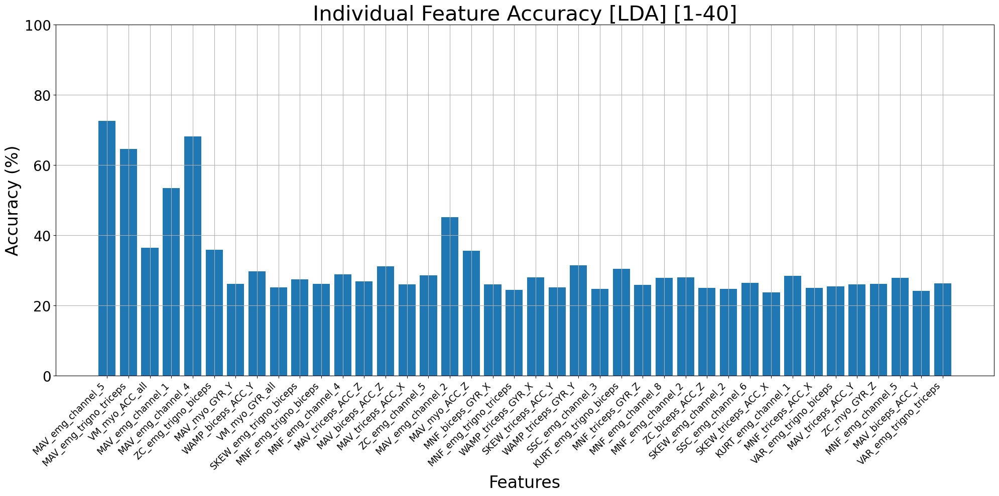

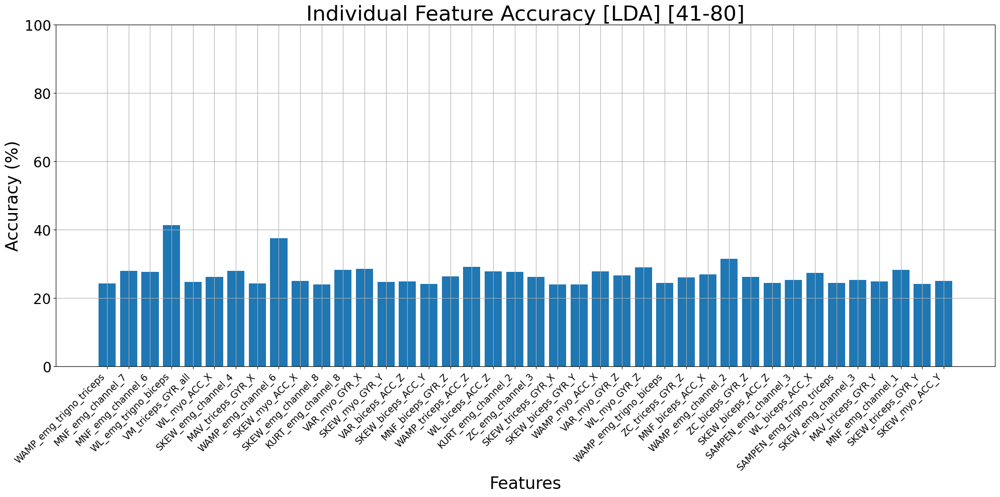

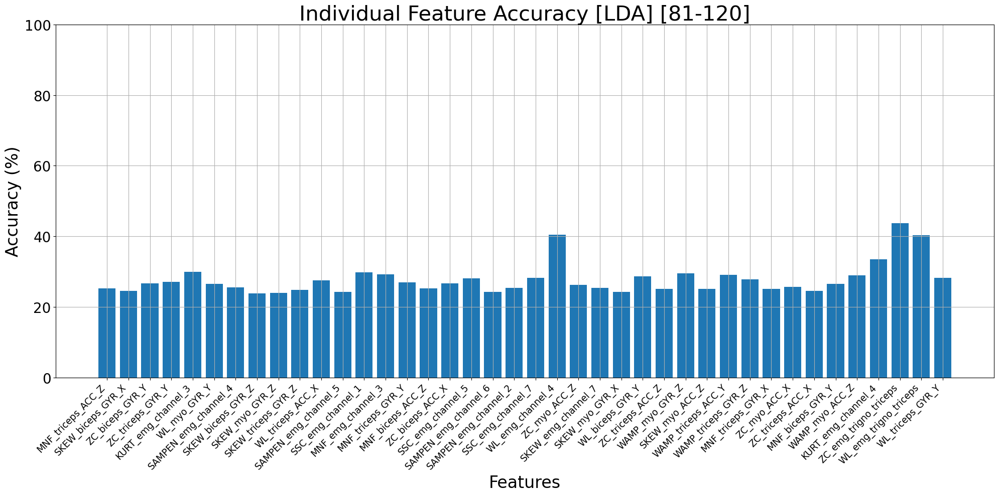

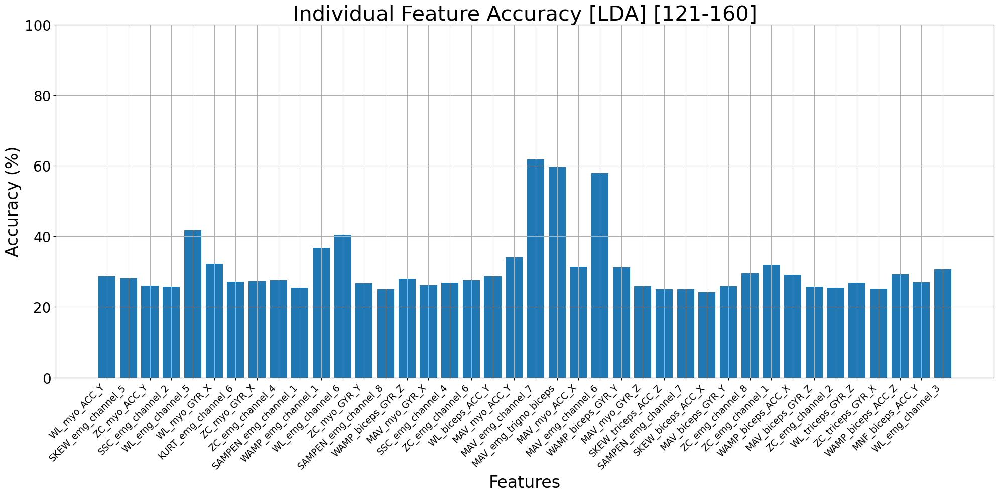

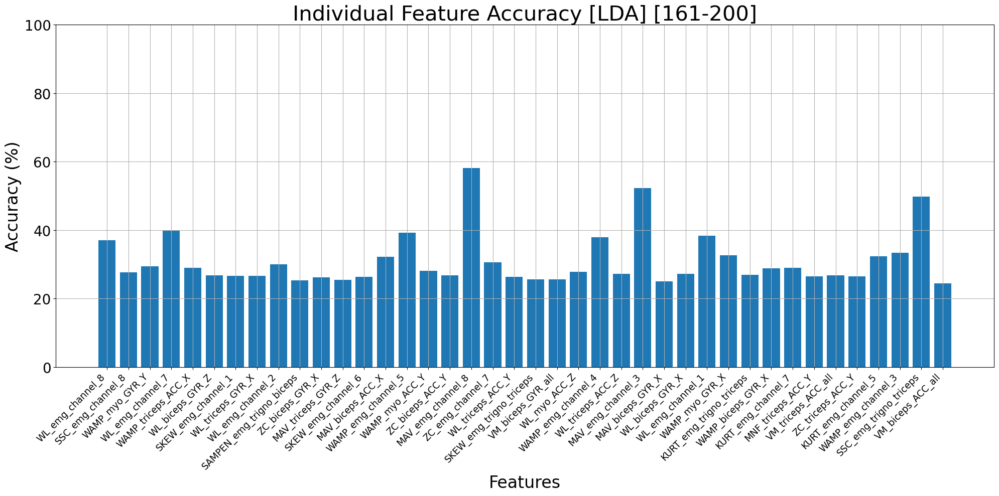

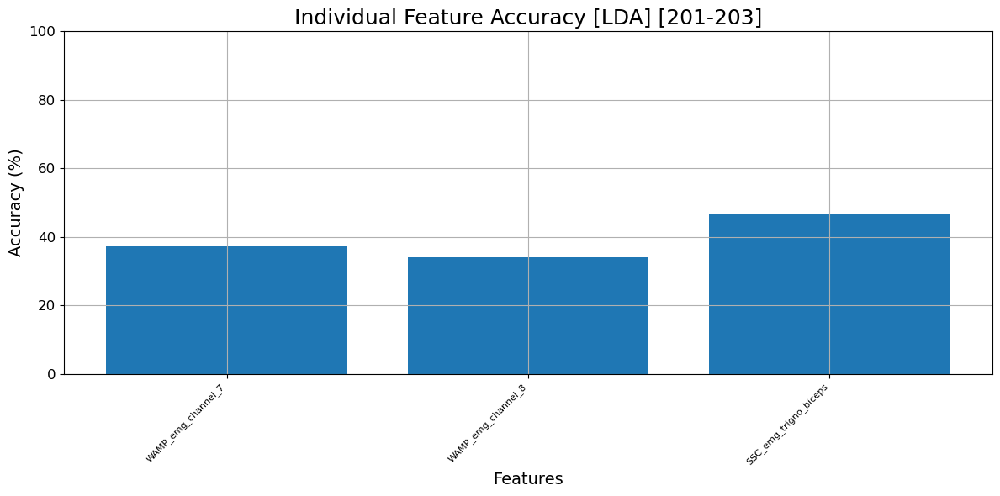

In [64]:
plot_feature_accuracy(accuracy_fs, accuracy_results[0])

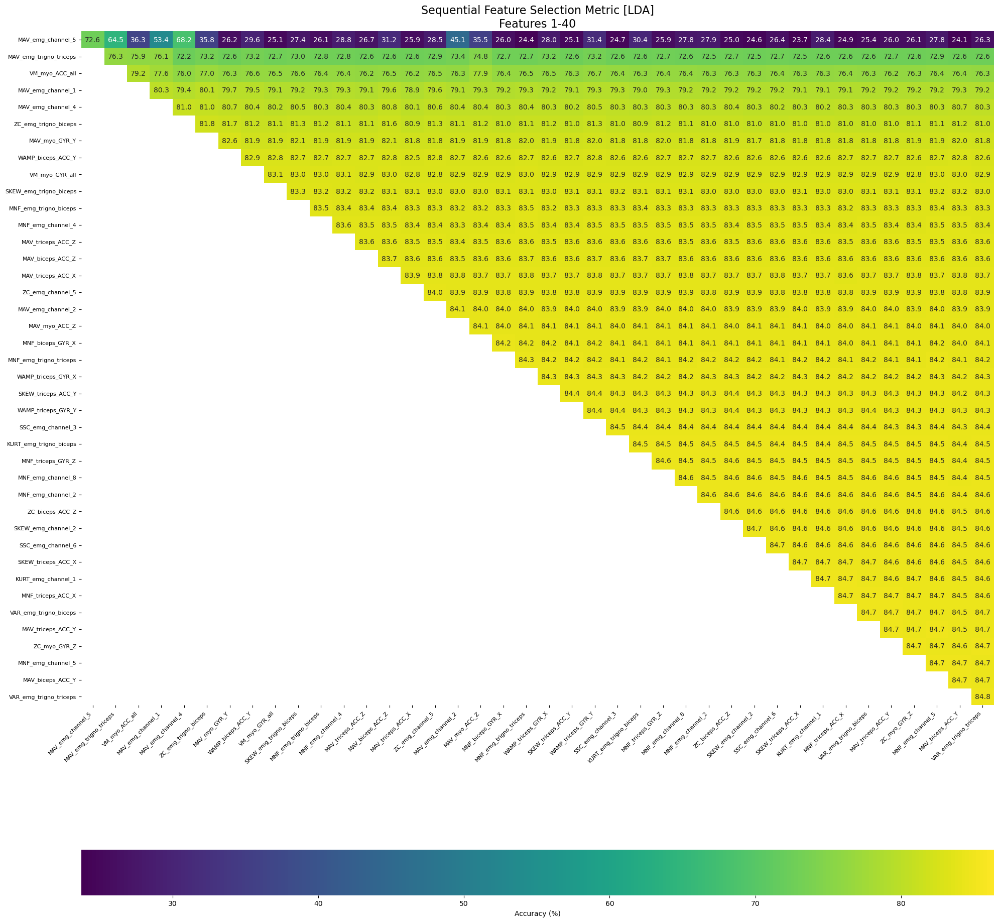

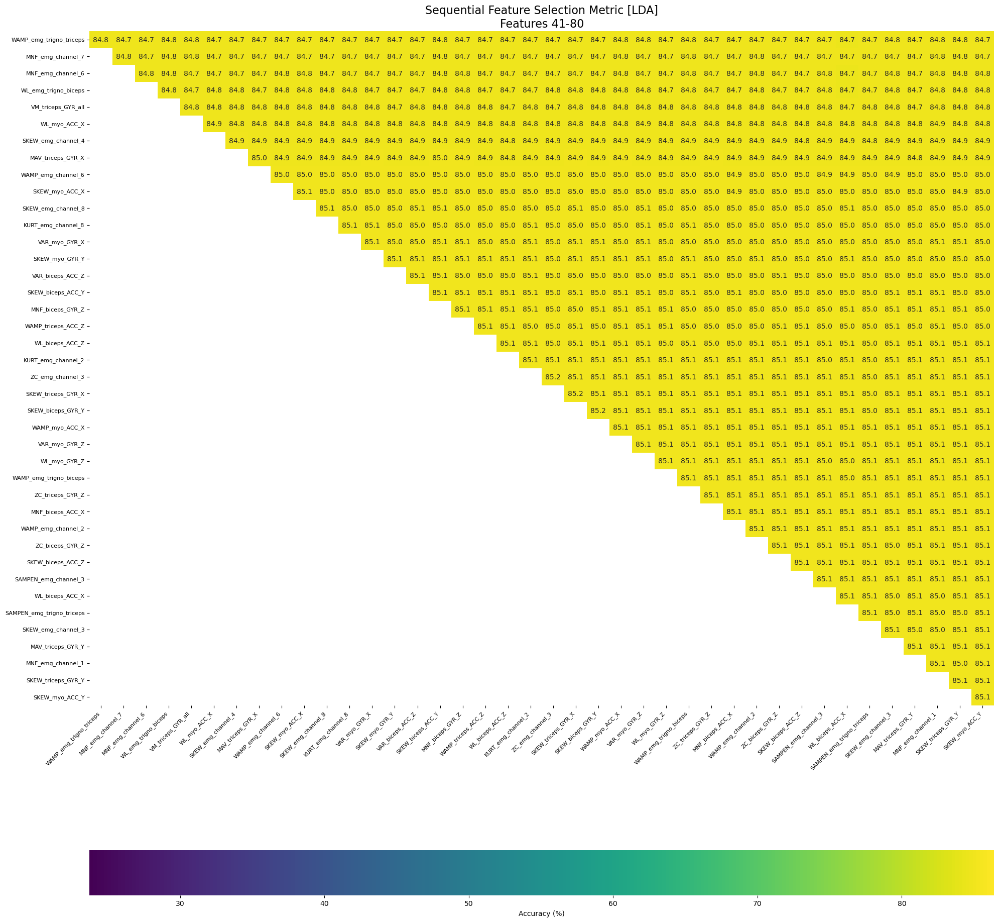

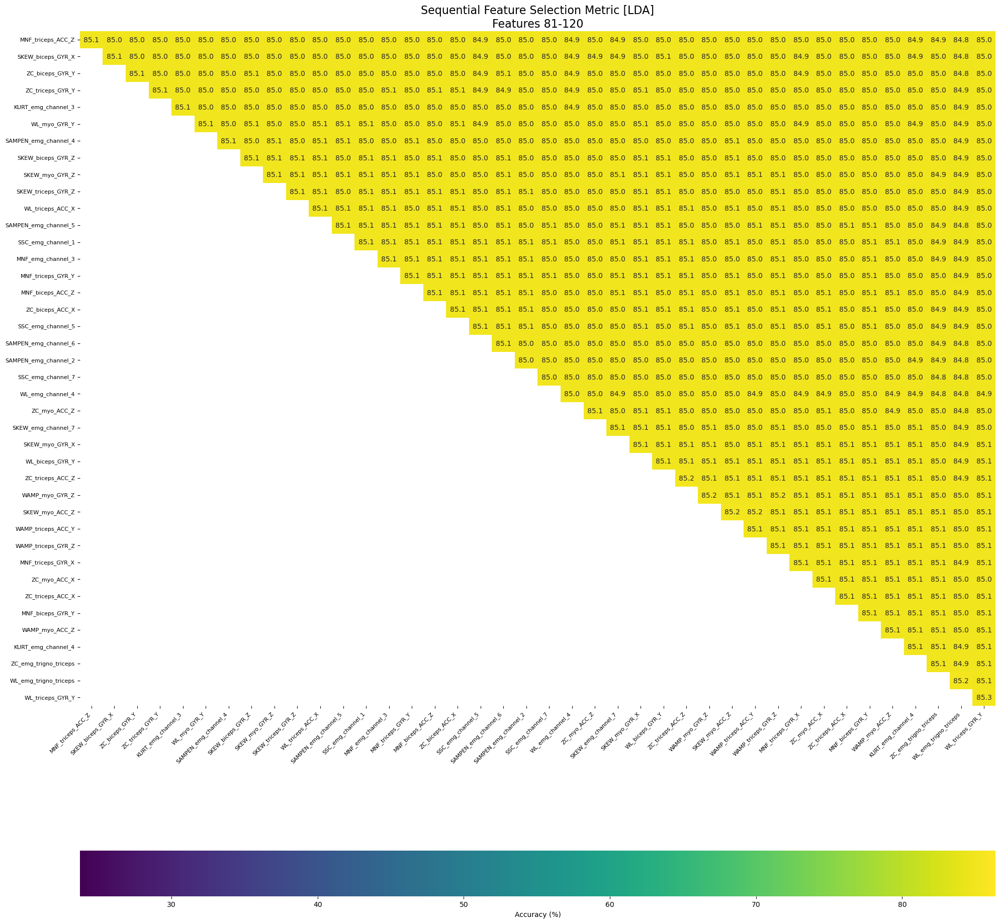

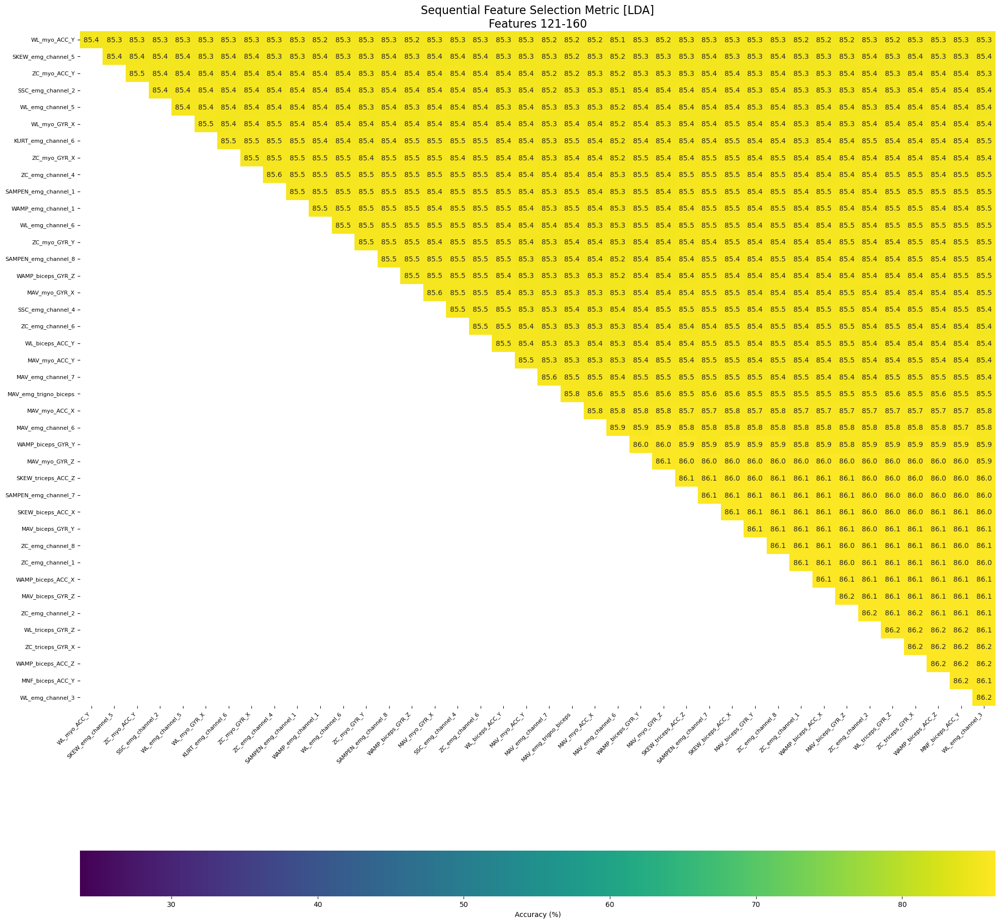

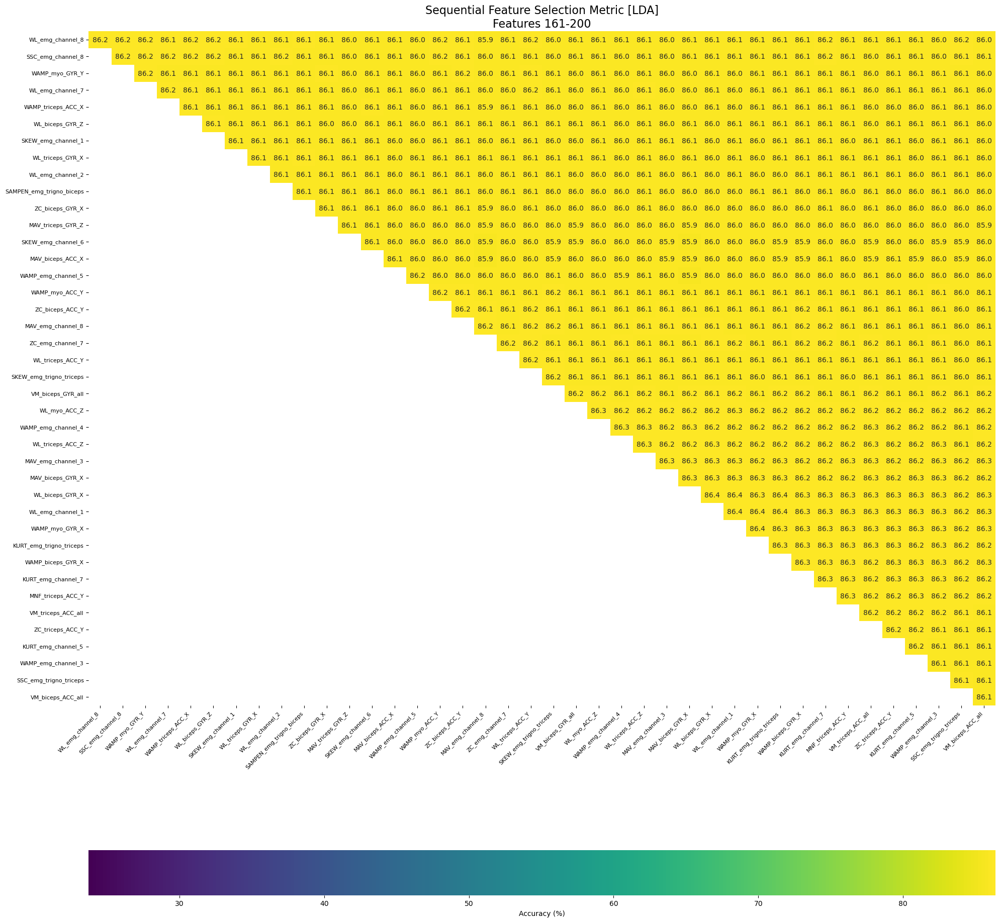

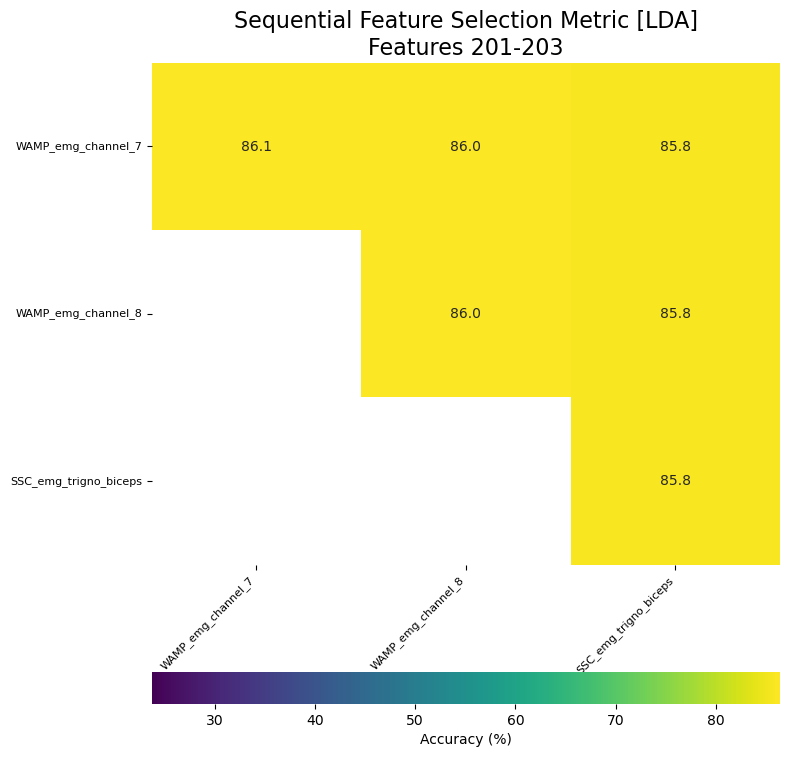

In [65]:
plot_sequential_selection_heatmap(accuracy_results, accuracy_fs)

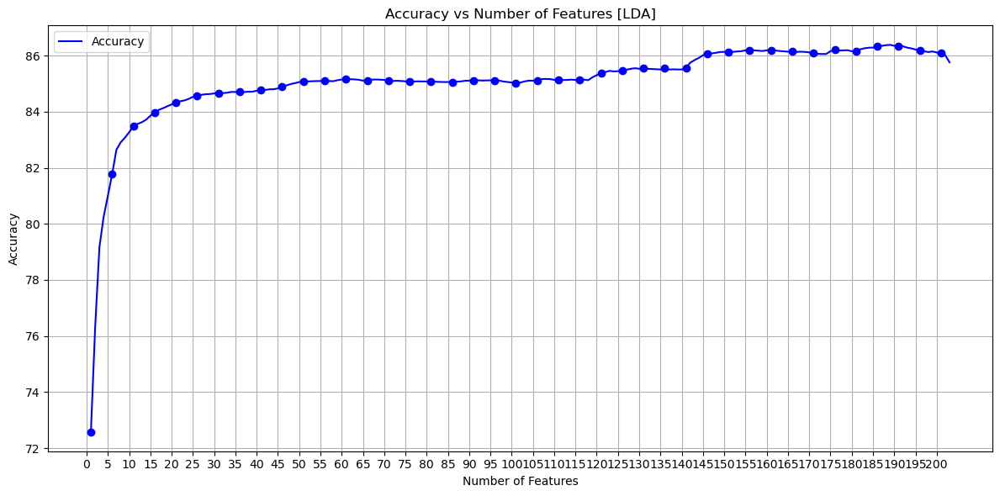

In [66]:
res = list(zip(range(1, len(np.diag(accuracy_results)) + 1), np.diag(accuracy_results)))
plot_feature_selection_performance(res, "LDA") # Plot accuracy to assess performance trends

## Principal Component Analysis (PCA)

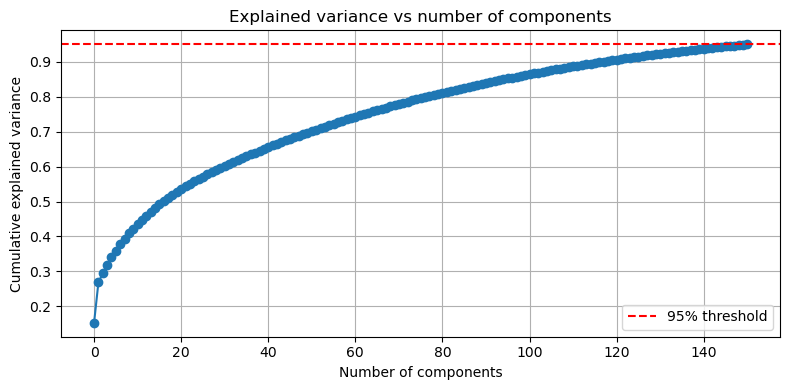

In [67]:
pca = PCA(n_components=0.95)  # Keep the number of components that explain 95% of the variance
X_pca = pca.fit_transform(X)  # Fit PCA on X and transform it to the reduced component space
plot_pca_variance(pca)        # Plot cumulative explained variance to visualize component contribution

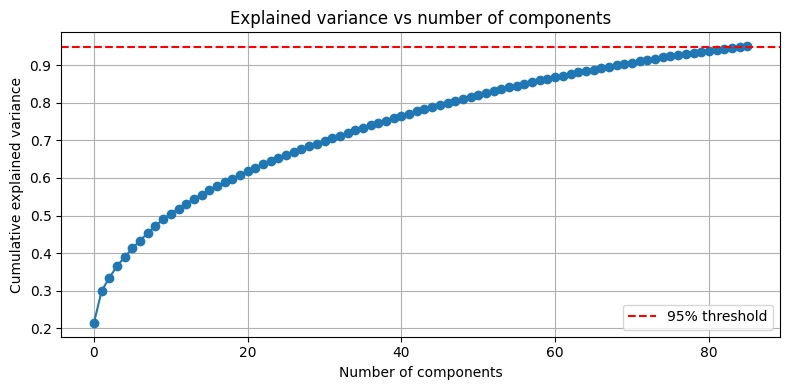

In [45]:
pca_myo = PCA(n_components=0.95) 
X_pca_myo = pca_myo.fit_transform(X_train_myo)
plot_pca_variance(pca_myo) 

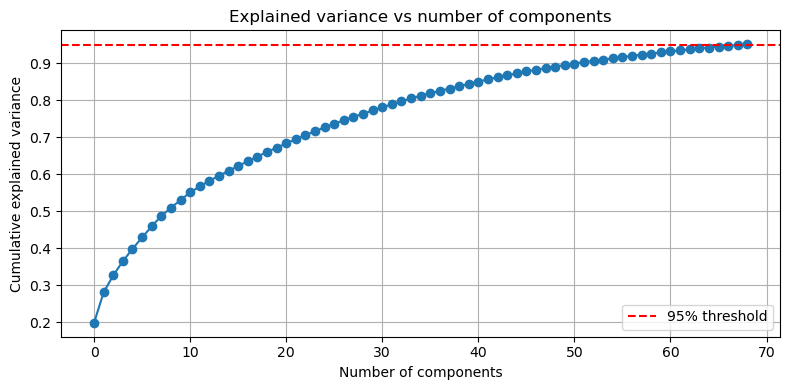

In [10]:
pca_trigno = PCA(n_components=0.95) 
X_pca_trigno = pca_trigno.fit_transform(X_train_trigno)
plot_pca_variance(pca_trigno) 

## Scaler, PCA, ordered columns export

In [46]:
joblib.dump(scaler, f'{output_folder}/scaler.pkl')
#joblib.dump(pca, f'{output_folder}/pca.pkl')
joblib.dump(pca_myo, f'{output_folder}/pca_myo.pkl')
#joblib.dump(pca_trigno, f'{output_folder}/pca_trigno.pkl')
#joblib.dump(accuracy_fs_emg, f'{output_folder}/selected_col_emg.pkl')
#joblib.dump(accuracy_fs_imu, f'{output_folder}/selected_col_imu.pkl')
#joblib.dump(accuracy_fs, f'{output_folder}/selected_col_all.pkl')
joblib.dump(accuracy_fs_emg_myo, f'{output_folder}/selected_col_emg_myo.pkl')
joblib.dump(accuracy_fs_imu_myo, f'{output_folder}/selected_col_imu_myo.pkl')
joblib.dump(accuracy_fs_myo, f'{output_folder}/selected_col_all_myo.pkl')
#joblib.dump(accuracy_fs_emg_trigno, f'{output_folder}/selected_col_emg_trigno.pkl')
#joblib.dump(accuracy_fs_imu_trigno, f'{output_folder}/selected_col_imu_trigno.pkl')
#joblib.dump(accuracy_fs_trigno, f'{output_folder}/selected_col_all_trigno.pkl')

['../data/models/_test/all12/selected_col_all_myo.pkl']

# Model Evaluation

In [11]:
# ONLY FOR UPLOAD
file_map = {
    'scaler': 'scaler.pkl',
    'pca': 'pca.pkl',
    #'pca_myo': 'pca_myo.pkl',
    #'pca_trigno': 'pca_trigno.pkl',
    'accuracy_fs_emg': 'selected_col_emg.pkl',
    'accuracy_fs_imu': 'selected_col_imu.pkl',
    'accuracy_fs': 'selected_col_all.pkl',
    'accuracy_fs_emg_myo': 'selected_col_emg_myo.pkl',
    'accuracy_fs_imu_myo': 'selected_col_imu_myo.pkl',
    'accuracy_fs_myo': 'selected_col_all_myo.pkl',
    'accuracy_fs_emg_trigno': 'selected_col_emg_trigno.pkl',
    'accuracy_fs_imu_trigno': 'selected_col_imu_trigno.pkl',
    'accuracy_fs_trigno': 'selected_col_all_trigno.pkl',
}

for var_name, filename in file_map.items():
    globals()[var_name] = joblib.load(f'{output_folder}/{filename}')

In [55]:
"""X_train1 = X_train[accuracy_fs[:150]]
X_train2 = X_train[accuracy_fs_emg[:60]] 
X_train3 = X_train[accuracy_fs_imu[:100]] 
X_train4 = pca.transform(X_train) # PCA feature set """

X_train5 = X_train[accuracy_fs_myo[:80]] # Reduced feature set (e.g., after removing highly correlated features)
X_train6 = X_train[accuracy_fs_emg_myo[:25]] 
X_train7 = X_train[accuracy_fs_imu_myo[:25]] 
X_train8 = pca_myo.transform(X_train_myo)
"""
X_train9 = X_train[accuracy_fs_trigno[:80]] # Reduced feature set (e.g., after removing highly correlated features)
X_train10 = X_train[accuracy_fs_emg_trigno[:15]] 
X_train11 = X_train[accuracy_fs_imu_trigno[:40]] 
X_train12 = pca_trigno.transform(X_train_trigno)

X_test1 = X_test[accuracy_fs[:150]]
X_test2 = X_test[accuracy_fs_emg[:60]] 
X_test3 = X_test[accuracy_fs_imu[:100]] 
X_test4 = pca.transform(X_test) # PCA feature set 
"""
X_test5 = X_test[accuracy_fs_myo[:80]] # Reduced feature set (e.g., after removing highly correlated features)
X_test6 = X_test[accuracy_fs_emg_myo[:25]] 
X_test7 = X_test[accuracy_fs_imu_myo[:25]] 
X_test8 = pca_myo.transform(X_test_myo) # PCA feature set 
"""
X_test9 = X_test[accuracy_fs_trigno[:80]] # Reduced feature set (e.g., after removing highly correlated features)
X_test10 = X_test[accuracy_fs_emg_trigno[:15]] 
X_test11 = X_test[accuracy_fs_imu_trigno[:40]] 
X_test12 = pca_trigno.transform(X_test_trigno) # PCA feature set 

feature_sets_train = [X_train1, X_train2, X_train3, X_train4, X_train5, X_train6, X_train7, X_train8, X_train9, X_train10, X_train11, X_train12]
feature_sets_test = [X_test1, X_test2, X_test3, X_test4, X_test5, X_test6, X_test7, X_test8, X_test9, X_test10, X_test11, X_test12]"""

'\nX_test9 = X_test[accuracy_fs_trigno[:80]] # Reduced feature set (e.g., after removing highly correlated features)\nX_test10 = X_test[accuracy_fs_emg_trigno[:15]] \nX_test11 = X_test[accuracy_fs_imu_trigno[:40]] \nX_test12 = pca_trigno.transform(X_test_trigno) # PCA feature set \n\nfeature_sets_train = [X_train1, X_train2, X_train3, X_train4, X_train5, X_train6, X_train7, X_train8, X_train9, X_train10, X_train11, X_train12]\nfeature_sets_test = [X_test1, X_test2, X_test3, X_test4, X_test5, X_test6, X_test7, X_test8, X_test9, X_test10, X_test11, X_test12]'

In [56]:
feature_sets_train = [X_train5, X_train6, X_train7, X_train8]
feature_sets_test = [X_test5, X_test6, X_test7, X_test8]

In [85]:
channel_names = [
        'channel_1', 'channel_2', 'channel_3', 'channel_4',
        'channel_5', 'channel_6', 'channel_7', 'channel_8']
imu_names = [
        'ACC_X', 'ACC_Y', 'ACC_Z',
        'GYR_X', 'GYR_Y', 'GYR_Z']

features_list_norm = ['MAV', 'WL', 'WAMP', 'VAR']  # Features on normalized signal
#features_list_norm = ['MAV', 'WL']  # Features on normalized signal
features_list_filt = ['ZC', 'SSC']  # Features on filtered signal 
features_list_imu = ['MAV', 'SKEW', 'VAR', 'WAMP']
#features_list_imu = ['MAV', 'SKEW', 'VAR']
selected_feature_names = []
for ch in sorted(channel_names):  
    feats = sorted(features_list_norm + features_list_filt)
    #feats = sorted(features_list_norm)
    selected_feature_names.extend([f"{feat}_emg_{ch}" for feat in feats])

for i,ch in enumerate(sorted(imu_names)):
    feats = sorted(features_list_imu)
    selected_feature_names.extend([f"{feat}_myo_{ch}" for feat in feats])
    if i == 2:  # indice 2 = terzo elemento (contando da 0)
        selected_feature_names.append("VM_myo_ACC_all")
        
selected_feature_names.append("VM_myo_GYR_all")

print(len(selected_feature_names))

74


In [86]:
X_train = train_df.drop(columns=['label'])
X_test = test_df.drop(columns=['label'])

y_train = train_df['label']
y_test = test_df['label']

y_train = y_train.map(label_map)  # Convert label strings to numeric values using label_map
y_test = y_test.map(label_map)  # Convert label strings to numeric values using label_map

X = scaler.fit_transform(X_train[selected_feature_names]) # Scale features to zero mean and unit variance to normalize data
X_train = pd.DataFrame(X, columns=X_train[selected_feature_names].columns, index=X_train[selected_feature_names].index) # Scaled dataframe with column names

X = scaler.transform(X_test[selected_feature_names]) # Apply same scaling used on training data to test set
X_test = pd.DataFrame(X, columns=X_test[selected_feature_names].columns, index=X_test[selected_feature_names].index) # Scaled dataframe with column names

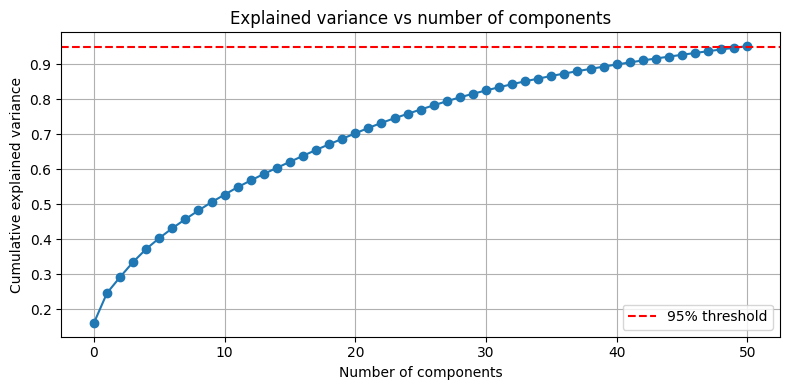

In [87]:
pca = PCA(n_components=0.95) 
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
plot_pca_variance(pca) 

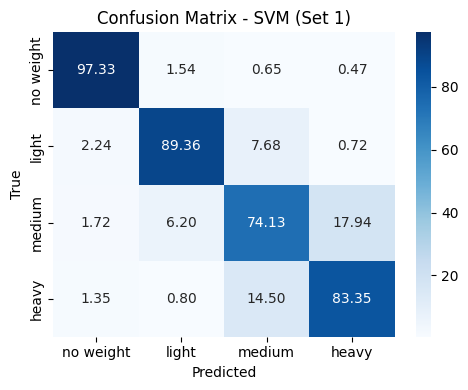

-------- SVM Classifier - Evaluation Metrics --------
Accuracy: Set 1: 86.05%
Precision: Set 1: 85.97%
Recall: Set 1: 86.05%
F1: Set 1: 85.99%
Training_time: Set 1: 249.1597 s
Inference_time: Set 1: 2.2031 ms


In [88]:
feature_sets_train = [X_train]
feature_sets_test = [X_test]
output_folder = f'../'
#output_folder = f'../data/stream/models/emg_imu/74/GB2'  # Output folder
joblib.dump(scaler, f'{output_folder}/scaler.pkl')
joblib.dump(pca, f'{output_folder}/pca.pkl')

model_name = 'SVM'
gb_params = {'n_estimators': 500, 'learning_rate': 0.05, 'max_depth': 5, 'subsample': 0.8, 'min_samples_split': 5, 'max_features': 'sqrt'}
gb_params2 = {'n_estimators': 800, 'learning_rate': 0.02, 'max_depth': 6, 'subsample': 0.7, 'min_samples_split': 3, 'max_features': 0.8}
svm_params = {'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale', 'probability': True}
mlp_params ={ 'hidden_layer_sizes': (100, 50, 30), 'activation': 'relu', 'solver': 'adam', 'max_iter': 500, 'early_stopping': True, 'alpha': 0.0001}
knn_params = {'n_neighbors': 9, 'weights': 'distance', 'metric': 'euclidean', 'algorithm': 'auto'}
folder = f"{output_folder}"
evaluate_and_store_results(feature_sets_train, feature_sets_test, y_train, y_test, model_name, results, folder, svm_params)
print_results(model_name, results[model_name])

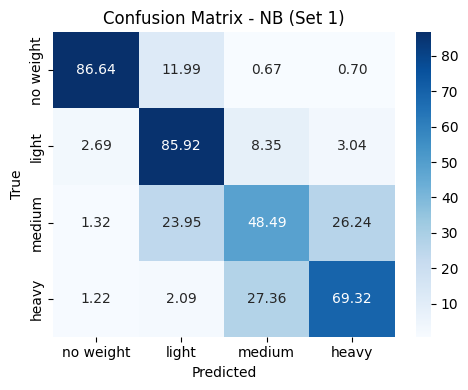

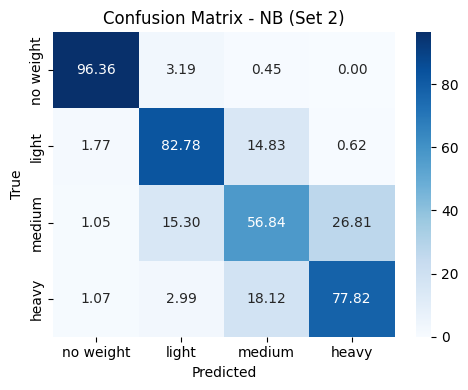

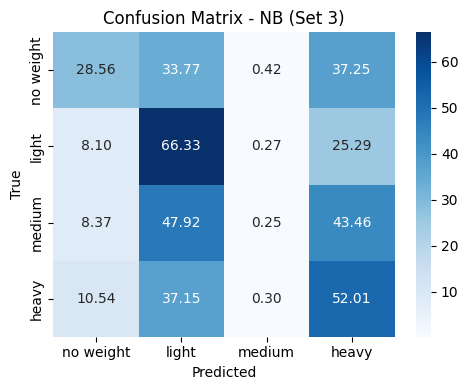

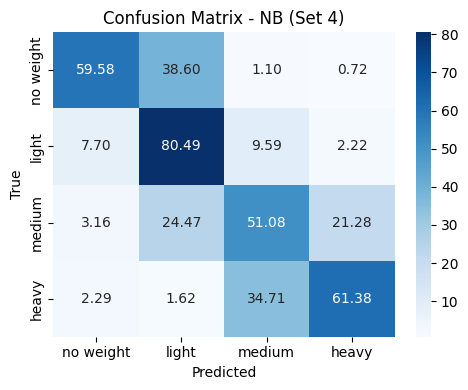

-------- NB Classifier - Evaluation Metrics --------
Accuracy: Set 1: 72.60% | Set 2: 78.45% | Set 3: 36.79% | Set 4: 63.13%
Precision: Set 1: 72.64% | Set 2: 78.11% | Set 3: 35.03% | Set 4: 65.50%
Recall: Set 1: 72.60% | Set 2: 78.45% | Set 3: 36.79% | Set 4: 63.13%
F1: Set 1: 72.27% | Set 2: 78.22% | Set 3: 31.01% | Set 4: 63.19%
Training_time: Set 1: 0.0520 s | Set 2: 0.0243 s | Set 3: 0.0176 s | Set 4: 0.0490 s
Inference_time: Set 1: 1.3600 ms | Set 2: 1.1085 ms | Set 3: 1.0022 ms | Set 4: 0.3192 ms


In [57]:
#################################### Naive Bayes ########################
model_name = 'NB'
folder = f"{output_folder}/{model_name}"
evaluate_and_store_results(feature_sets_train, feature_sets_test, y_train, y_test, model_name, results, folder)
print_results(model_name, results[model_name])

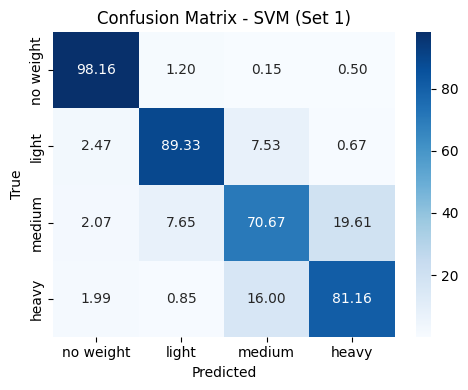

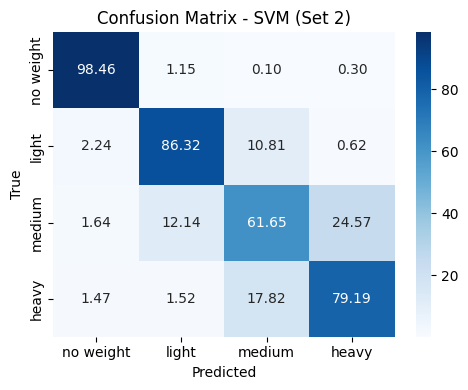

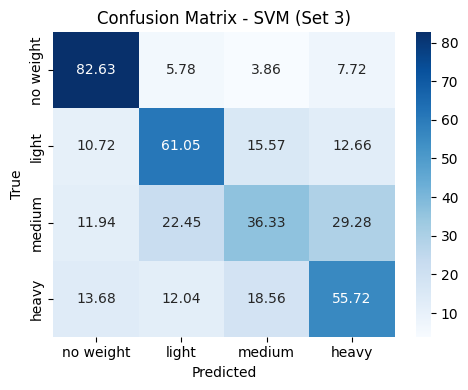

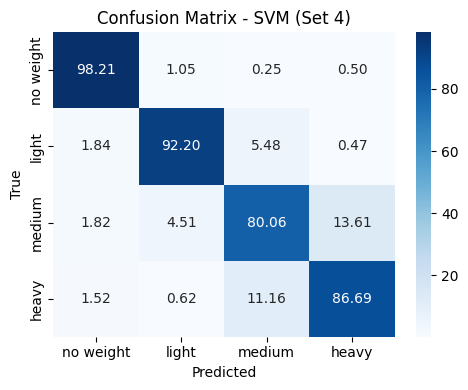

-------- SVM Classifier - Evaluation Metrics --------
Accuracy: Set 1: 84.83% | Set 2: 81.40% | Set 3: 58.93% | Set 4: 89.29%
Precision: Set 1: 84.62% | Set 2: 81.02% | Set 3: 57.87% | Set 4: 89.22%
Recall: Set 1: 84.83% | Set 2: 81.40% | Set 3: 58.93% | Set 4: 89.29%
F1: Set 1: 84.70% | Set 2: 81.15% | Set 3: 58.02% | Set 4: 89.24%
Training_time: Set 1: 343.7772 s | Set 2: 183.4670 s | Set 3: 481.1270 s | Set 4: 332.2187 s
Inference_time: Set 1: 3.6551 ms | Set 2: 2.9516 ms | Set 3: 4.2546 ms | Set 4: 2.4123 ms


In [58]:
#################################### SVM ########################
model_name = 'SVM' 
svm_params = {'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale', 'probability': True}
folder = f"{output_folder}/{model_name}"
evaluate_and_store_results(feature_sets_train, feature_sets_test, y_train, y_test, model_name, results, folder, svm_params)
print_results(model_name, results[model_name])

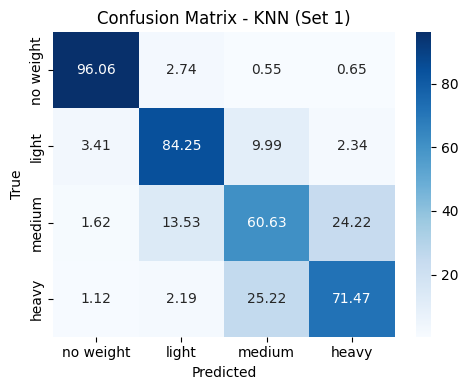

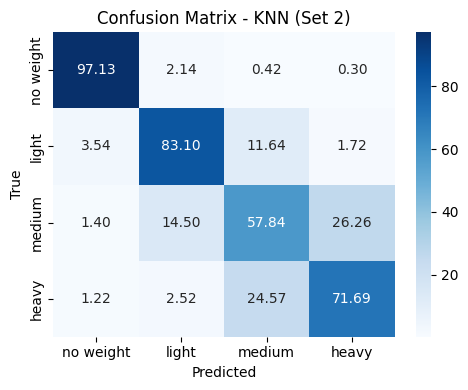

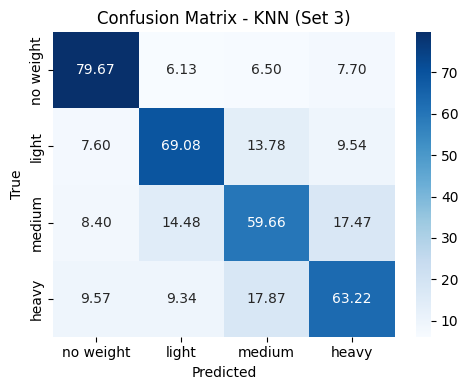

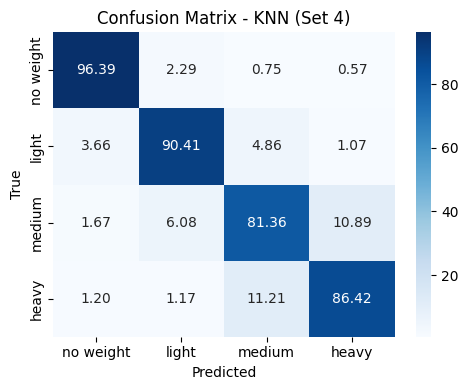

-------- KNN Classifier - Evaluation Metrics --------
Accuracy: Set 1: 78.10% | Set 2: 77.44% | Set 3: 67.90% | Set 4: 88.64%
Precision: Set 1: 77.83% | Set 2: 77.06% | Set 3: 67.75% | Set 4: 88.58%
Recall: Set 1: 78.10% | Set 2: 77.44% | Set 3: 67.90% | Set 4: 88.64%
F1: Set 1: 77.95% | Set 2: 77.23% | Set 3: 67.81% | Set 4: 88.60%
Training_time: Set 1: 0.0344 s | Set 2: 0.0226 s | Set 3: 0.0051 s | Set 4: 0.0071 s
Inference_time: Set 1: 3.7223 ms | Set 2: 2.5430 ms | Set 3: 2.4235 ms | Set 4: 1.8450 ms


In [59]:
#################################### KNN ########################
model_name = 'KNN'
knn_params = {'n_neighbors': 5, 'weights': 'distance', 'metric': 'manhattan', 'p': 1, 'algorithm': 'auto'}
folder = f"{output_folder}/{model_name}"
evaluate_and_store_results(feature_sets_train, feature_sets_test, y_train, y_test, model_name, results, folder, knn_params)
print_results(model_name, results[model_name])

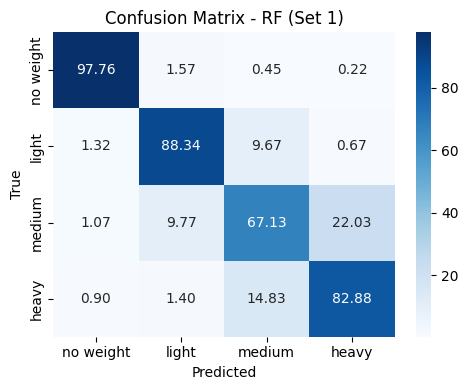

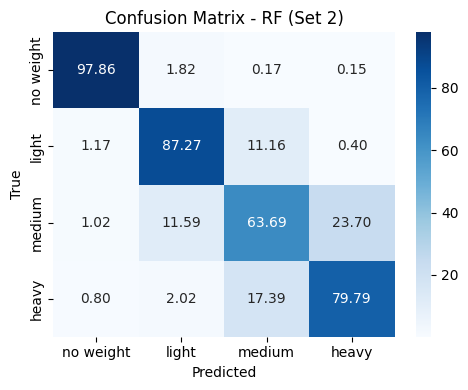

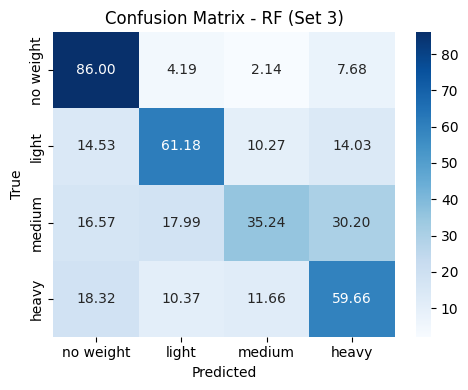

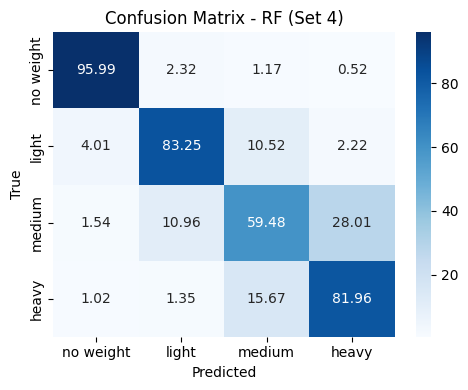

-------- RF Classifier - Evaluation Metrics --------
Accuracy: Set 1: 84.03% | Set 2: 82.15% | Set 3: 60.52% | Set 4: 80.17%
Precision: Set 1: 83.85% | Set 2: 81.91% | Set 3: 60.42% | Set 4: 79.96%
Recall: Set 1: 84.03% | Set 2: 82.15% | Set 3: 60.52% | Set 4: 80.17%
F1: Set 1: 83.89% | Set 2: 81.99% | Set 3: 59.21% | Set 4: 79.91%
Training_time: Set 1: 1.0652 s | Set 2: 0.7472 s | Set 3: 0.7588 s | Set 4: 1.3390 s
Inference_time: Set 1: 34.5863 ms | Set 2: 35.6641 ms | Set 3: 30.7921 ms | Set 4: 32.7696 ms


In [60]:
#################################### Random Forest ########################
model_name = 'RF'  
rf_params = {'n_estimators': 30, 'min_samples_split': 30, 'max_features': 'sqrt', 'max_depth': 10, 'oob_score': True, 'random_state': 1, 'n_jobs': -1}
folder = f"{output_folder}/{model_name}"
evaluate_and_store_results(feature_sets_train, feature_sets_test, y_train, y_test, model_name, results, folder, rf_params)
print_results(model_name, results[model_name])

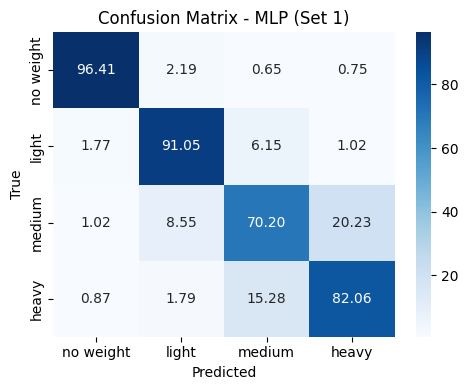

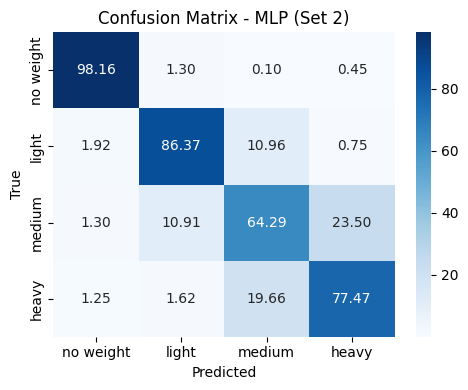

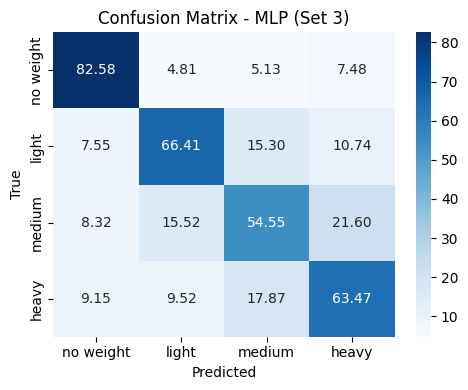

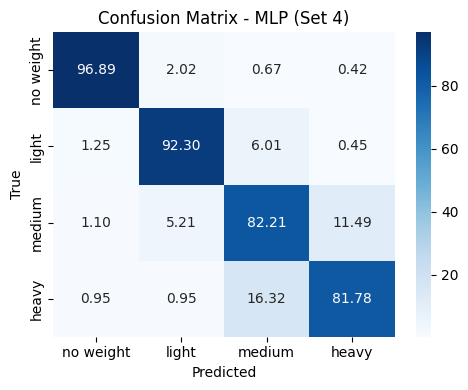

-------- MLP Classifier - Evaluation Metrics --------
Accuracy: Set 1: 84.93% | Set 2: 81.57% | Set 3: 66.75% | Set 4: 88.29%
Precision: Set 1: 84.79% | Set 2: 81.34% | Set 3: 66.48% | Set 4: 88.40%
Recall: Set 1: 84.93% | Set 2: 81.57% | Set 3: 66.75% | Set 4: 88.29%
F1: Set 1: 84.82% | Set 2: 81.44% | Set 3: 66.56% | Set 4: 88.31%
Training_time: Set 1: 15.3504 s | Set 2: 17.4574 s | Set 3: 32.1525 s | Set 4: 13.4250 s
Inference_time: Set 1: 1.3928 ms | Set 2: 0.9990 ms | Set 3: 0.9639 ms | Set 4: 0.1615 ms


In [61]:
#################################### Neural Network ########################
model_name = 'MLP'  
mlp_params ={ 'hidden_layer_sizes': (100, 50, 30), 'activation': 'relu', 'solver': 'adam', 'max_iter': 500, 'early_stopping': True, 'alpha': 0.0001}
folder = f"{output_folder}/{model_name}"
evaluate_and_store_results(feature_sets_train, feature_sets_test, y_train, y_test, model_name, results, folder, mlp_params)
print_results(model_name, results[model_name])

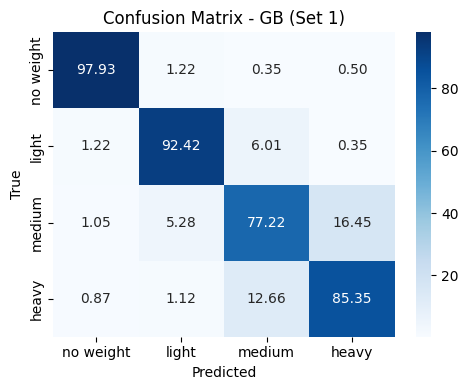

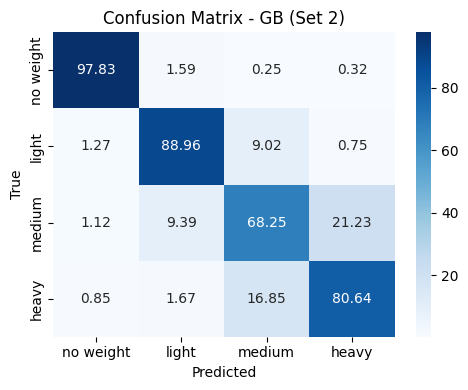

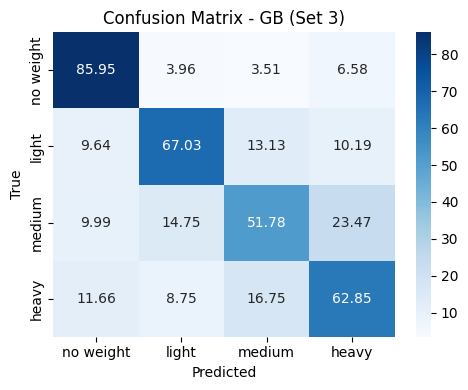

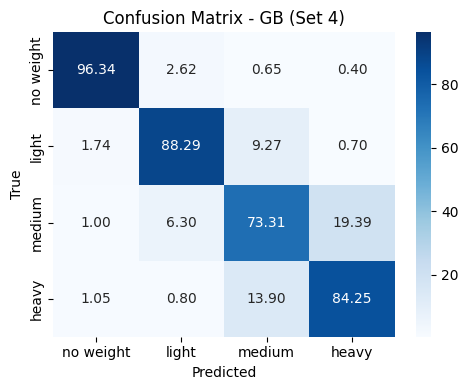

-------- GB Classifier - Evaluation Metrics --------
Accuracy: Set 1: 88.23% | Set 2: 83.92% | Set 3: 66.90% | Set 4: 85.55%
Precision: Set 1: 88.17% | Set 2: 83.75% | Set 3: 66.50% | Set 4: 85.55%
Recall: Set 1: 88.23% | Set 2: 83.92% | Set 3: 66.90% | Set 4: 85.55%
F1: Set 1: 88.19% | Set 2: 83.81% | Set 3: 66.47% | Set 4: 85.53%
Training_time: Set 1: 335.7658 s | Set 2: 213.2410 s | Set 3: 245.2599 s | Set 4: 519.1986 s
Inference_time: Set 1: 3.6801 ms | Set 2: 3.2068 ms | Set 3: 3.3317 ms | Set 4: 1.9904 ms


In [62]:
#################################### Gradient Boosting ########################
model_name = 'GB'
gb_params = {'n_estimators': 500, 'learning_rate': 0.05, 'max_depth': 5, 'subsample': 0.8, 'min_samples_split': 5, 'max_features': 'sqrt'}
folder = f"{output_folder}/{model_name}"
evaluate_and_store_results(feature_sets_train, feature_sets_test, y_train, y_test, model_name, results, folder, gb_params)
print_results(model_name, results[model_name])

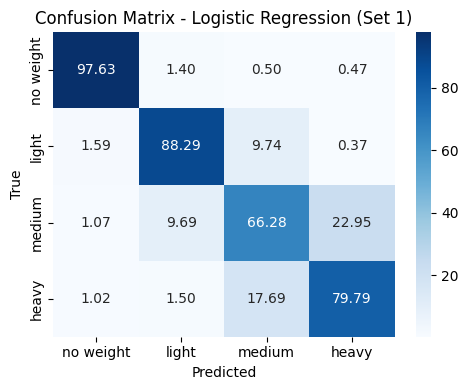

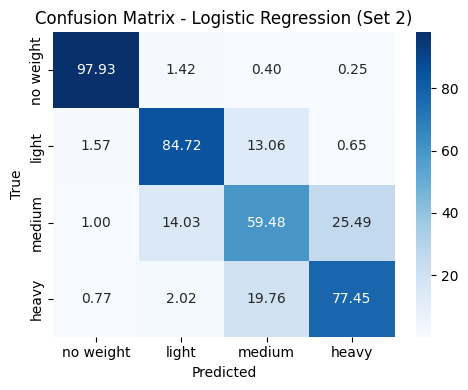

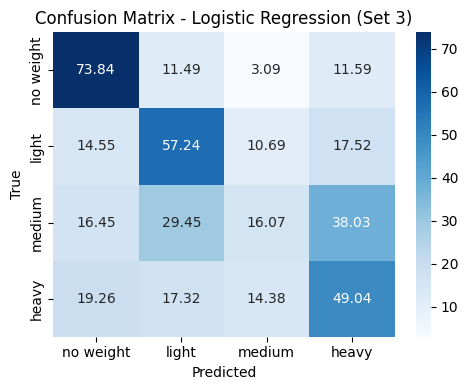

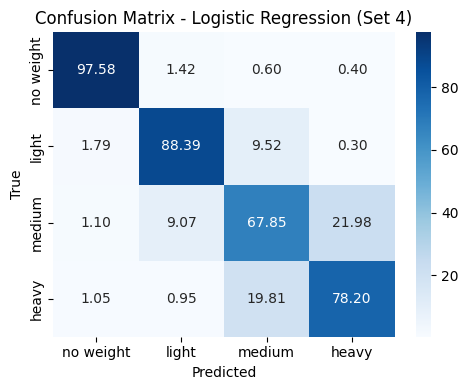

-------- Logistic Regression Classifier - Evaluation Metrics --------
Accuracy: Set 1: 83.00% | Set 2: 79.90% | Set 3: 49.05% | Set 4: 83.01%
Precision: Set 1: 82.82% | Set 2: 79.59% | Set 3: 46.90% | Set 4: 82.89%
Recall: Set 1: 83.00% | Set 2: 79.90% | Set 3: 49.05% | Set 4: 83.01%
F1: Set 1: 82.88% | Set 2: 79.71% | Set 3: 46.67% | Set 4: 82.95%
Training_time: Set 1: 2.8183 s | Set 2: 1.2314 s | Set 3: 0.4048 s | Set 4: 2.8883 s
Inference_time: Set 1: 1.2132 ms | Set 2: 0.9896 ms | Set 3: 0.9056 ms | Set 4: 0.1328 ms


In [63]:
#################################### Logistic Regression ########################
# Logistic Regression is not included in LibEMG. Therefore, skicit_learn is used.
from sklearn.linear_model import LogisticRegression

model_name = 'Logistic Regression'
lr_params = {'penalty': 'l2', 'C': 1.0, 'solver': 'lbfgs', 'max_iter': 2000, 'class_weight': 'balanced'}
folder = f"{output_folder}/{model_name}"

results[model_name] = {'accuracy': [], 'precision': [], 'recall': [], 'f1': [], 'training_time': [], 'inference_time': []}

for i, (X_train, X_test) in enumerate(zip(feature_sets_train, feature_sets_test), start=1):
    model = LogisticRegression(**lr_params)
    
    start_time = time.time() 
    model.fit(X_train, y_train) # Fit the model
    end_time = time.time() 
    tr_time = (end_time - start_time)

    prediction_times = []
    all_preds = []
    
    for j in range(X_test.shape[0]):
        start_time = time.time()
        preds = model.predict(X_test[j:j+1])
        end_time = time.time()
        prediction_times.append(end_time - start_time)
        all_preds.append(preds)
    
    pred_time = np.mean(prediction_times) 
    preds = np.array(all_preds) 

    # Plot confusion matrix
    cm = confusion_matrix(y_test, preds)
    cm_percent = cm.astype('float') / cm.sum(axis=1, keepdims=True) * 100  # percentuale per riga
    class_names = ['no weight', 'light', 'medium', 'heavy']
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm_percent, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    title = f'Confusion Matrix - {model_name}'
    title += f' (Set {i})'
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    #plt.savefig("mio_plot_alta_risoluzione.png", dpi=300, bbox_inches='tight')
    plt.show()
    
    joblib.dump(model, f'{folder}/set_{i}.pkl')
    
    # Metrics
    acc = accuracy_score(y_test, preds) * 100
    precision = precision_score(y_test, preds, average='weighted', zero_division=0) * 100
    recall = recall_score(y_test, preds, average='weighted', zero_division=0) * 100
    f1 = f1_score(y_test, preds, average='weighted', zero_division=0) * 100
    
    results[model_name]['accuracy'].append(acc)
    results[model_name]['precision'].append(precision)
    results[model_name]['recall'].append(recall)
    results[model_name]['f1'].append(f1)
    results[model_name]['training_time'].append(tr_time)
    results[model_name]['inference_time'].append(pred_time)

print_results(model_name, results[model_name])

C:\Users\nicol\anaconda3\envs\emg-env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


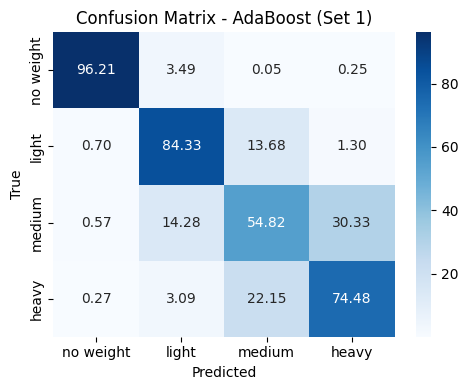

C:\Users\nicol\anaconda3\envs\emg-env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


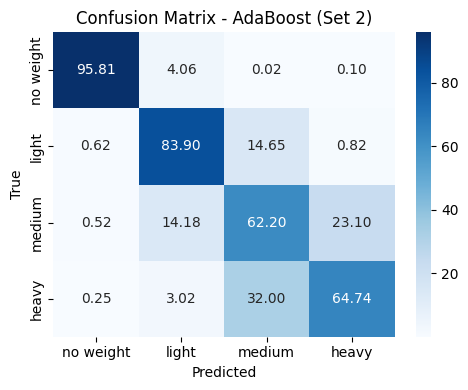

C:\Users\nicol\anaconda3\envs\emg-env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


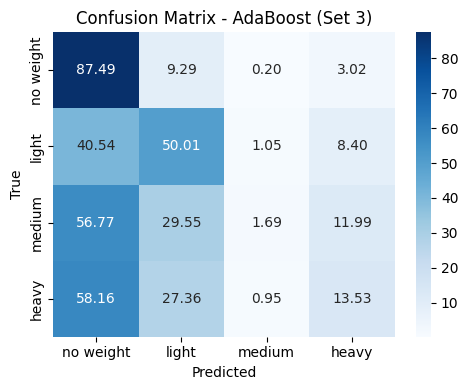

C:\Users\nicol\anaconda3\envs\emg-env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


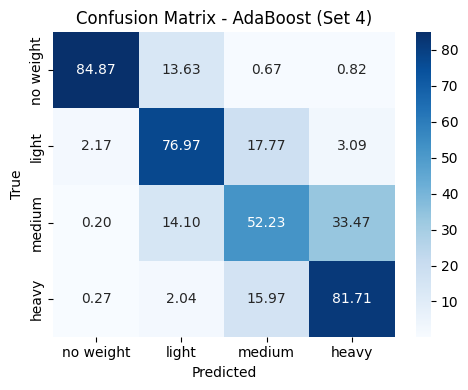

-------- AdaBoost Classifier - Evaluation Metrics --------
Accuracy: Set 1: 77.46% | Set 2: 76.66% | Set 3: 38.18% | Set 4: 73.95%
Precision: Set 1: 77.27% | Set 2: 77.10% | Set 3: 39.82% | Set 4: 74.50%
Recall: Set 1: 77.46% | Set 2: 76.66% | Set 3: 38.18% | Set 4: 73.95%
F1: Set 1: 77.30% | Set 2: 76.78% | Set 3: 30.08% | Set 4: 73.89%
Training_time: Set 1: 23.0587 s | Set 2: 7.5152 s | Set 3: 7.4587 s | Set 4: 39.1077 s
Inference_time: Set 1: 8.0544 ms | Set 2: 7.8715 ms | Set 3: 8.0586 ms | Set 4: 7.1985 ms


In [64]:
#################################### ADA Boost ########################
# ADA Boost is not included in LibEMG. Therefore, skicit_learn is used.
from sklearn.ensemble import AdaBoostClassifier

model_name = 'AdaBoost'
ada_params = {'n_estimators': 50, 'learning_rate': 0.5, 'algorithm': 'SAMME'}
folder = f"{output_folder}/{model_name}"

results[model_name] = {'accuracy': [], 'precision': [], 'recall': [], 'f1': [], 'training_time': [], 'inference_time': []}

for i, (X_train, X_test) in enumerate(zip(feature_sets_train, feature_sets_test), start=1):
    model = AdaBoostClassifier(**ada_params)
    
    start_time = time.time() 
    model.fit(X_train, y_train) # Fit the model
    end_time = time.time() 
    tr_time = (end_time - start_time)

    prediction_times = []
    all_preds = []
    
    for j in range(X_test.shape[0]):
        start_time = time.time()
        preds = model.predict(X_test[j:j+1])
        end_time = time.time()
        prediction_times.append(end_time - start_time)
        all_preds.append(preds)
    
    pred_time = np.mean(prediction_times) 
    preds = np.array(all_preds) 

    # Plot confusion matrix
    cm = confusion_matrix(y_test, preds)
    cm_percent = cm.astype('float') / cm.sum(axis=1, keepdims=True) * 100  # percentuale per riga
    class_names = ['no weight', 'light', 'medium', 'heavy']
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm_percent, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    title = f'Confusion Matrix - {model_name}'
    title += f' (Set {i})'
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.show()
    
    # Metrics
    acc = accuracy_score(y_test, preds) * 100
    precision = precision_score(y_test, preds, average='weighted', zero_division=0) * 100
    recall = recall_score(y_test, preds, average='weighted', zero_division=0) * 100
    f1 = f1_score(y_test, preds, average='weighted', zero_division=0) * 100

    joblib.dump(model, f'{folder}/set_{i}.pkl')
    
    results[model_name]['accuracy'].append(acc)
    results[model_name]['precision'].append(precision)
    results[model_name]['recall'].append(recall)
    results[model_name]['f1'].append(f1)
    results[model_name]['training_time'].append(tr_time)
    results[model_name]['inference_time'].append(pred_time)

print_results(model_name, results[model_name])

In [65]:
metrics = ['accuracy', 'precision', 'recall', 'f1', 'training_time', 'inference_time']
model_names = list(results.keys())
n_sets = len(next(iter(results.values()))['accuracy'])

test_set_names = [
    #"Myo + Trigno - EMG + IMU Selected Features",
    #"Myo + Trigno - EMG Selected Features",
    #"Myo + Trigno - IMU Selected Features",
    #"Myo + Trigno - PCA Features",
    "Myo Only - EMG + IMU Selected Features",
    "Myo Only - EMG Selected Features",
    "Myo Only - IMU Selected Features",
    "Myo Only - PCA Features",
    #"Trigno Only - EMG + IMU Selected Features",
    #"Trigno Only - EMG Selected Features",
    #"Trigno Only - IMU Selected Features",
    #"Trigno Only - PCA Features",
]

assert n_sets == len(test_set_names), f"Expected {len(test_set_names)} test names, but got {n_sets} sets."

#group_names = ['myo_trigno', 'myo_only', 'trigno_only']
group_names = ['myo_only']

# DataFrame per accumulare i risultati per gruppo
group_dfs = {name: pd.DataFrame() for name in group_names}


for i in range(n_sets):
    rows = []
    for model in model_names:
        r = results[model]
        row = {
            'Test Set': test_set_names[i],
            'Model': model,
            'Accuracy': round(r['accuracy'][i], 2),
            'Precision': round(r['precision'][i], 2),
            'Recall': round(r['recall'][i], 2),
            'F1 Score': round(r['f1'][i], 2),
            'Training Time (s)': round(r['training_time'][i], 4),
            'Inference Time (ms)': round(r['inference_time'][i] * 1000, 4)
        }
        rows.append(row)

    df = pd.DataFrame(rows)
    df_sorted = df.sort_values(by='Accuracy', ascending=False)

    # Stampa singolo test set
    print(f"\n📊 Evaluation Results - Test Set: {test_set_names[i]}")
    print(df_sorted.drop(columns='Test Set').to_string(index=False))

    # Identifica il gruppo (ogni 4 test set)
    group_idx = i // 4
    group_name = group_names[group_idx]

    # Accumula i dati nel DataFrame di gruppo
    group_dfs[group_name] = pd.concat([group_dfs[group_name], df_sorted], ignore_index=True)

    # Alla fine di ogni gruppo di 4 test set salva il CSV
    if (i + 1) % 4 == 0:
        csv_name = f'{output_folder}/_results/results_{group_name}.csv'
        group_dfs[group_name].to_csv(csv_name, index=False)


📊 Evaluation Results - Test Set: Myo Only - EMG + IMU Selected Features
              Model  Accuracy  Precision  Recall  F1 Score  Training Time (s)  Inference Time (ms)
                 GB     88.23      88.17   88.23     88.19           335.7658               3.6801
                MLP     84.93      84.79   84.93     84.82            15.3504               1.3928
                SVM     84.83      84.62   84.83     84.70           343.7772               3.6551
                 RF     84.03      83.85   84.03     83.89             1.0652              34.5863
Logistic Regression     83.00      82.82   83.00     82.88             2.8183               1.2132
                KNN     78.10      77.83   78.10     77.95             0.0344               3.7223
           AdaBoost     77.46      77.27   77.46     77.30            23.0587               8.0544
                 NB     72.60      72.64   72.60     72.27             0.0520               1.3600

📊 Evaluation Results - Test Set: My